# Import de fonctions

In [ ]:
from numpy.random import seed
seed(3)

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score as ARI
from sklearn.metrics import adjusted_mutual_info_score as AMI
from sklearn.metrics import balanced_accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import v_measure_score
from skimage.transform import resize
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from scipy.ndimage import grey_dilation, grey_erosion

from sklearn.manifold import TSNE
import numpy as np
import math
import datetime
import sys

In [ ]:
# Fonction pour afficher les données matricielles sous forme d'images
def display_image(X, y, n, label=False):
    dim = 32
    fig, axs = plt.subplots(n, n, figsize=(5,5))

    for i in range(n):
      for j in range(n):
        axs[i,j].imshow(X[j*n+i].reshape((dim,dim)), cmap='gray')
        axs[i,j].axis('off')
    plt.show()

# Define models and datasets

In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import torchvision.models as models
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch
from PIL import Image
import glob

from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import torchvision.models as models
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import torch
import sklearn

# Dataset des chiffres du MNIST
from keras.datasets import mnist


pos_label = 7

(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = np.array([np.pad(img, 2) for img in X_train])
X_test = np.array([np.pad(img, 2) for img in X_test])

# flatten the images
n_samples_train = len(X_train)
X_train = X_train.reshape((n_samples_train, -1))
X_train = X_train - np.min(X_train, 1)[:, None]
X_train = X_train / np.max(X_train, 1)[:, None]
X_train = X_train.reshape((n_samples_train, 32, 32))

n_samples_test = len(X_test)
X_test = X_test.reshape((n_samples_test, -1))
X_test = X_test - np.min(X_test, 1)[:, None]
X_test = X_test / np.max(X_test, 1)[:, None]
X_test = X_test.reshape((n_samples_test, 32, 32))

X_train = np.array(X_train).astype(np.float)
X_test = np.array(X_test).astype(np.float)
y_train = np.array(y_train).astype(np.float)
y_test = np.array(y_test).astype(np.float)

X_train = X_train[y_train==pos_label]
y_train = y_train[y_train==pos_label]
X_test = X_test[y_test==pos_label]
y_test = y_test[y_test==pos_label]

# load ground truth label
import json

label_mapping_seven = {'No bar':0, 'With bar':1}
with open("/content/drive/MyDrive/Neurospin/Thèse Robin/UCSL/mnist_labels.json") as json_file:
    ground_truth_dict = json.load(json_file)
    y_ground_truth = np.array([label_mapping_seven[ground_truth_dict[key]] for key in ground_truth_dict.keys()])

<ipython-input-23-c38982ad6900>:50: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X_train = np.array(X_train).astype(np.float)
<ipython-input-23-c38982ad6900>:51: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X_test = np.array(X_test).astype(np.float)
<ipython-input-23-c38982ad6900>:52: DeprecationWarning: `np.float` is a deprecated alias

In [ ]:
import torch
import numpy as np

from matplotlib.lines import Line2D
from torch.optim.lr_scheduler import StepLR
from matplotlib.patches import Patch

@torch.no_grad()
class SphericalKMeans:
    '''
    Kmeans clustering algorithm implemented with PyTorch
    Parameters:
      n_clusters: int,
        Number of clusters
      max_iter: int, default: 100
        Maximum number of iterations
      tol: float, default: 0.0001
        Tolerance

      mode: {'euclidean', 'cosine'}, default: 'euclidean'
        Type of distance measure
      minibatch: {None, int}, default: None
        Batch size of MinibatchKmeans algorithm
        if None perform full KMeans algorithm

    Attributes:
      centroids: torch.Tensor, shape: [n_clusters, n_features]
        cluster centroids
    '''

    def __init__(self, n_clusters, max_iter=100, tol=1e-8, init="k_means++", n_inits=10, mode="euclidean", minibatch=None):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol
        self.mode = mode
        self.minibatch = minibatch
        self.init = init
        self.n_inits = n_inits

        self.centroids = None
        self.inertia_ = 0

    def kmeans_plus_plus(self, x, K):
        # Kmeans++ initialization
        N, D = x.shape
        c = torch.empty(K, D, dtype=x.dtype, device=x.device)
        # 1. Choose one center uniformly at random among the data points.
        ind = int(torch.floor(torch.rand(1) * N))
        c[0, :] = x[ind, :]
        # 2. For each data point x not chosen yet, compute D(x)^2,
        #    the squared distance between x and the nearest center that has already been chosen.
        # N.B. sq_dists is initialized with infinity values and will be updated through iterations
        sq_dists = 1 / torch.zeros(N, device=x.device)
        # N.B. invarangeN below is used later in step 3
        invarangeN = torch.arange(N, 0, -1, device=x.device, dtype=torch.float32)
        for k in range(K - 1):
            sq_dists = torch.minimum(sq_dists, ((x - c[k, :]) ** 2).sum(-1))
            # 3. Choose one new data point at random as a new center,
            #    using a weighted probability distribution where a point x
            #    is chosen with probability proportional to D(x)^2.
            distrib = torch.cumsum(sq_dists, dim=0)
            ind = torch.argmax(invarangeN * (float(torch.rand(1)) * distrib[-1] < distrib))
            c[k + 1, :] = x[ind, :]
        return c

    @staticmethod
    def cos_sim(a, b):
        """
          Compute cosine similarity of 2 sets of vectors
          Parameters:
          a: torch.Tensor, shape: [m, n_features]
          b: torch.Tensor, shape: [n, n_features]
        """
        a_norm = a.norm(dim=-1, keepdim=True)
        b_norm = b.norm(dim=-1, keepdim=True)
        a = a / (a_norm + 1e-8)
        b = b / (b_norm + 1e-8)
        return a @ b.transpose(-2, -1)

    @staticmethod
    def euc_sim(a, b):
        """
          Compute euclidean similarity of 2 sets of vectors
          Parameters:
          a: torch.Tensor, shape: [m, n_features]
          b: torch.Tensor, shape: [n, n_features]
        """
        assert a.size()[1] == b.size()[1]
        assert len(a.size()) == 2 and len(b.size()) == 2
        distance_matrix = ((a[:, :, None] - b.t()[None, :, :]) ** 2).sum(1)
        return distance_matrix

    def soft_sim(self, a, b):
        """
          Compute soft similarity (or minimum distance) of each vector in a with all of the vectors in b
          Parameters:
          a: torch.Tensor, shape: [m, n_features]
          b: torch.Tensor, shape: [n, n_features]
        """
        soft_sim = 1 / self.euc_sim(a, b)
        soft_sim = soft_sim / soft_sim.sum(1, keepdim=True)
        return soft_sim

    def fit(self, X, centroids=None):
        """
          Combination of fit() and predict() methods.
          This is faster than calling fit() and predict() separately.
          Parameters:
          X: torch.Tensor, shape: [n_samples, n_features]
          centroids: {torch.Tensor, None}, default: None
            if given, centroids will be initialized with given tensor
            if None, centroids will be randomly chosen from X
          Return:
          labels: torch.Tensor, shape: [n_samples]
        """
        batch_size, emb_dim = X.shape
        device = X.device.type

        centroids_list = []
        inertias_list = []
        for init in range(self.n_inits):
            if centroids is None:
                if self.init == "k_means++":
                    self.centroids = self.kmeans_plus_plus(X, self.n_clusters)
                else:
                    self.centroids = X[np.random.choice(batch_size, size=[self.n_clusters], replace=False)]
            else:
                self.centroids = centroids
            self.centroids = torch.nn.functional.normalize(self.centroids, dim=1, p=2)

            num_points_in_clusters = torch.ones(self.n_clusters, device=device)

            for i in range(self.max_iter):
                # Expectation
                soft_sim_ = self.soft_sim(X, self.centroids)
                hard_sim = torch.nn.functional.one_hot(soft_sim_.argmax(1), num_classes=self.n_clusters).float()
                c_grad = (hard_sim.t() @ X) / hard_sim.t().sum(1, keepdim=True)
                c_grad = torch.nn.functional.normalize(c_grad, dim=1, p=2)

                error = (c_grad - self.centroids).pow(2).sum()
                if self.minibatch is not None:
                    lr = 1 / num_points_in_clusters[:, None] * 0.9 + 0.1
                else:
                    lr = 1
                num_points_in_clusters += hard_sim.sum(0)
                self.centroids = (1-lr)*self.centroids + lr*c_grad
                self.centroids = torch.nn.functional.normalize(self.centroids, dim=1, p=2)
                if error <= self.tol:
                    break
            soft_sim_ = self.soft_sim(X, self.centroids)
            hard_sim = torch.nn.functional.one_hot(soft_sim_.argmax(1), num_classes=self.n_clusters).float()
            self.inertia_ = (hard_sim*self.euc_sim(X, self.centroids)).sum()
            inertias_list.append(self.inertia_.cpu().numpy())
            centroids_list.append(self.centroids)

        best_init_idx = np.argmin(inertias_list)
        self.inertia_ = inertias_list[best_init_idx]
        self.centroids = centroids_list[best_init_idx]
        return self

    def predict(self, X):
        """
          Predict the closest cluster each sample in X belongs to
          Parameters:
          X: torch.Tensor, shape: [n_samples, n_features]
          Return:
          labels: torch.Tensor, shape: [n_samples]
        """
        return self.soft_sim(a=X, b=self.centroids).argmax(1)

    def predict_proba(self, X):
        """
          Predict the closest cluster each sample in X belongs to
          Parameters:
          X: torch.Tensor, shape: [n_samples, n_features]
          Return:
          labels: torch.Tensor, shape: [n_samples]
        """
        return self.soft_sim(a=X, b=self.centroids)

    def fit_predict(self, X, centroids=None):
        """
          Perform kmeans clustering
          Parameters:
          X: torch.Tensor, shape: [n_samples, n_features]
        """
        self.fit(X, centroids)
        return self.predict(X)


/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py:125: UserWarning: Decorating classes is deprecated and will be disabled in future versions. You should only decorate functions or methods. To preserve the current behavior of class decoration, you can directly decorate the `__init__` method and nothing else.
  warnings.warn("Decorating classes is deprecated and will be disabled in "


In [ ]:
colors_per_cluster = {
                      -1:np.array([0.4,0.4,0.4]),
                      0:np.array([0.9,0.05,0.05]),
                      1:np.array([0.15,0.15,0.85])
                      }

# scale and move the coordinates so they fit [0; 1] range
def scale_to_01_range(x):
    # compute the distribution range
    value_range = (np.max(x) - np.min(x))
    # move the distribution so that it starts from zero
    # by extracting the minimal value from all its values
    starts_from_zero = x - np.min(x)
    # make the distribution fit [0; 1] by dividing by its range
    return starts_from_zero / value_range

# Compute the coordinates of the image on the plot
def compute_plot_coordinates(image, x, y, image_centers_area_size, offset=8):
    image_height, image_width, _ = image.shape
    # compute the image center coordinates on the plot
    center_x = int(image_centers_area_size * x) + offset
    # in matplotlib, the y axis is directed upward
    # to have the same here, we need to mirror the y coordinate
    center_y = int(image_centers_area_size * (1 - y)) + offset
    # knowing the image center,
    # compute the coordinates of the top left and bottom right corner
    tl_x = center_x - int(image_width / 2)
    tl_y = center_y - int(image_height / 2)
    br_x = tl_x + image_width
    br_y = tl_y + image_height
    return tl_x, tl_y, br_x, br_y

def draw_rectangle_by_conditional_pred(image, label_pred_conditionnaly_to_cluster, plot_neg=True, false_pred=False) :
  image = np.stack((image,)*3, axis=-1)

  if false_pred :
    color = np.array([0.05,1,0.05])
  elif plot_neg :
    color = colors_per_cluster[0]*label_pred_conditionnaly_to_cluster[0] + colors_per_cluster[-1]*(1-label_pred_conditionnaly_to_cluster[0])
    color += colors_per_cluster[1]*label_pred_conditionnaly_to_cluster[1] + colors_per_cluster[-1]*(1-label_pred_conditionnaly_to_cluster[1])
    color = color / 2
  else :
    color = colors_per_cluster[0]*label_pred_conditionnaly_to_cluster[0]
    color += colors_per_cluster[1]*label_pred_conditionnaly_to_cluster[1]
  image[:2,:,:] = color
  image[:,-2:,:] = color
  image[-2:,:,:] = color
  image[:,:2,:] = color
  return image

def create_visualization(two_dim_latent_space, X_test, y_test, y_ground_truth, y_pred) :
  img_dim = 32
  offset = img_dim // 2 + 1
  huge_image_size = 2*250

  # extract x and y coordinates representing the positions of the images on T-SNE plot
  two_dim_latent_space = sklearn.preprocessing.RobustScaler().fit_transform(two_dim_latent_space)
  tx = two_dim_latent_space[:, 0]
  ty = two_dim_latent_space[:, 1]
  tx = scale_to_01_range(tx)
  ty = scale_to_01_range(ty)

  # init the plot as white canvas
  tsne_plot = np.ones((huge_image_size+2*offset+1, huge_image_size+2*offset+1, 3))

  c=0
  t=0
  # now we'll put a small copy of every image to its corresponding latent space coordinate
  for image, label, pred, x, y in zip(X_test, y_test, y_pred, tx, ty) :
      if label != 7 :
        if np.random.uniform(0,1) > 0.99 :
          continue
      elif c >= len(y_ground_truth) :
        continue
      else :
        cluster=y_ground_truth[c]
        c+=1
      image = np.reshape(image, (img_dim,img_dim))
      if label==7 and  cluster==0 :
        image = draw_rectangle_by_conditional_pred(image, {0:0, 1:1}, plot_neg=False)
      if label==7 and cluster==1 :
        image = draw_rectangle_by_conditional_pred(image, {0:1, 1:0}, plot_neg=False)
      if label!=7 :
        image = draw_rectangle_by_conditional_pred(image, {0:0, 1:0})
      # compute the coordinates of the image on the scaled plot visualization
      tl_x, tl_y, br_x, br_y = compute_plot_coordinates(image, x, y, huge_image_size)
      # put the image to its t-SNE coordinates using numpy sub-array indices
      if np.sum(tsne_plot[tl_y:br_y, tl_x:br_x])/3 > (img_dim**2-(offset-1)**2) :
        tsne_plot[tl_y:br_y, tl_x:br_x, :] = image
        t=t+1


  fig = plt.figure(figsize=(10, 10))

  legend_elements = [Patch(label='Negative class', fill=False, edgecolor='#999999', linewidth=3),
                    Patch(label='Subgroup 0', fill=False, edgecolor='b', linewidth=3),
                    Patch(label='Subgroup 1', fill=False, edgecolor='r', linewidth=3),]

  plt.axis('off')
  # plt.legend(handles=legend_elements, loc='lower right', prop={'size': 10})
  plt.imshow(tsne_plot)
  plt.show()




# Dataset and Model Architecture

In [ ]:
class MyDataset(Dataset):
    def __init__(self, data, target, cluster_pseudo_labels=None, test=False):
        self.data = data
        self.target = torch.from_numpy(target).float()
        if cluster_pseudo_labels is not None :
          self.cluster_pseudo_labels = torch.from_numpy(cluster_pseudo_labels).float()
        else :
          self.cluster_pseudo_labels = None
        self.transform = transforms.Compose([
                            transforms.ToTensor(),
                            transforms.RandomRotation(25),
                            transforms.RandomAffine(15, translate=(0.1, 0.1), shear=0.1),
                        ])
        self.test = test

    def __len__(self):
        return len(self.target)

    def __getitem__(self, index):
        x = self.data[index]
        x_1 = torch.tensor(x)[None,:,:].float()
        x_2 = self.transform(x).float()
        y = self.target[index].float()
        if self.cluster_pseudo_labels is not None :
          y_pseudo_label = self.cluster_pseudo_labels[index].float()
          return x_1.cuda(), x_2.cuda(), y.cuda(), y_pseudo_label.cuda()
        return x_1.cuda(), x_2.cuda(), y.cuda()

In [ ]:
# Encoder model
class SimpleConvNet(nn.Module):
    def __init__(self, nc, hidden_mlp, output_dim, n_clusters, kernel_size=7):
        super(SimpleConvNet, self).__init__()

        padding = kernel_size // 2
        layers = [
            nn.Conv2d(nc, 16, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 32, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        ]
        self.backbone = nn.Sequential(*layers)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        self.projection_head = nn.Sequential(
                nn.Linear(128, hidden_mlp),
                nn.ReLU(inplace=True),
                nn.Linear(hidden_mlp, output_dim),
            )

        self.prototypes = nn.Linear(output_dim, n_clusters, bias=False)
        self.prototypes.weight.data = torch.nn.functional.normalize(self.prototypes.weight.data, dim=1, p=2)
        self.temperature = 0.1

    def forward(self, x):
        # convolutional backbone
        encoded_features = self.backbone(x)
        encoded_features = self.avgpool(encoded_features)
        encoded_features = torch.flatten(encoded_features, 1)

        # non linear mlp head
        head_features = self.projection_head(encoded_features)
        head_features = nn.functional.normalize(head_features, dim=1, p=2)

        # compute clustering probabilities
        probabilities = torch.exp(self.prototypes(head_features / self.temperature))
        probabilities = probabilities / probabilities.sum(1)[:, None]
        return probabilities, head_features


# Deep Clustering

KM balanced accuracy score with hand-crafted labels :  0.5340617186697263
------------------------------------------------------------------
Epoch: 0 	Training Loss: 173.612672
         	Testing Loss: 142.431288


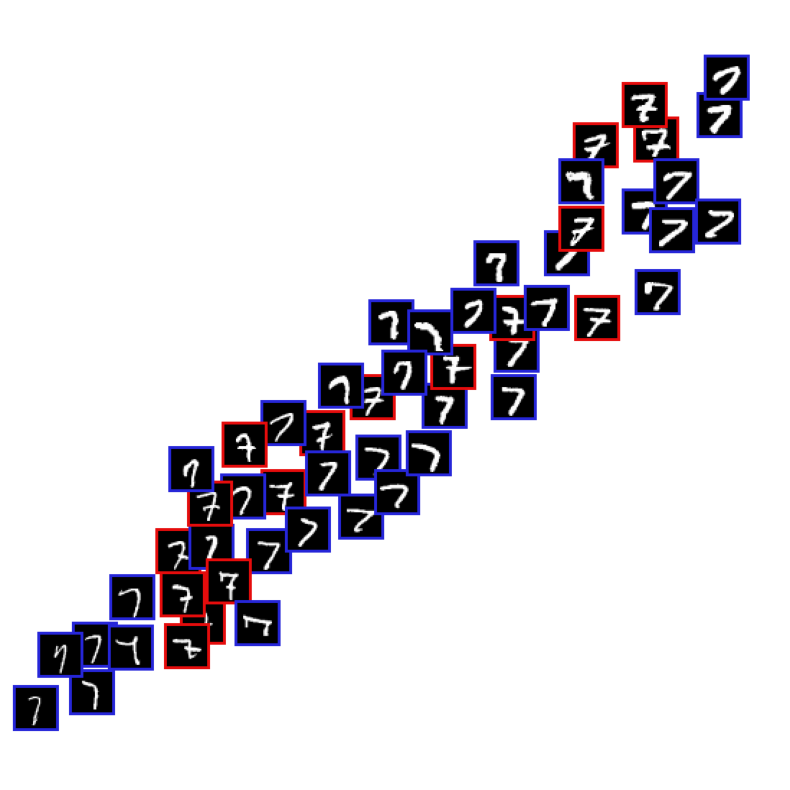

KM balanced accuracy score with hand-crafted labels :  0.5308593348631709
------------------------------------------------------------------
Epoch: 1 	Training Loss: 173.722799
         	Testing Loss: 139.013300


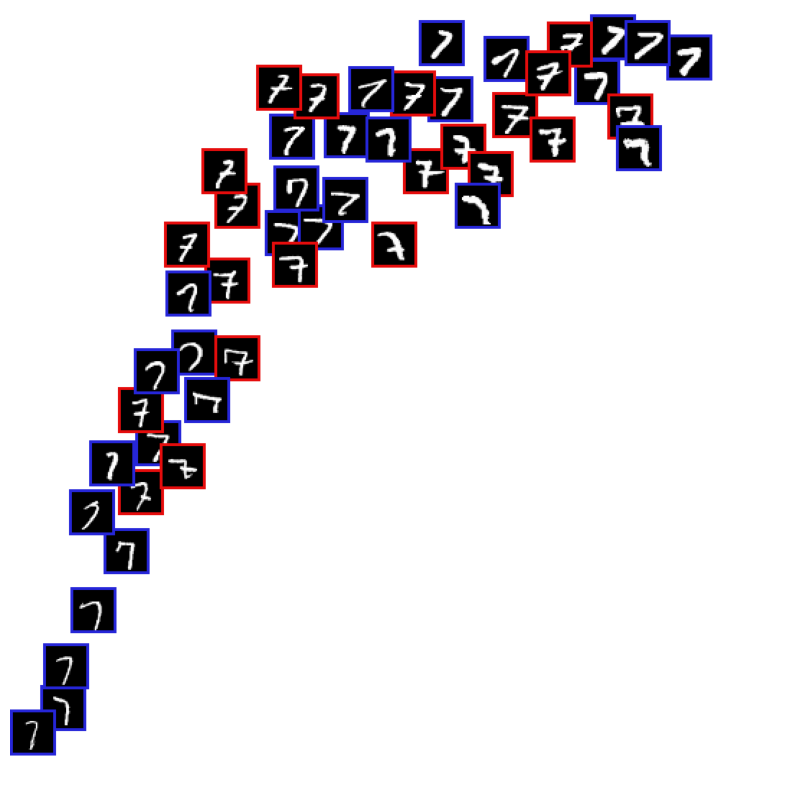

KM balanced accuracy score with hand-crafted labels :  0.5206014316539371
------------------------------------------------------------------
Epoch: 2 	Training Loss: 115.276082
         	Testing Loss: 91.686222


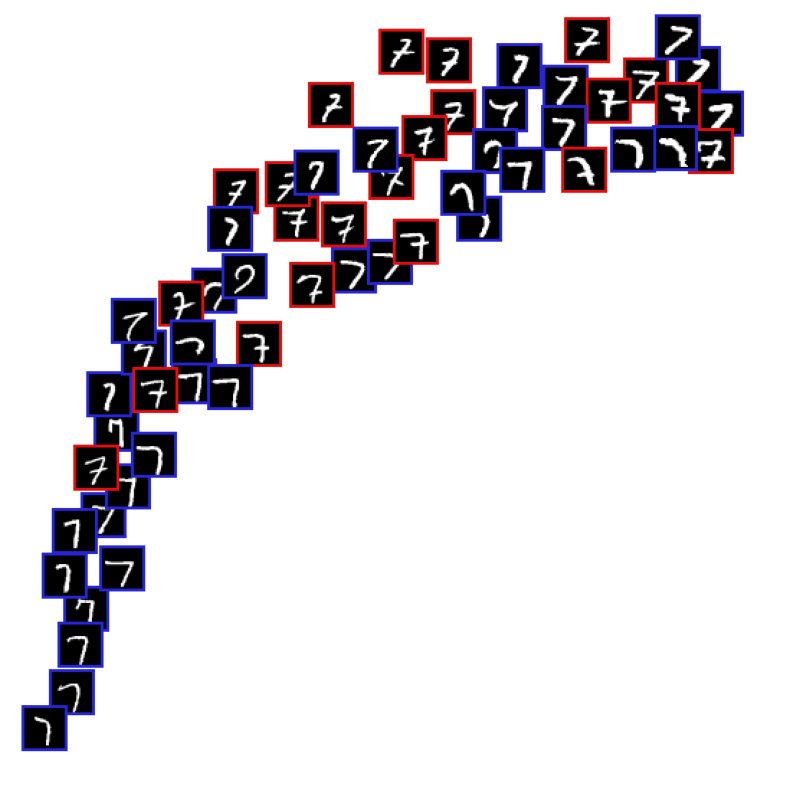

KM balanced accuracy score with hand-crafted labels :  0.5696818166249957
------------------------------------------------------------------
Epoch: 3 	Training Loss: 106.461411
         	Testing Loss: 83.453936


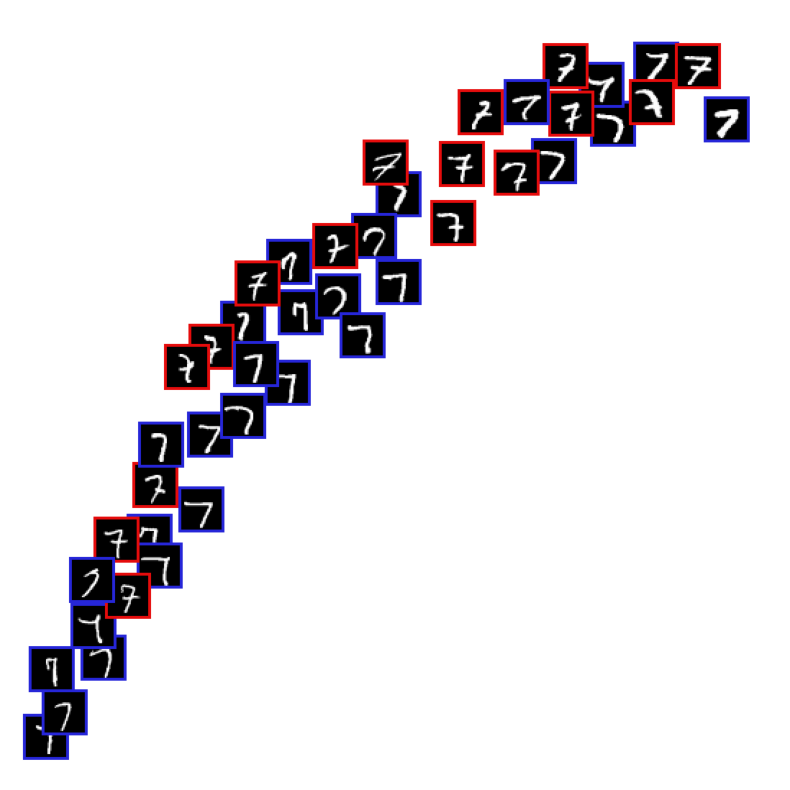

KM balanced accuracy score with hand-crafted labels :  0.5825084768983115
------------------------------------------------------------------
Epoch: 4 	Training Loss: 105.695765
         	Testing Loss: 79.780277


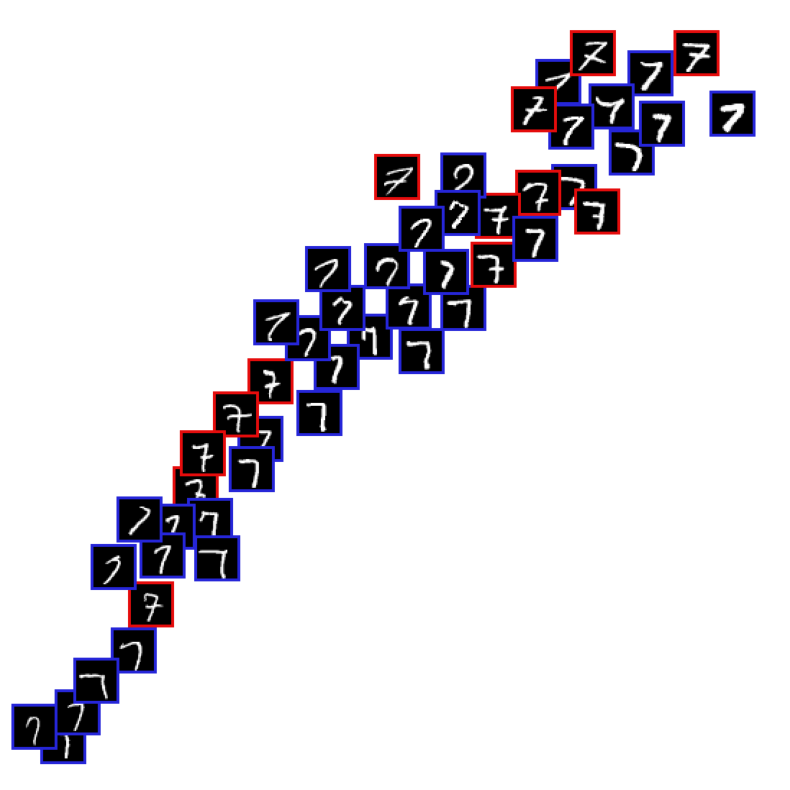

KM balanced accuracy score with hand-crafted labels :  0.5640648011782032
------------------------------------------------------------------
Epoch: 5 	Training Loss: 99.680832
         	Testing Loss: 78.197867


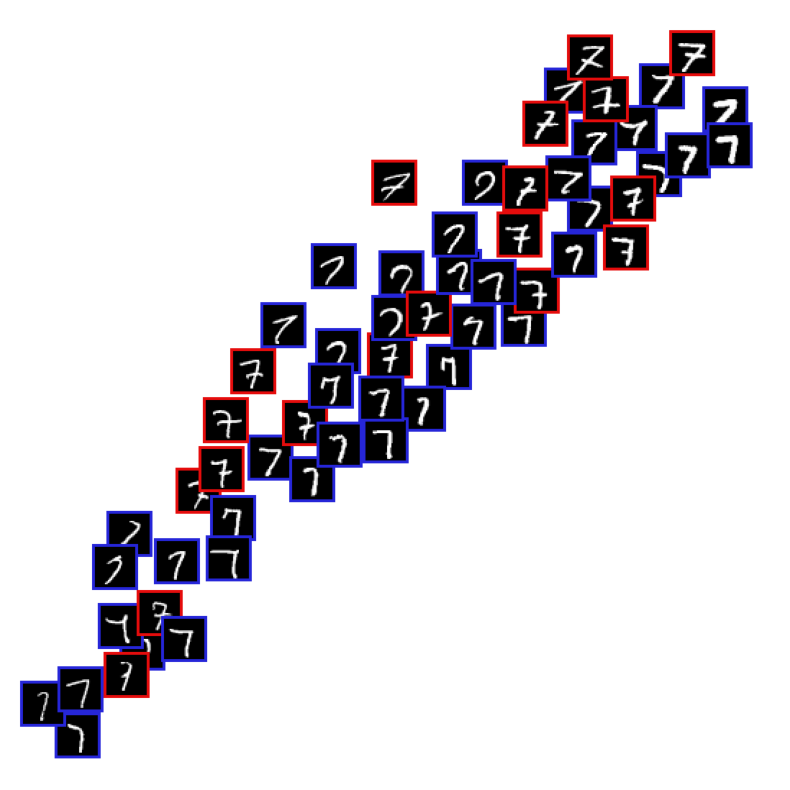

KM balanced accuracy score with hand-crafted labels :  0.5629174230229133
------------------------------------------------------------------
Epoch: 6 	Training Loss: 97.591144
         	Testing Loss: 76.410440


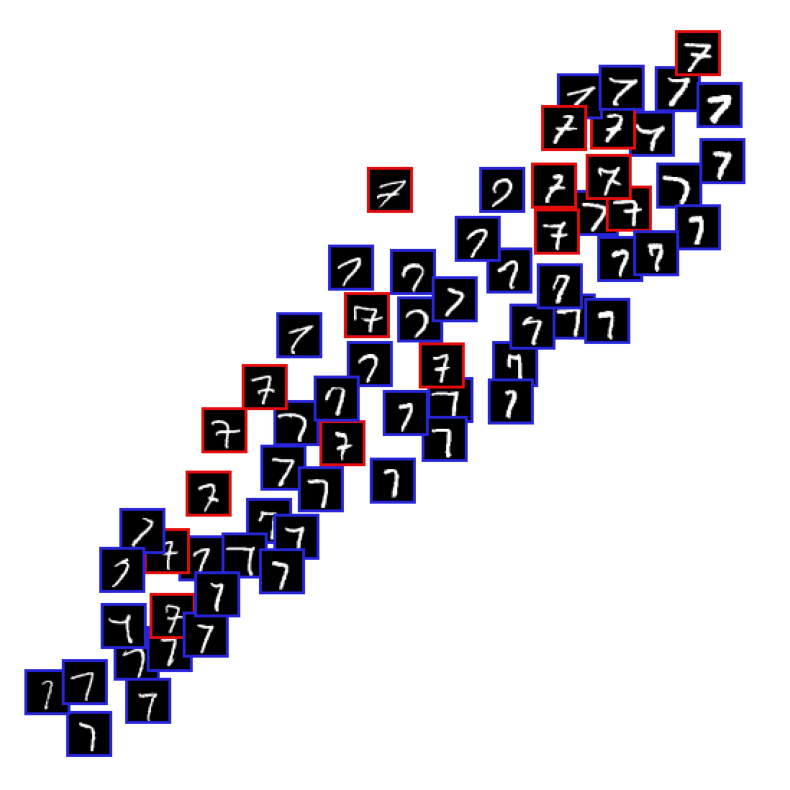

KM balanced accuracy score with hand-crafted labels :  0.5547830256533206
------------------------------------------------------------------
Epoch: 7 	Training Loss: 96.482331
         	Testing Loss: 75.279133


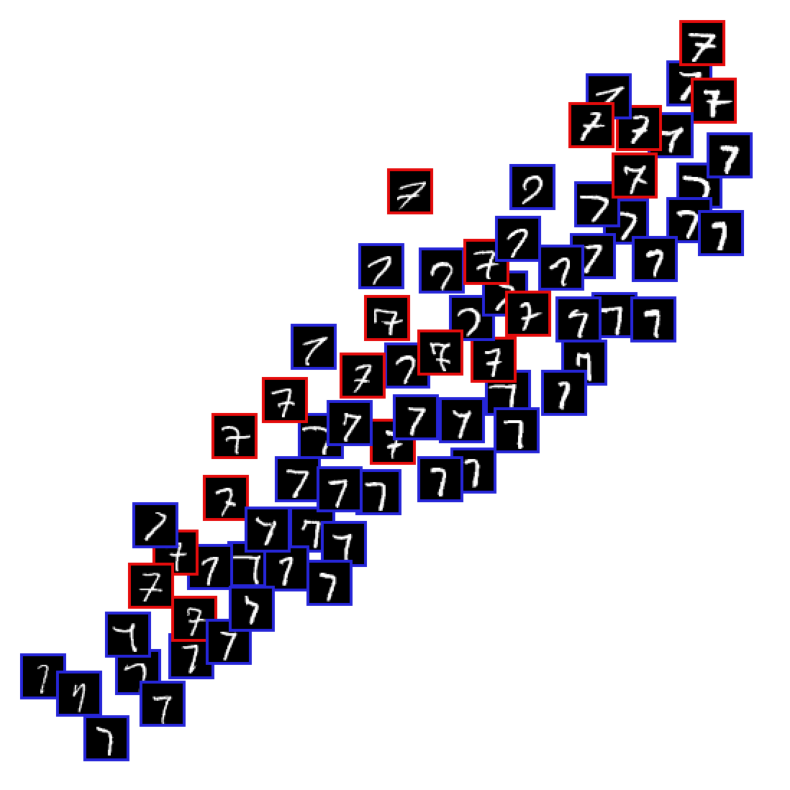

KM balanced accuracy score with hand-crafted labels :  0.5587902866732883
------------------------------------------------------------------
Epoch: 8 	Training Loss: 95.879535
         	Testing Loss: 75.881160


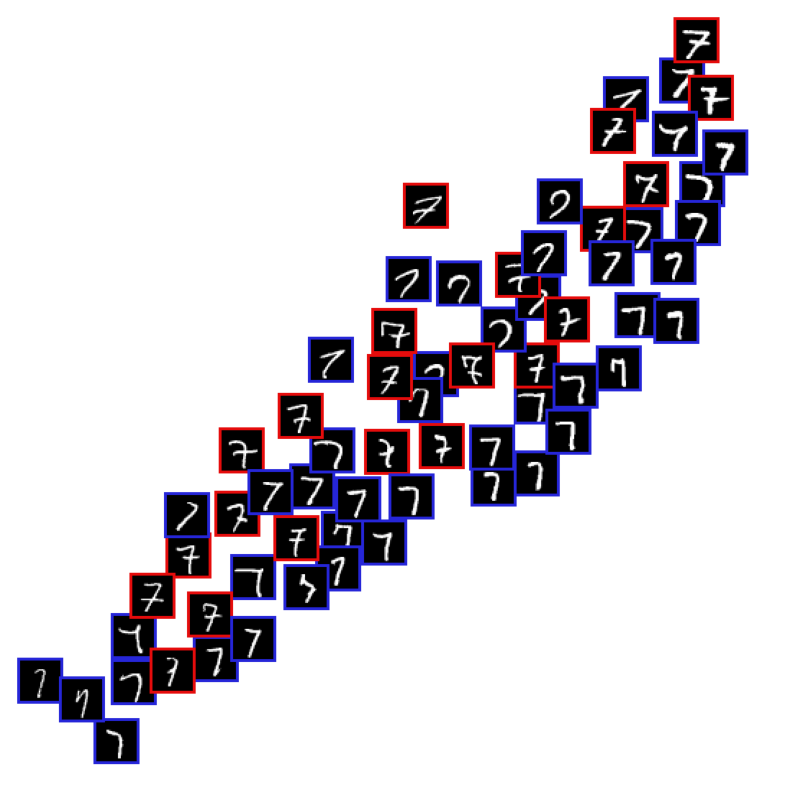

KM balanced accuracy score with hand-crafted labels :  0.5489947597355893
------------------------------------------------------------------
Epoch: 9 	Training Loss: 94.431640
         	Testing Loss: 74.705522


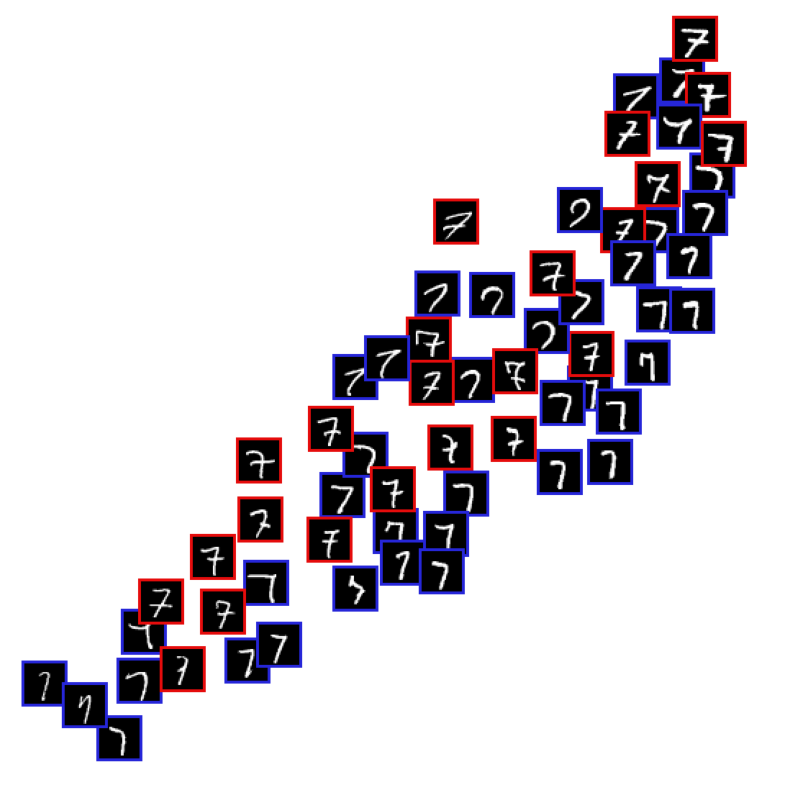

KM balanced accuracy score with hand-crafted labels :  0.5598177894989211
------------------------------------------------------------------
Epoch: 10 	Training Loss: 93.880500
         	Testing Loss: 74.743990


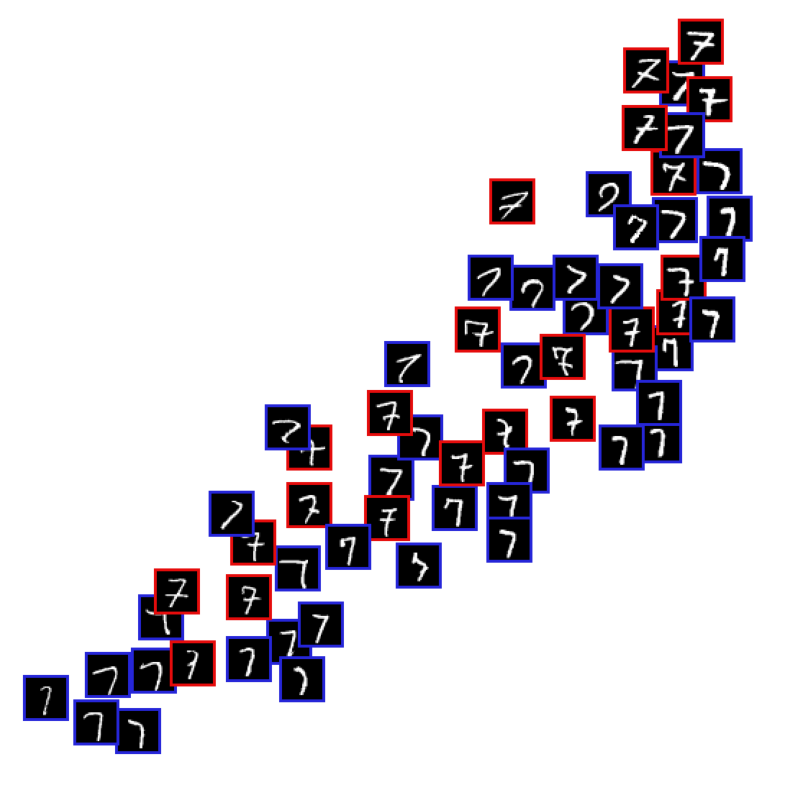

KM balanced accuracy score with hand-crafted labels :  0.5601602904407987
------------------------------------------------------------------
Epoch: 11 	Training Loss: 93.176438
         	Testing Loss: 74.678428


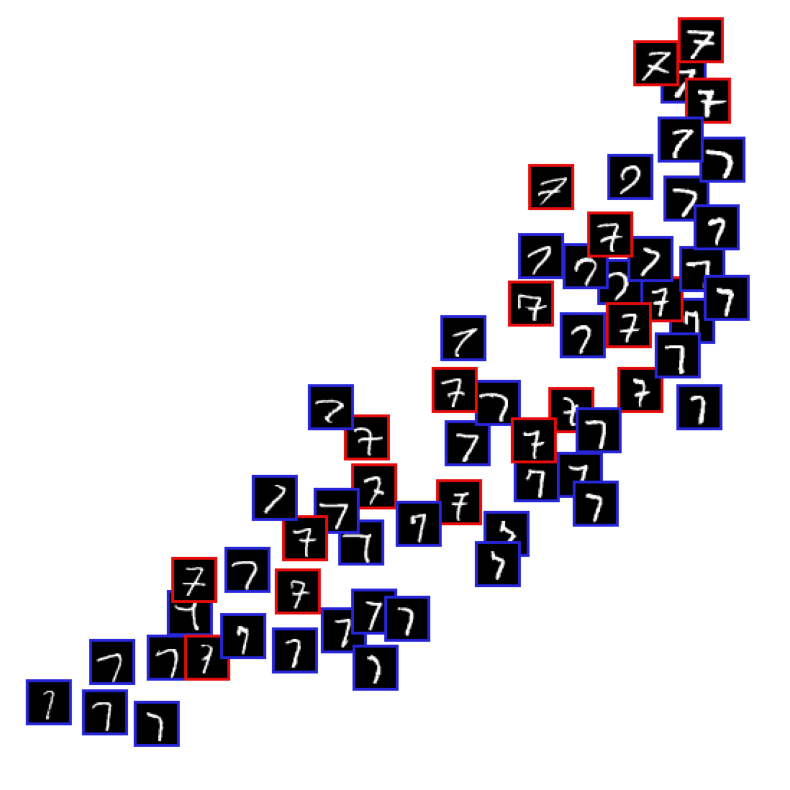

KM balanced accuracy score with hand-crafted labels :  0.5743055793403432
------------------------------------------------------------------
Epoch: 12 	Training Loss: 92.830385
         	Testing Loss: 74.148195


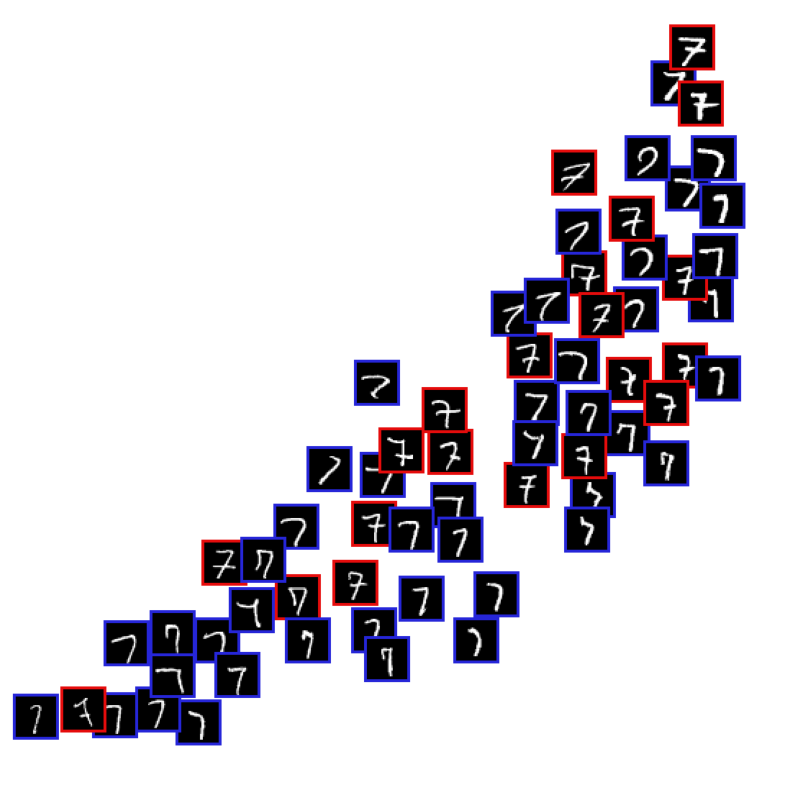

KM balanced accuracy score with hand-crafted labels :  0.5768229612631435
------------------------------------------------------------------
Epoch: 13 	Training Loss: 92.248598
         	Testing Loss: 73.604739


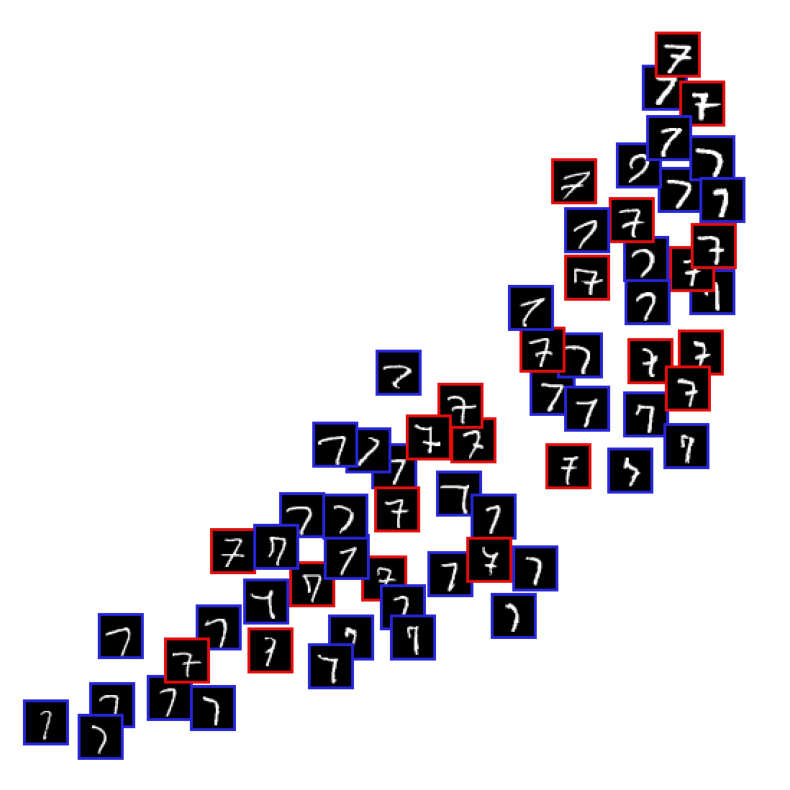

KM balanced accuracy score with hand-crafted labels :  0.5755043326369147
------------------------------------------------------------------
Epoch: 14 	Training Loss: 91.279314
         	Testing Loss: 72.978384


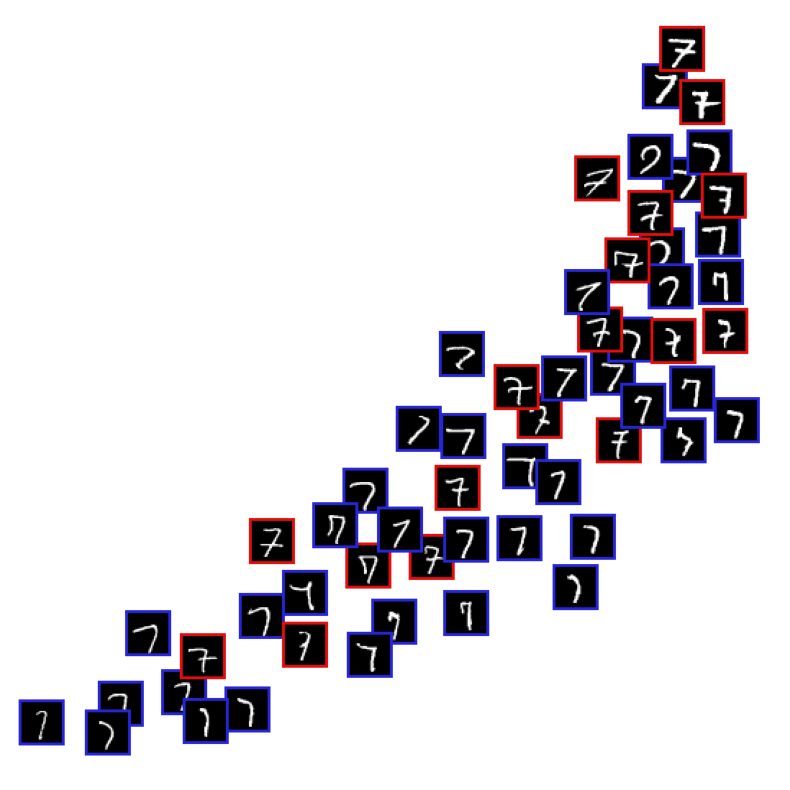

KM balanced accuracy score with hand-crafted labels :  0.5622152960920642
------------------------------------------------------------------
Epoch: 15 	Training Loss: 90.459833
         	Testing Loss: 72.466156


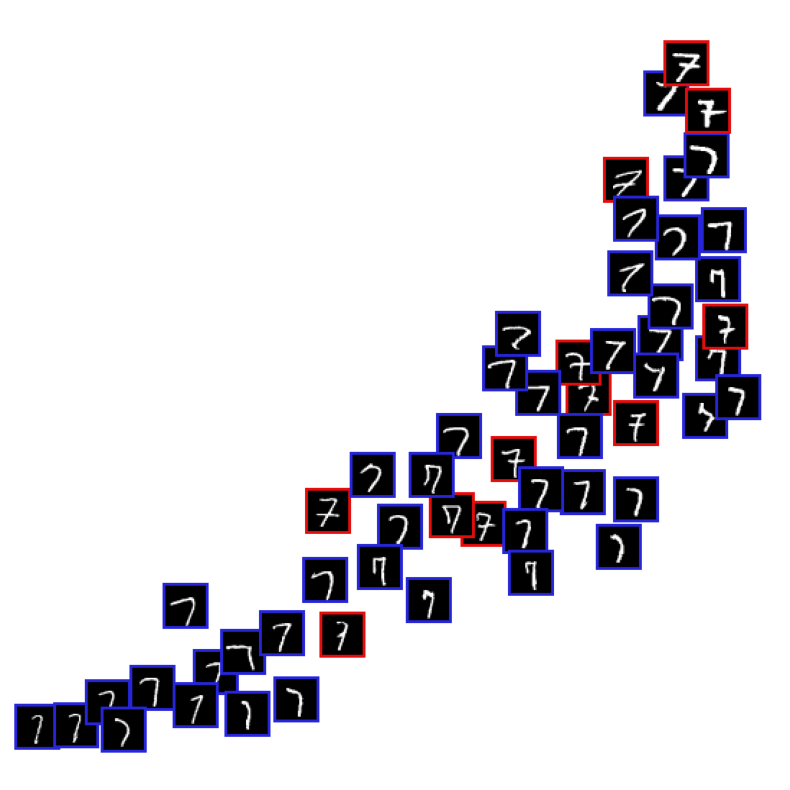

KM balanced accuracy score with hand-crafted labels :  0.5608966674658356
------------------------------------------------------------------
Epoch: 16 	Training Loss: 90.787473
         	Testing Loss: 73.844024


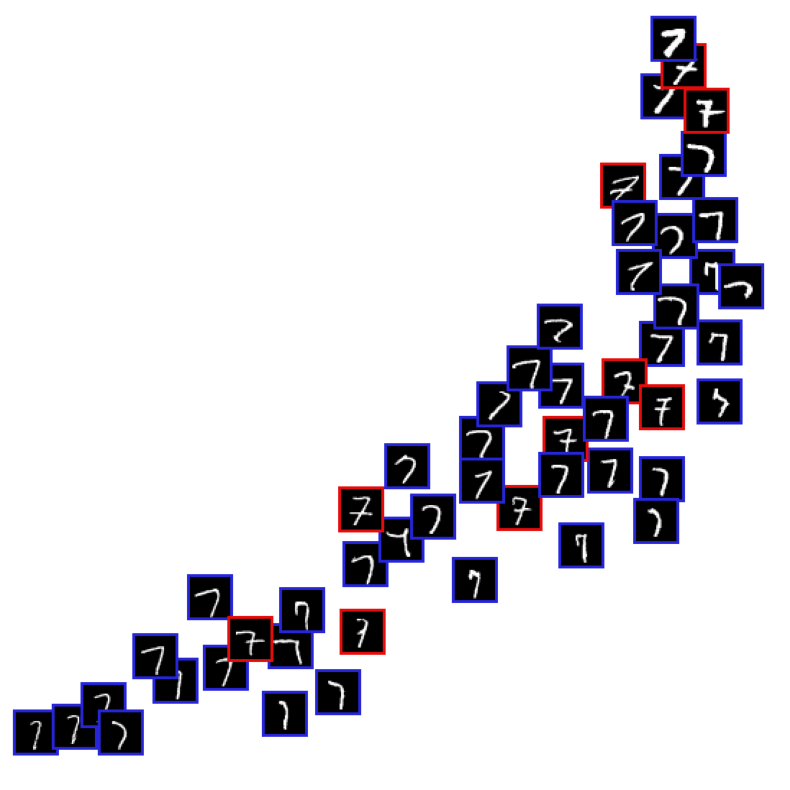

KM balanced accuracy score with hand-crafted labels :  0.5529335205671815
------------------------------------------------------------------
Epoch: 17 	Training Loss: 89.556111
         	Testing Loss: 72.634596


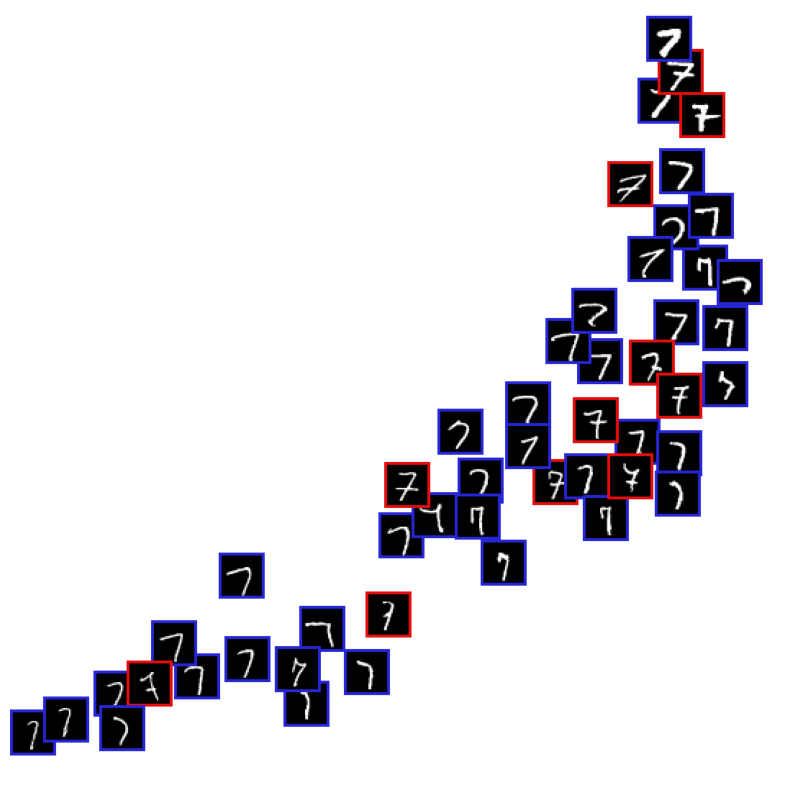

KM balanced accuracy score with hand-crafted labels :  0.5414768640613762
------------------------------------------------------------------
Epoch: 18 	Training Loss: 89.575824
         	Testing Loss: 71.916086


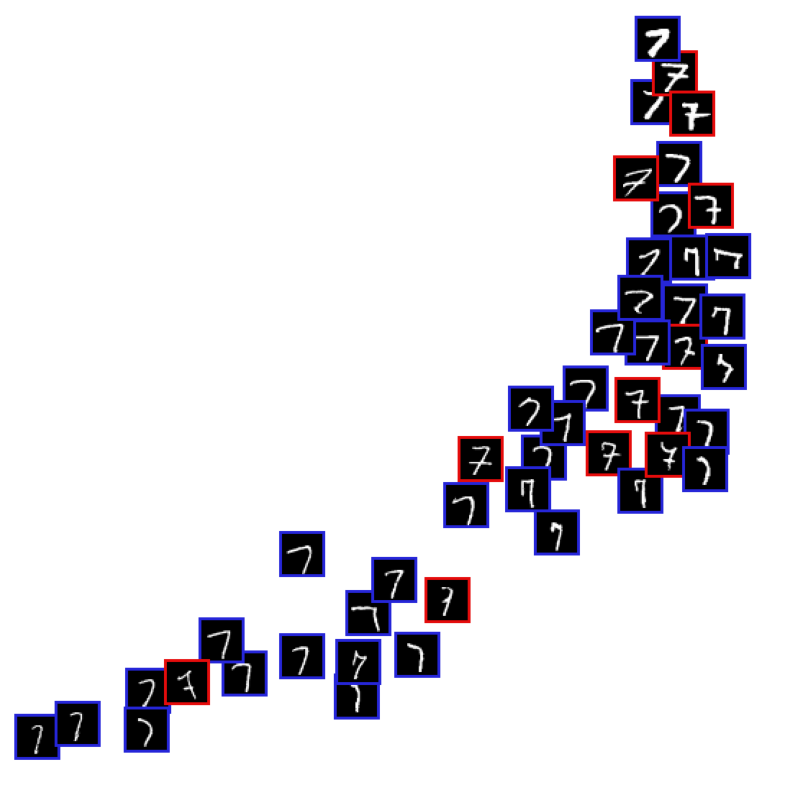

KM balanced accuracy score with hand-crafted labels :  0.5318525875946158
------------------------------------------------------------------
Epoch: 19 	Training Loss: 89.770196
         	Testing Loss: 71.619130


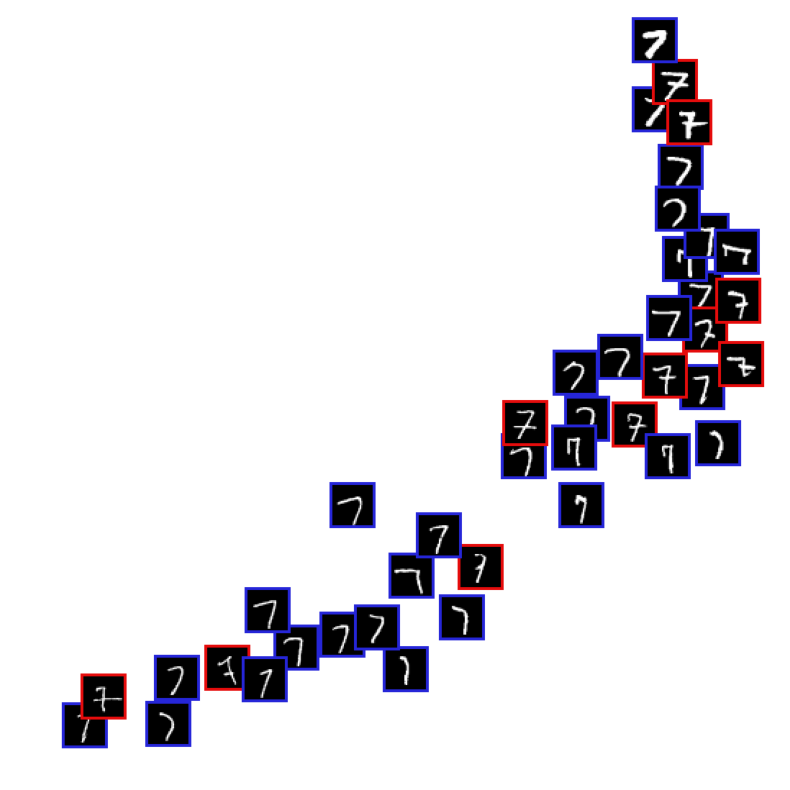

KM balanced accuracy score with hand-crafted labels :  0.5235469397540843
------------------------------------------------------------------
Epoch: 20 	Training Loss: 89.511229
         	Testing Loss: 70.659097


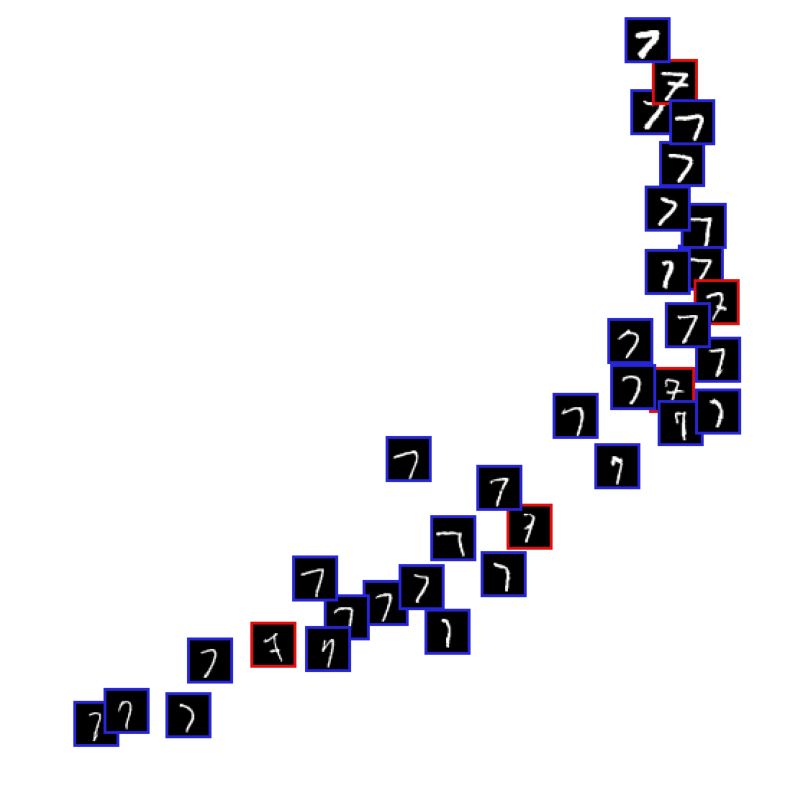

KM balanced accuracy score with hand-crafted labels :  0.5203959310888105
------------------------------------------------------------------
Epoch: 21 	Training Loss: 89.382783
         	Testing Loss: 70.668858


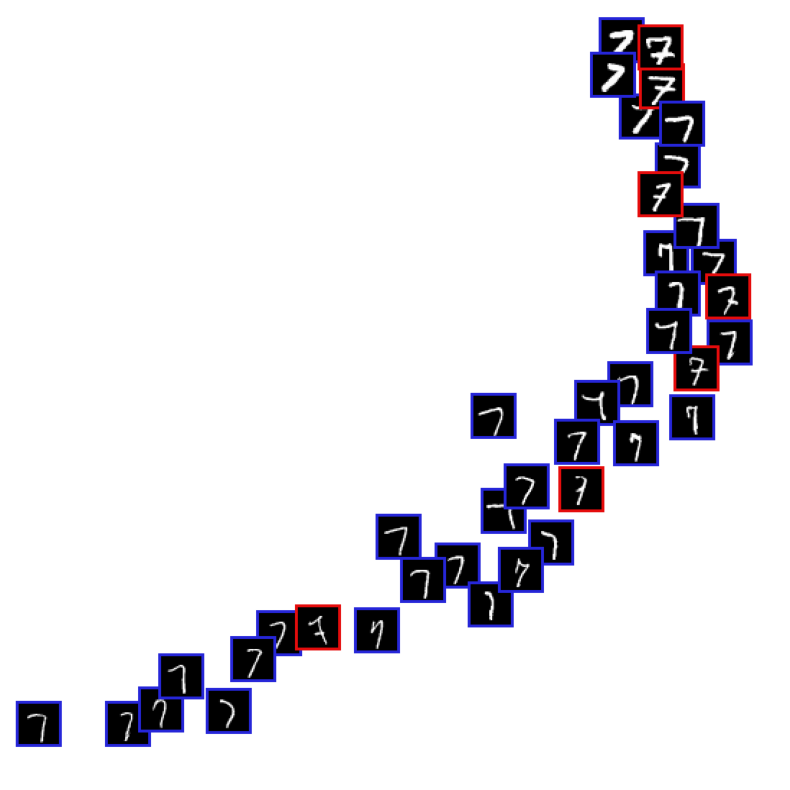

KM balanced accuracy score with hand-crafted labels :  0.5222283111278556
------------------------------------------------------------------
Epoch: 22 	Training Loss: 90.348368
         	Testing Loss: 71.428138


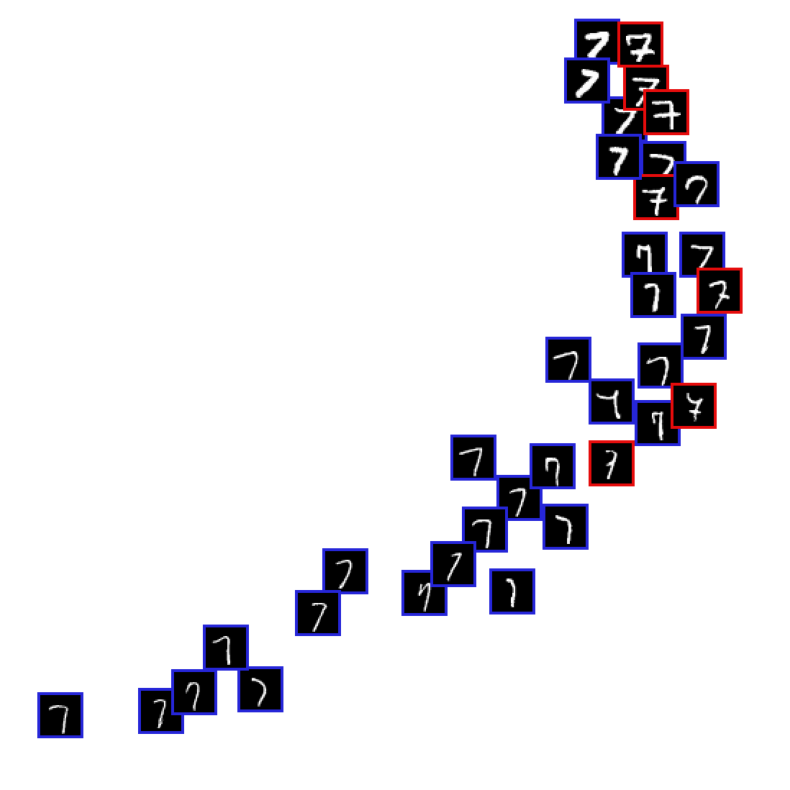

KM balanced accuracy score with hand-crafted labels :  0.525721820735007
------------------------------------------------------------------
Epoch: 23 	Training Loss: 90.610169
         	Testing Loss: 71.866548


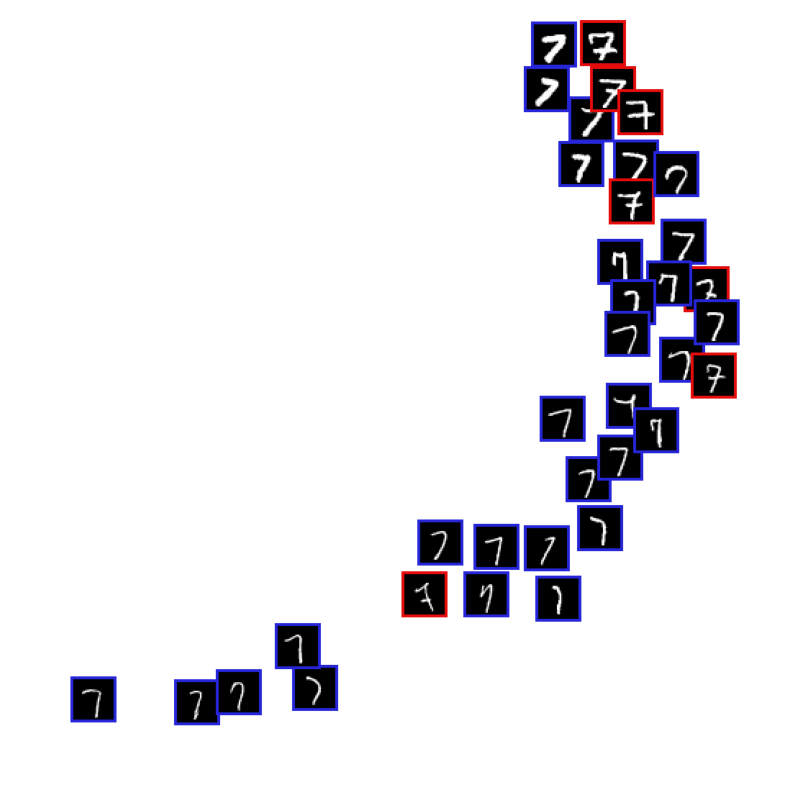

KM balanced accuracy score with hand-crafted labels :  0.5240606911669007
------------------------------------------------------------------
Epoch: 24 	Training Loss: 93.234532
         	Testing Loss: 73.602790


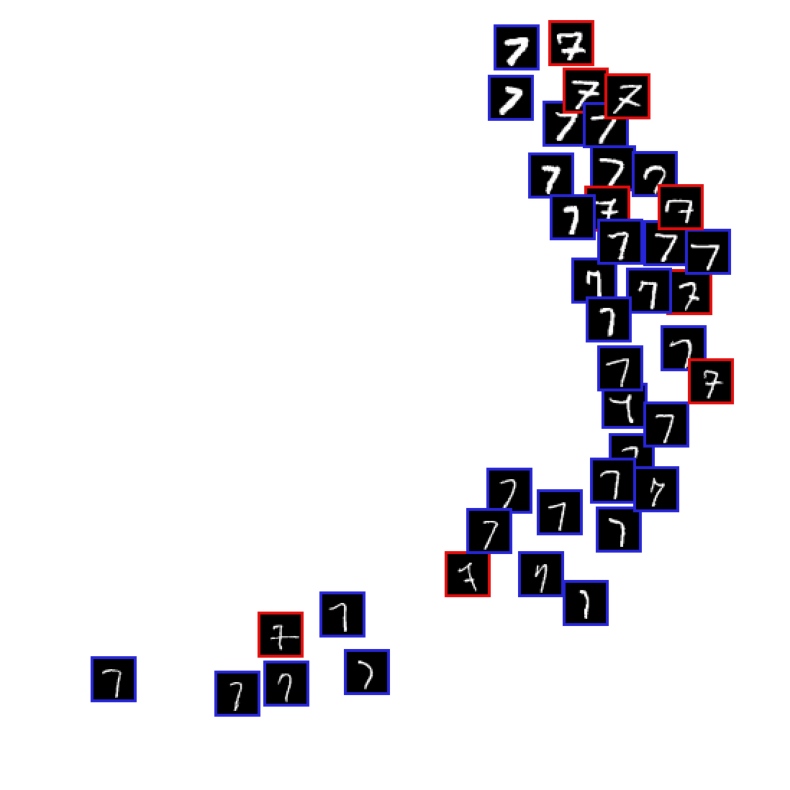

KM balanced accuracy score with hand-crafted labels :  0.5223995615987944
------------------------------------------------------------------
Epoch: 25 	Training Loss: 96.259778
         	Testing Loss: 76.204388


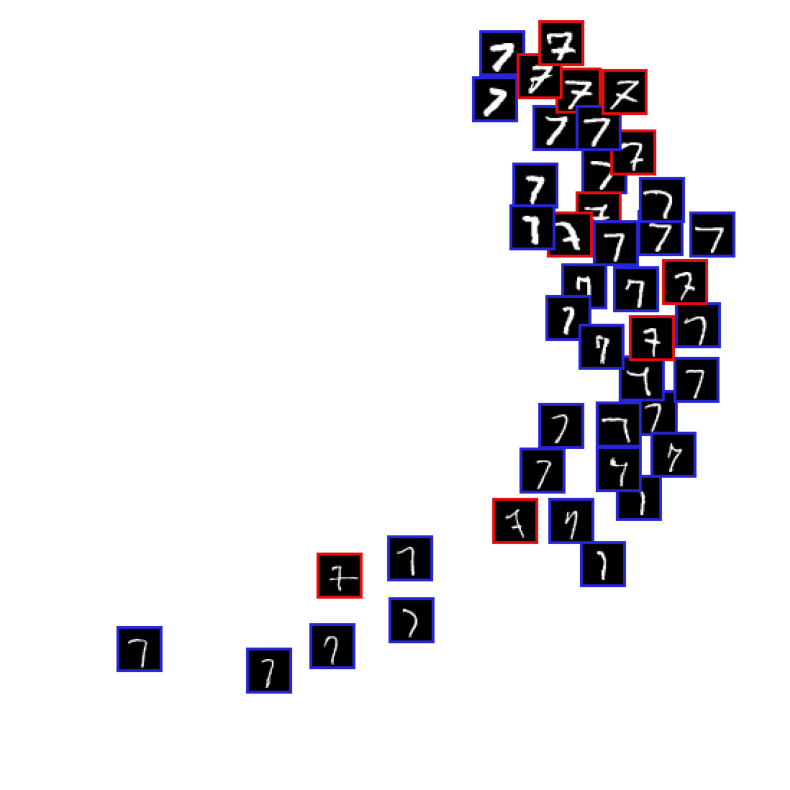

KM balanced accuracy score with hand-crafted labels :  0.520909682501627
------------------------------------------------------------------
Epoch: 26 	Training Loss: 96.381078
         	Testing Loss: 75.986246


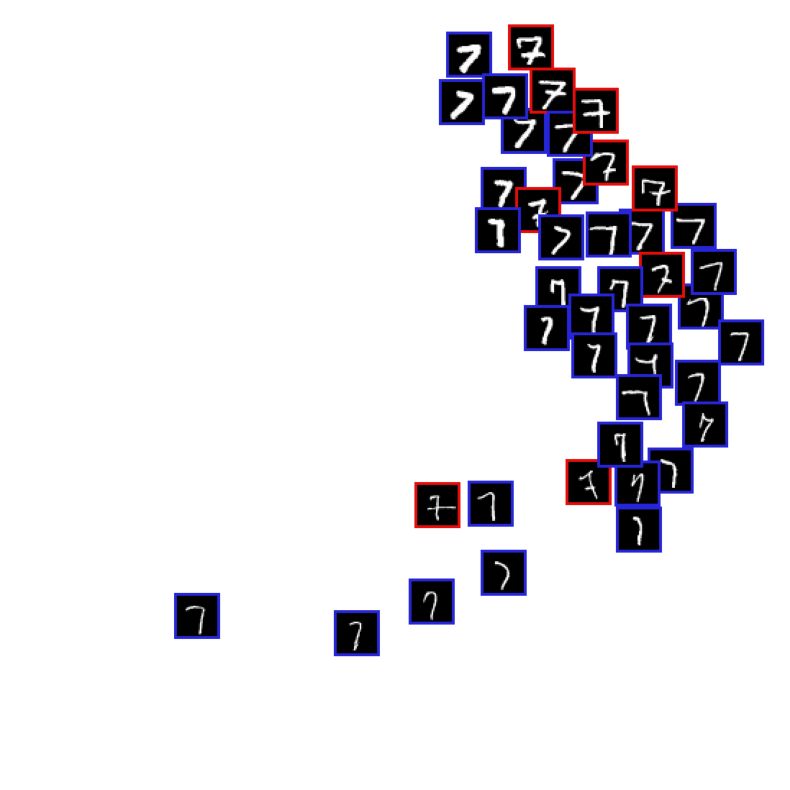

KM balanced accuracy score with hand-crafted labels :  0.510942905092989
------------------------------------------------------------------
Epoch: 27 	Training Loss: 98.919924
         	Testing Loss: 78.815015


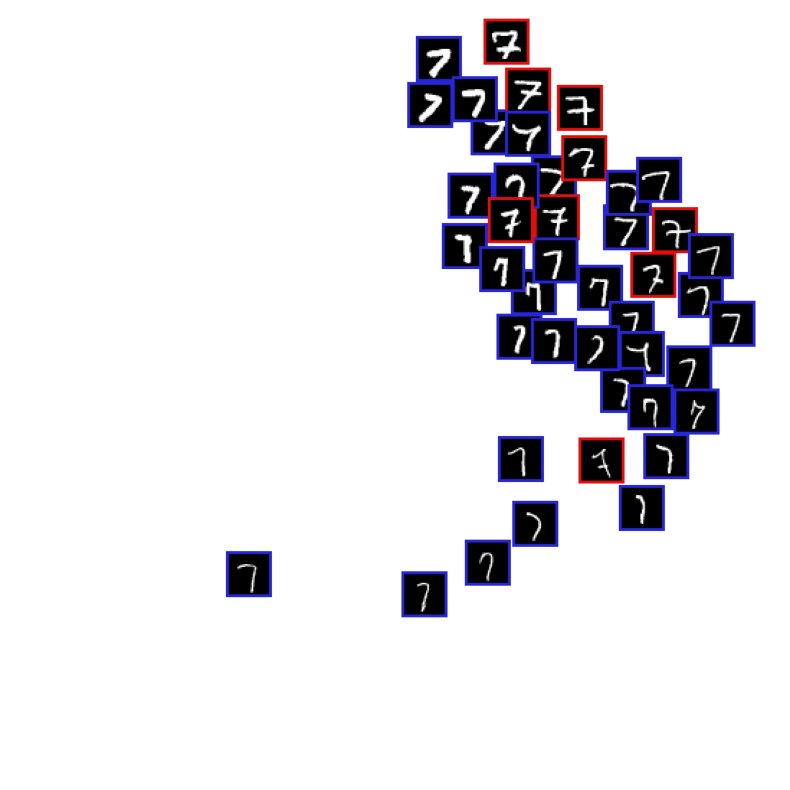

KM balanced accuracy score with hand-crafted labels :  0.5092817755248827
------------------------------------------------------------------
Epoch: 28 	Training Loss: 107.904634
         	Testing Loss: 84.336810


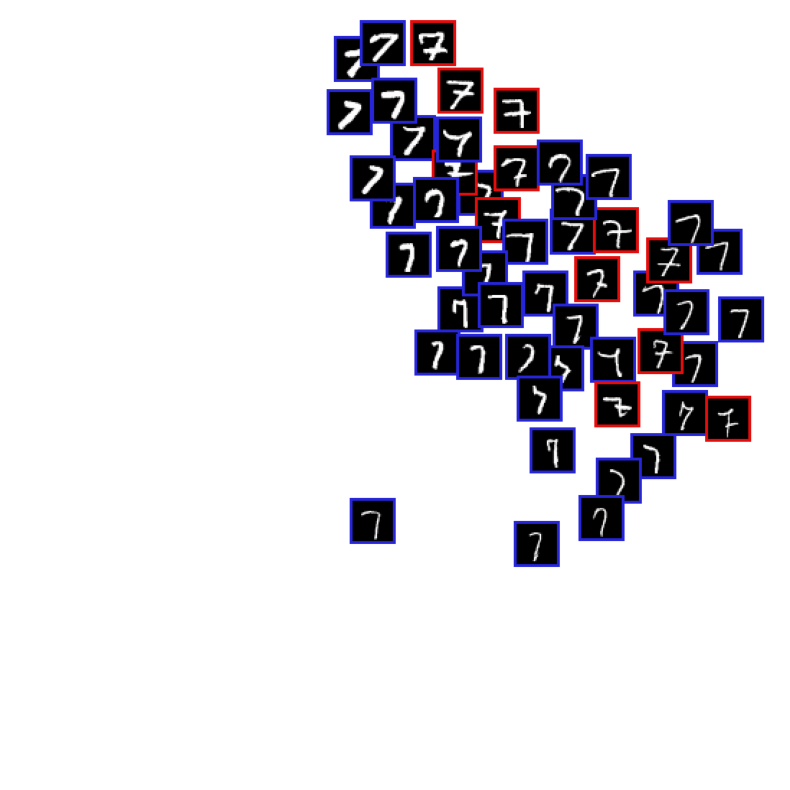

KM balanced accuracy score with hand-crafted labels :  0.5092817755248827
------------------------------------------------------------------
Epoch: 29 	Training Loss: 123.544355
         	Testing Loss: 96.720949


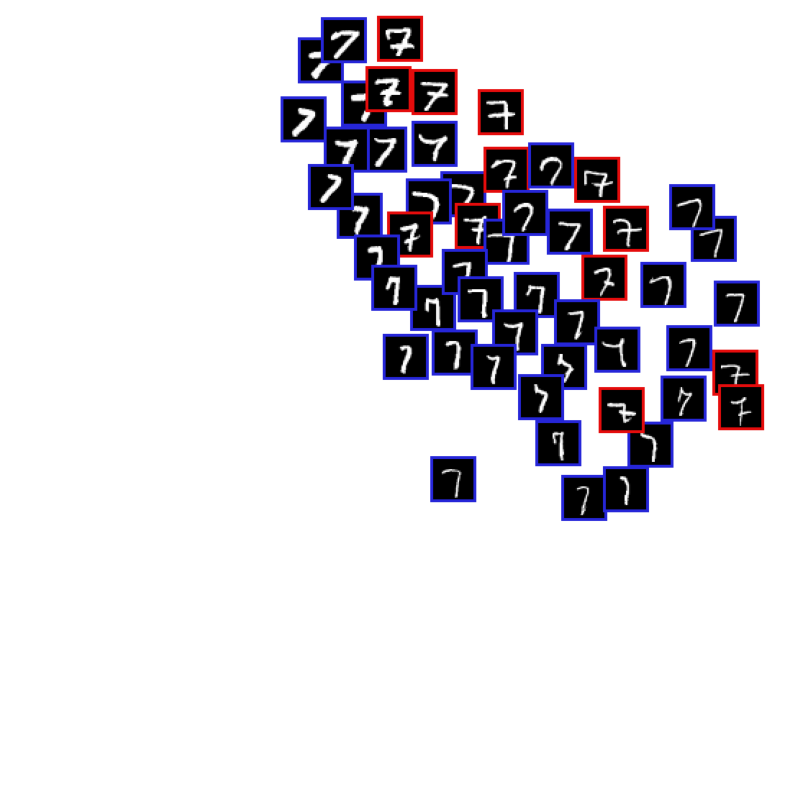

KM balanced accuracy score with hand-crafted labels :  0.5026372572524574
------------------------------------------------------------------
Epoch: 30 	Training Loss: 124.726944
         	Testing Loss: 98.425239


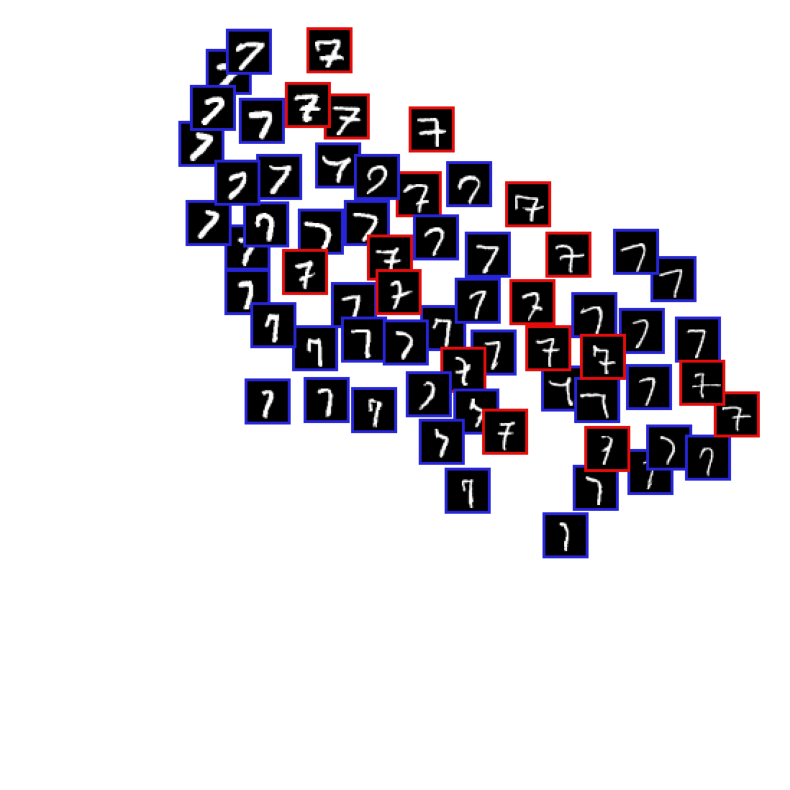

KM balanced accuracy score with hand-crafted labels :  0.5026372572524574
------------------------------------------------------------------
Epoch: 31 	Training Loss: 132.970606
         	Testing Loss: 104.401920


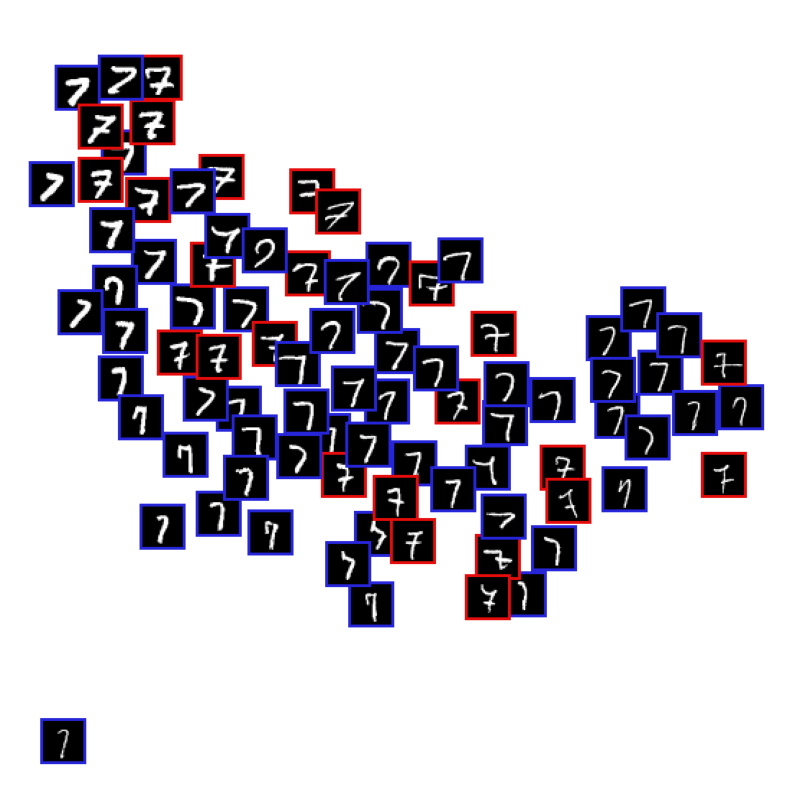

KM balanced accuracy score with hand-crafted labels :  0.5526081446723978
------------------------------------------------------------------
Epoch: 32 	Training Loss: 170.386232
         	Testing Loss: 138.360614


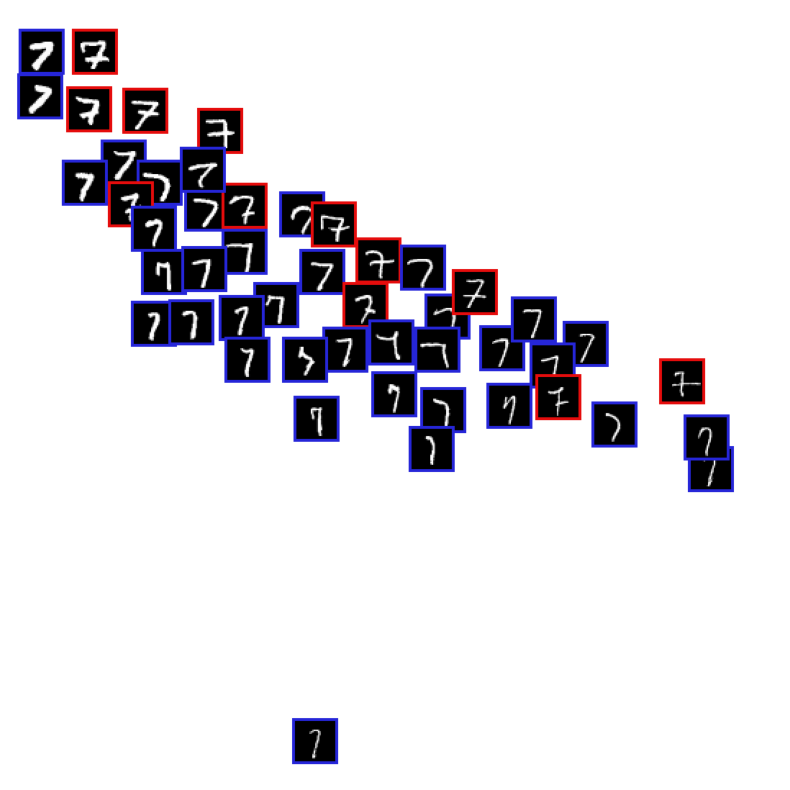

KM balanced accuracy score with hand-crafted labels :  0.5696818166249957
------------------------------------------------------------------
Epoch: 33 	Training Loss: 161.235784
         	Testing Loss: 127.291556


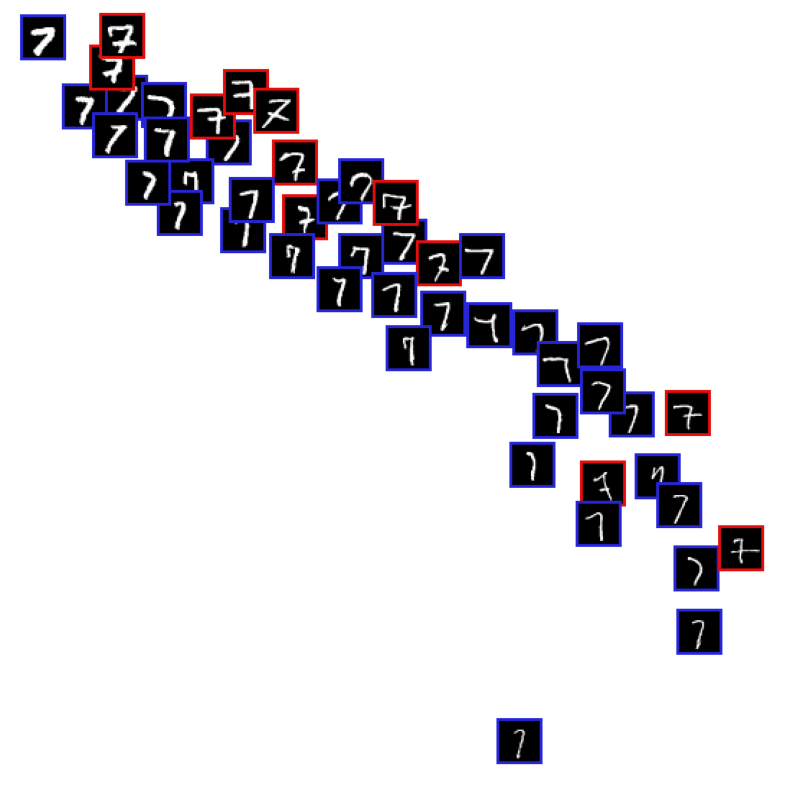

KM balanced accuracy score with hand-crafted labels :  0.5719080727472001
------------------------------------------------------------------
Epoch: 34 	Training Loss: 124.820066
         	Testing Loss: 89.511566


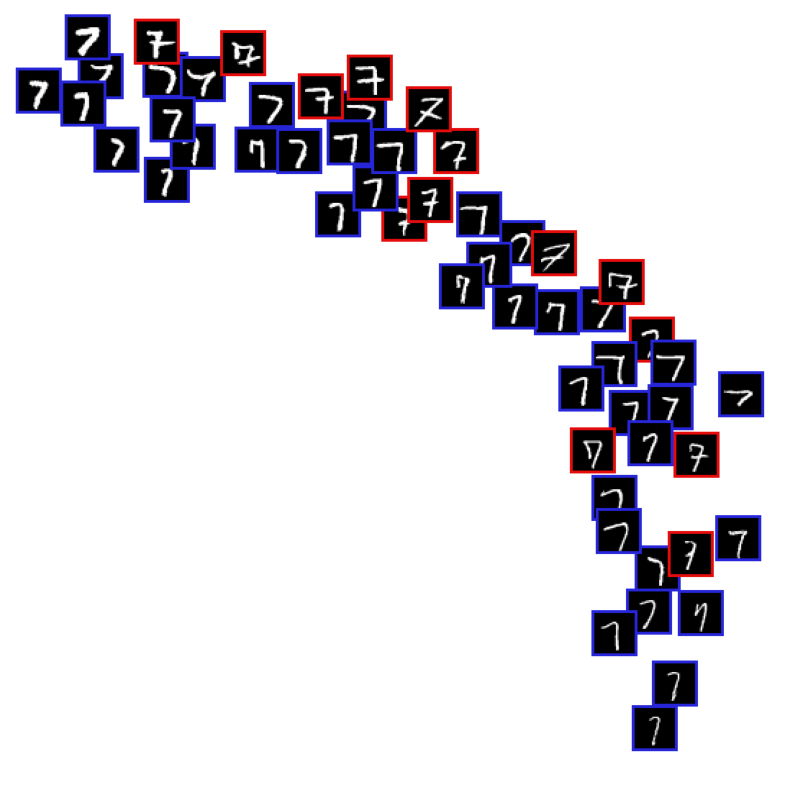

KM balanced accuracy score with hand-crafted labels :  0.5642874267904237
------------------------------------------------------------------
Epoch: 35 	Training Loss: 99.836330
         	Testing Loss: 76.291618


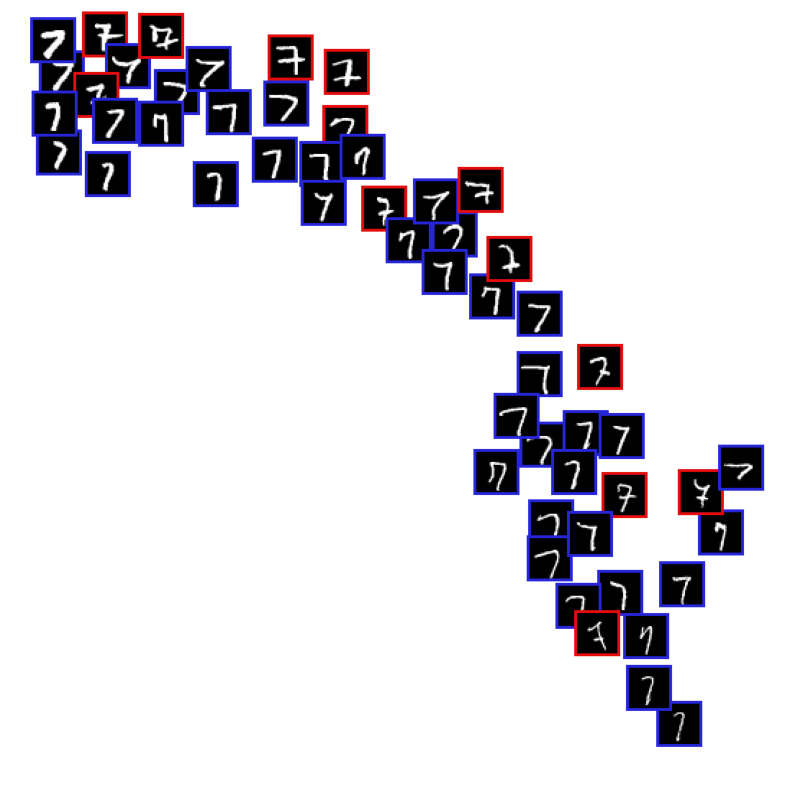

KM balanced accuracy score with hand-crafted labels :  0.5594752885570435
------------------------------------------------------------------
Epoch: 36 	Training Loss: 94.535274
         	Testing Loss: 75.590960


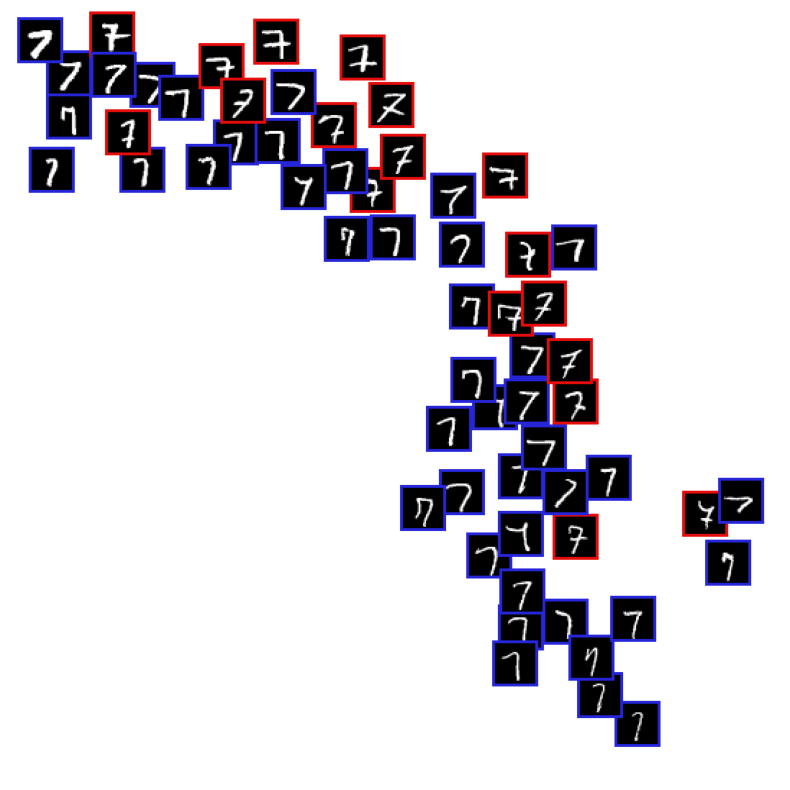

KM balanced accuracy score with hand-crafted labels :  0.557985409459876
------------------------------------------------------------------
Epoch: 37 	Training Loss: 92.959352
         	Testing Loss: 76.628394


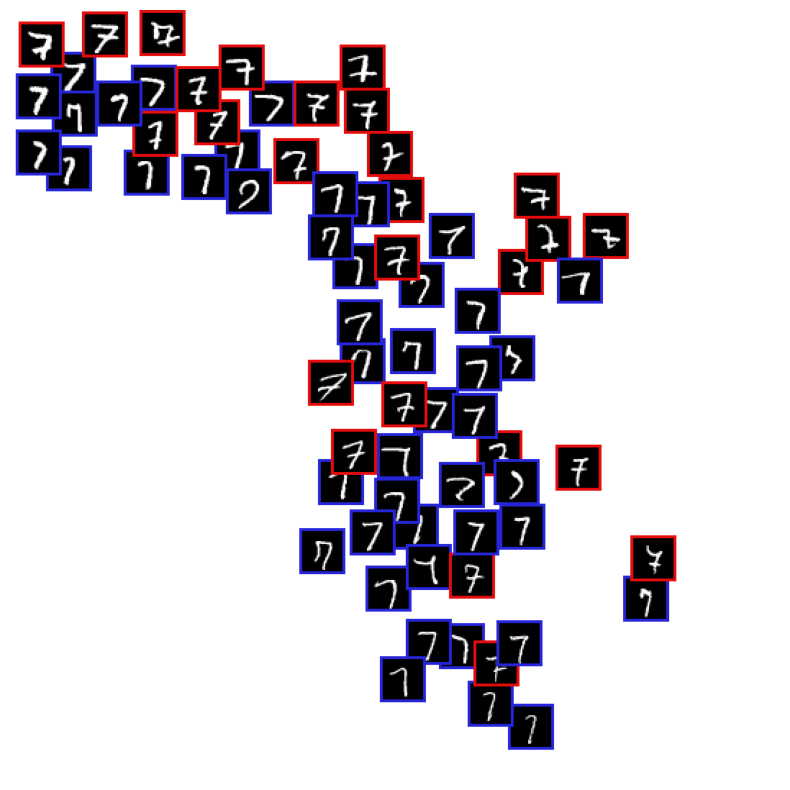

KM balanced accuracy score with hand-crafted labels :  0.5543206493817858
------------------------------------------------------------------
Epoch: 38 	Training Loss: 92.528050
         	Testing Loss: 77.381128


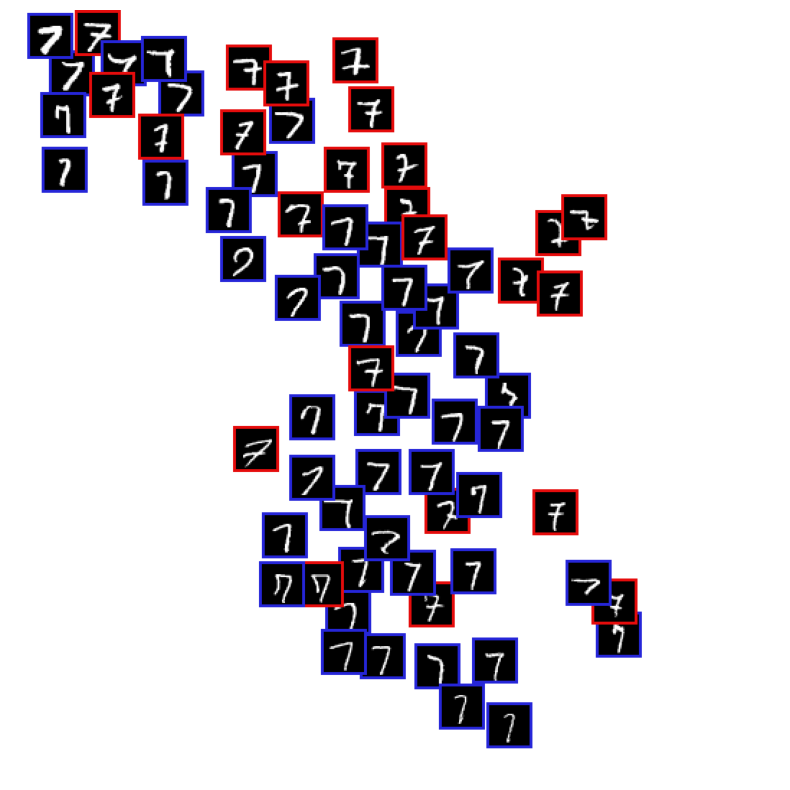

KM balanced accuracy score with hand-crafted labels :  0.5469911292256053
------------------------------------------------------------------
Epoch: 39 	Training Loss: 92.988191
         	Testing Loss: 78.505808


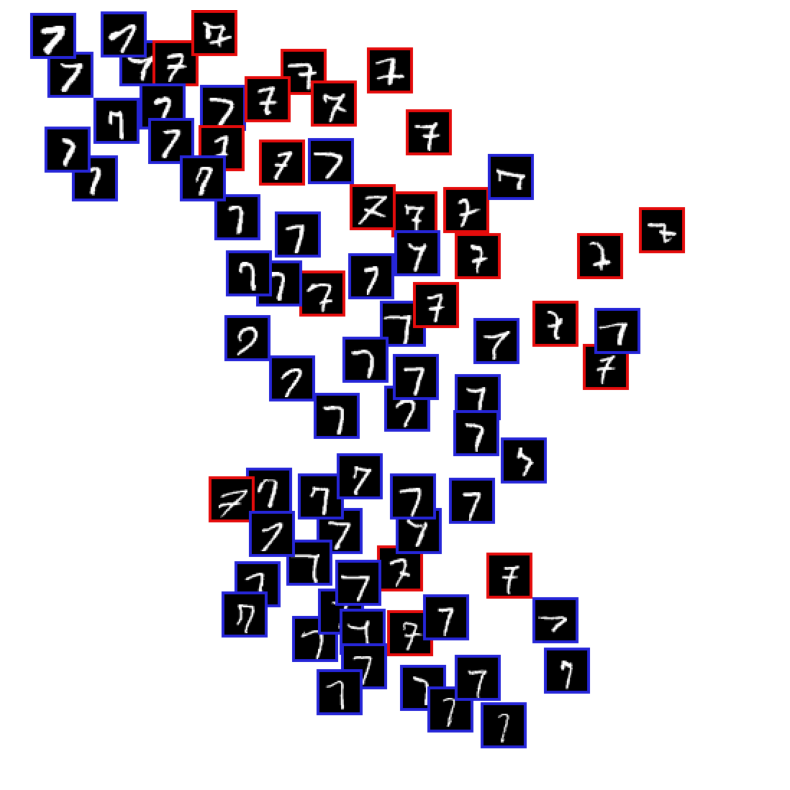

KM balanced accuracy score with hand-crafted labels :  0.5497996369490016
------------------------------------------------------------------
Epoch: 40 	Training Loss: 93.328166
         	Testing Loss: 79.419704


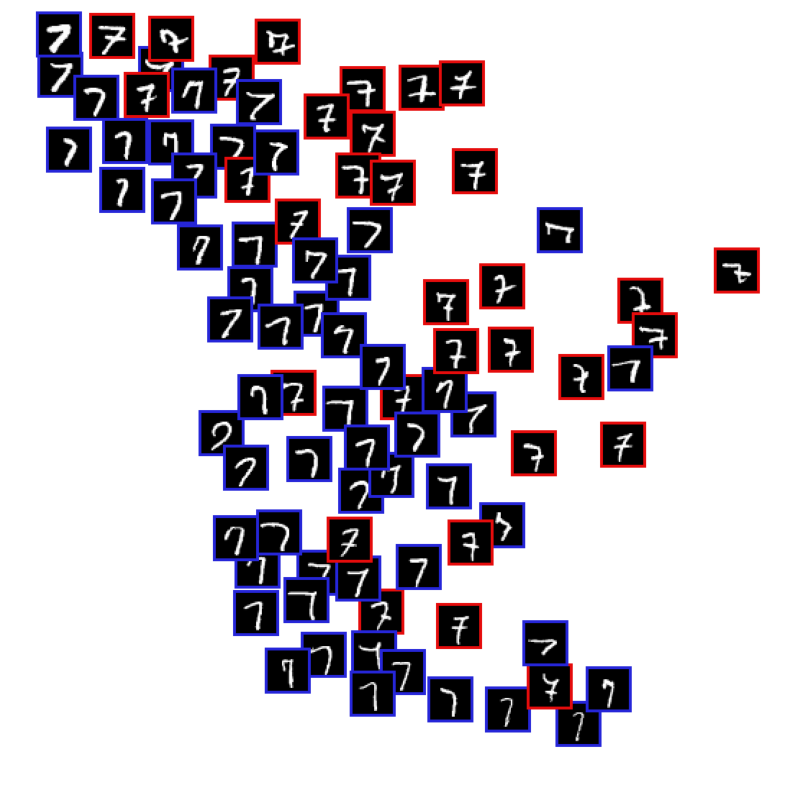

KM balanced accuracy score with hand-crafted labels :  0.5557591533376717
------------------------------------------------------------------
Epoch: 41 	Training Loss: 92.447061
         	Testing Loss: 77.270645


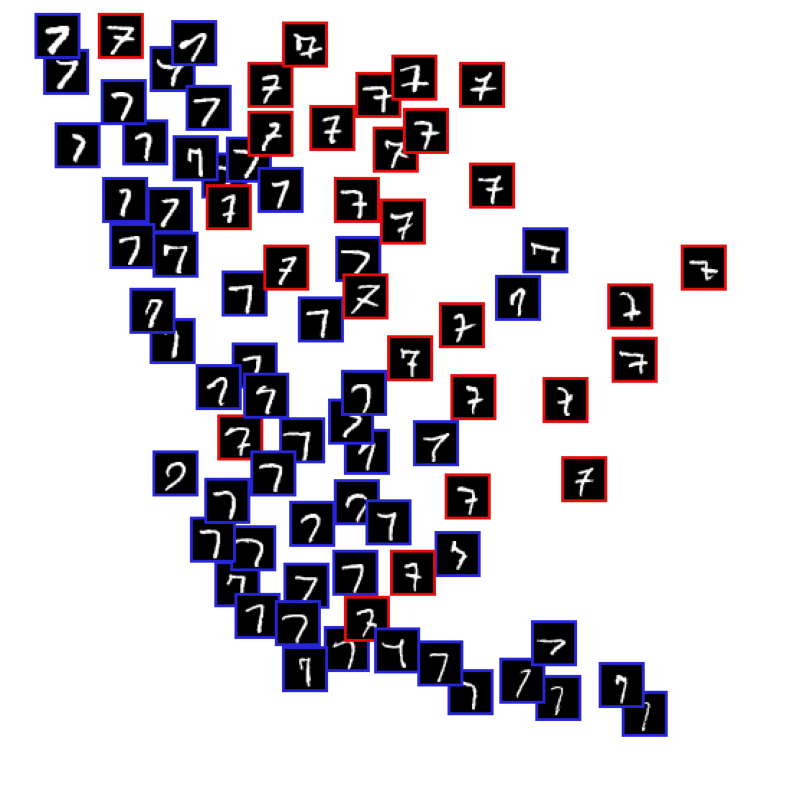

KM balanced accuracy score with hand-crafted labels :  0.5604000411001131
------------------------------------------------------------------
Epoch: 42 	Training Loss: 91.978681
         	Testing Loss: 77.113065


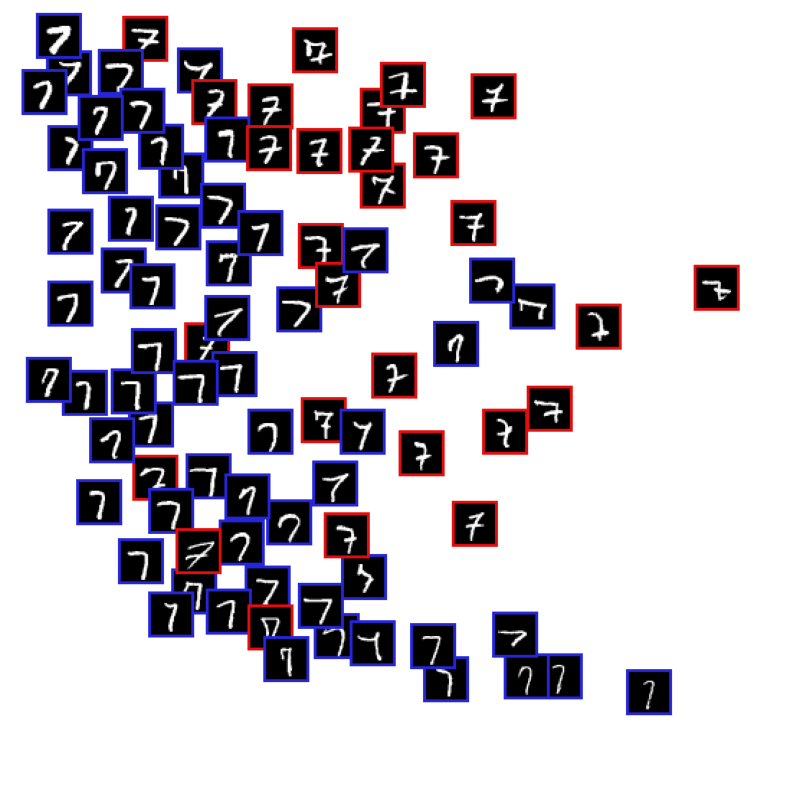

KM balanced accuracy score with hand-crafted labels :  0.5549029009829777
------------------------------------------------------------------
Epoch: 43 	Training Loss: 92.821735
         	Testing Loss: 74.354222


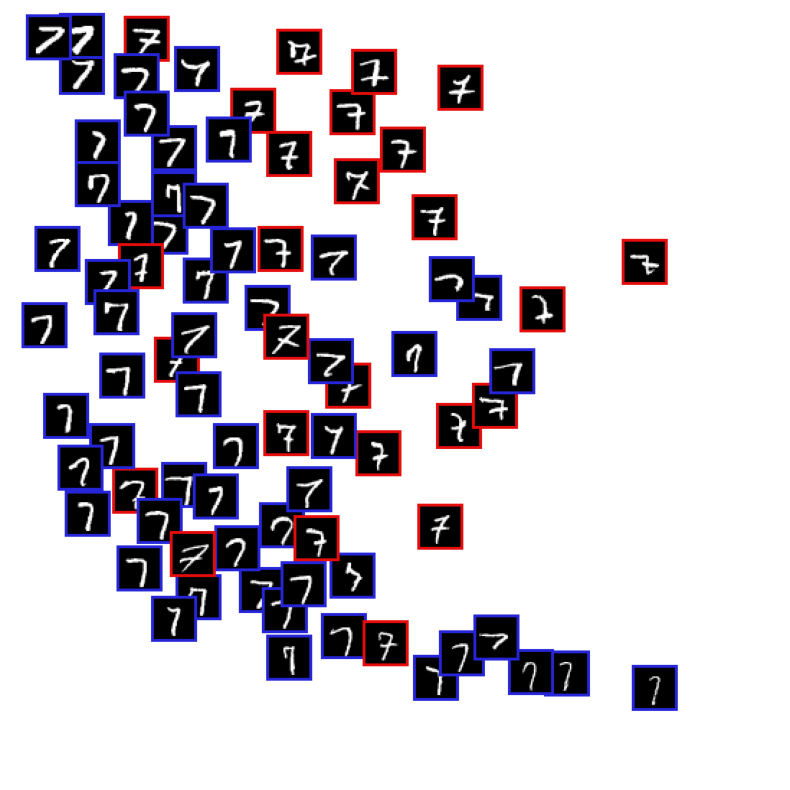

KM balanced accuracy score with hand-crafted labels :  0.5600575401582354
------------------------------------------------------------------
Epoch: 44 	Training Loss: 92.948225
         	Testing Loss: 72.374814


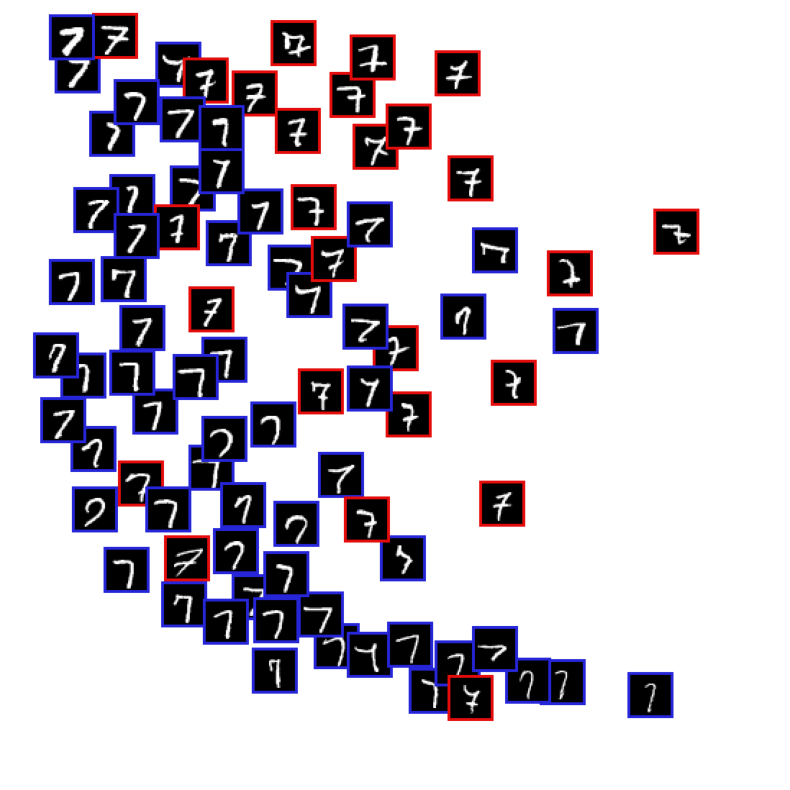

KM balanced accuracy score with hand-crafted labels :  0.5637223002363256
------------------------------------------------------------------
Epoch: 45 	Training Loss: 93.275566
         	Testing Loss: 72.091335


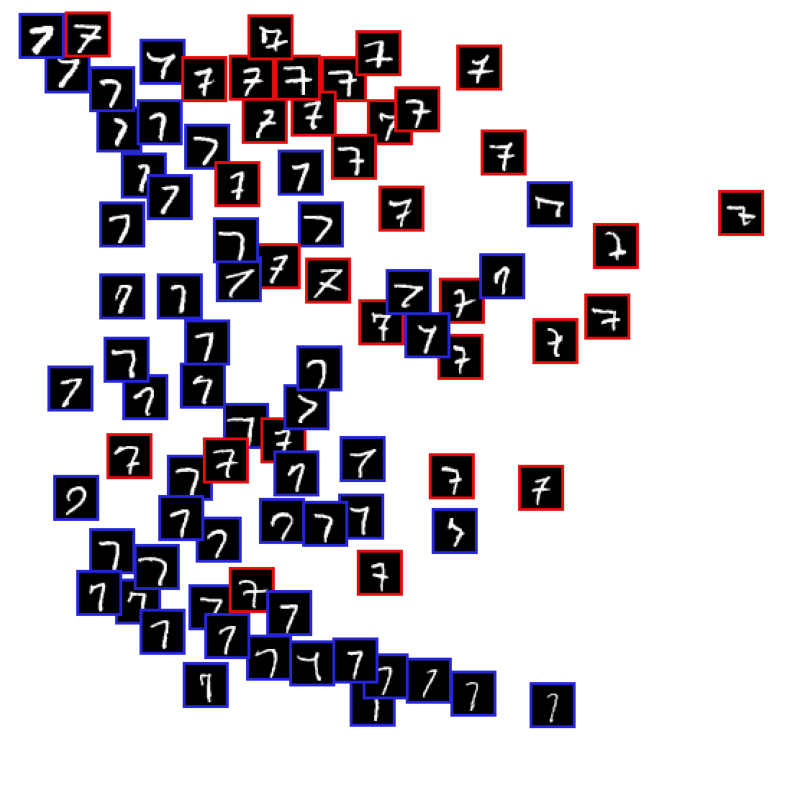

KM balanced accuracy score with hand-crafted labels :  0.5557591533376717
------------------------------------------------------------------
Epoch: 46 	Training Loss: 93.501324
         	Testing Loss: 72.307624


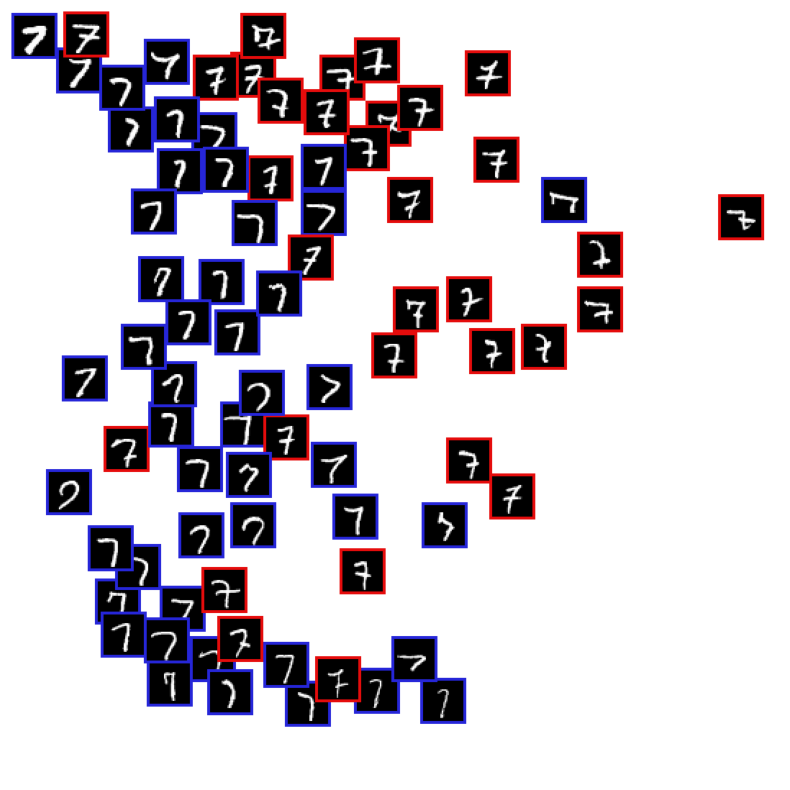

KM balanced accuracy score with hand-crafted labels :  0.5540980237695654
------------------------------------------------------------------
Epoch: 47 	Training Loss: 91.996775
         	Testing Loss: 72.128826


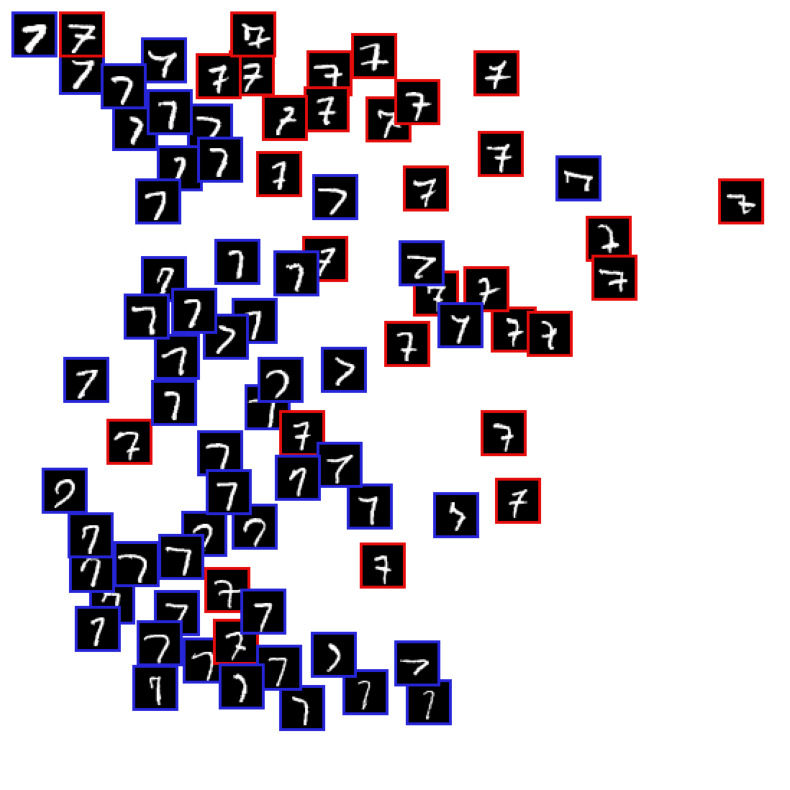

KM balanced accuracy score with hand-crafted labels :  0.5610850429838682
------------------------------------------------------------------
Epoch: 48 	Training Loss: 92.754044
         	Testing Loss: 72.185336


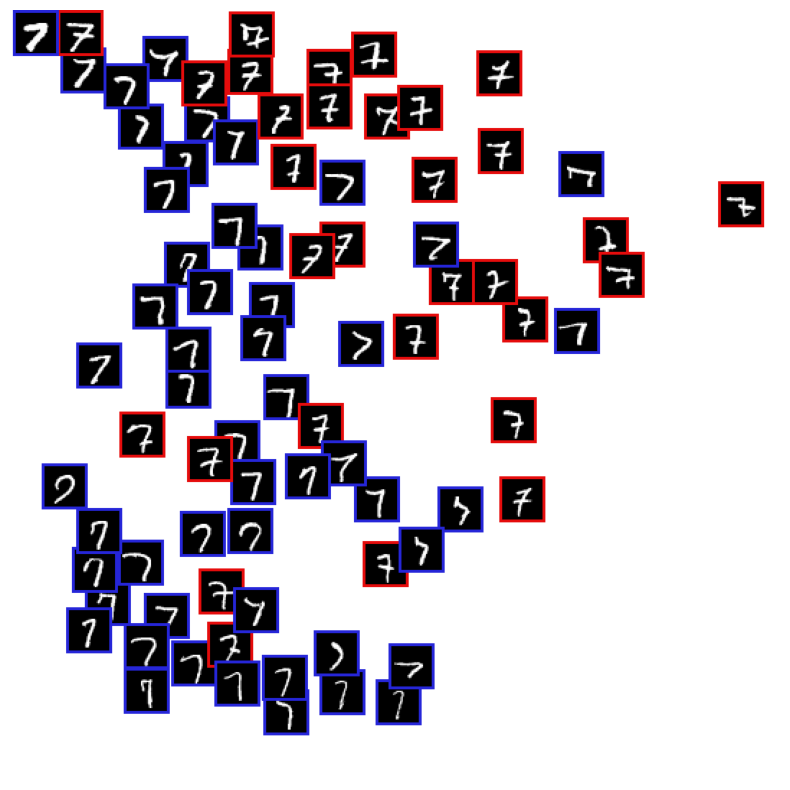

KM balanced accuracy score with hand-crafted labels :  0.5647498030619584
------------------------------------------------------------------
Epoch: 49 	Training Loss: 92.019979
         	Testing Loss: 71.957525


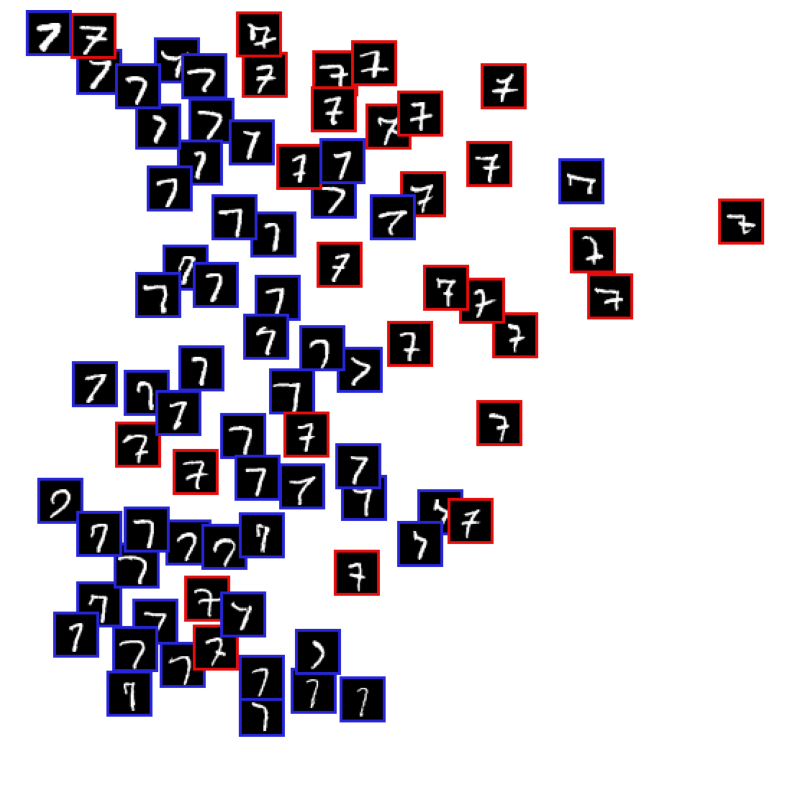

KM balanced accuracy score with hand-crafted labels :  0.5577627838476555
------------------------------------------------------------------
Epoch: 50 	Training Loss: 91.793138
         	Testing Loss: 72.873378


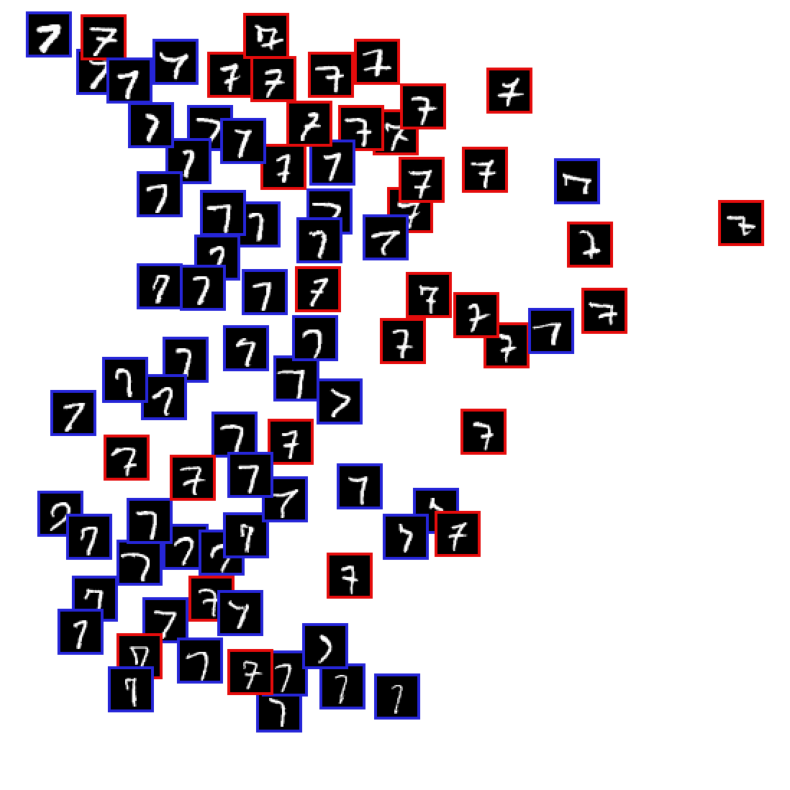

KM balanced accuracy score with hand-crafted labels :  0.5492858855361853
------------------------------------------------------------------
Epoch: 51 	Training Loss: 93.009703
         	Testing Loss: 73.686746


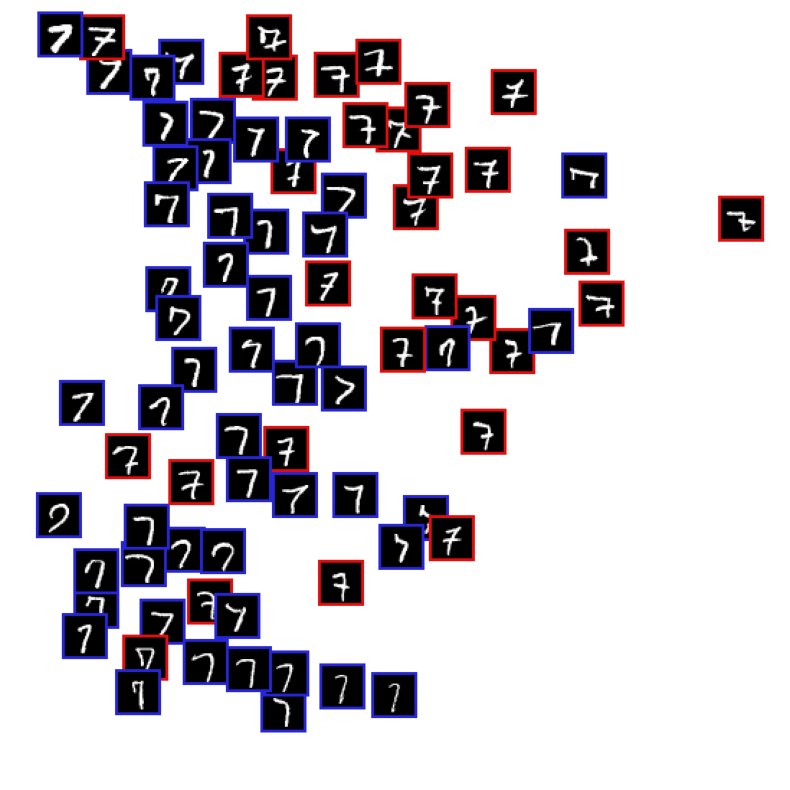

KM balanced accuracy score with hand-crafted labels :  0.5526081446723978
------------------------------------------------------------------
Epoch: 52 	Training Loss: 92.734380
         	Testing Loss: 72.696446


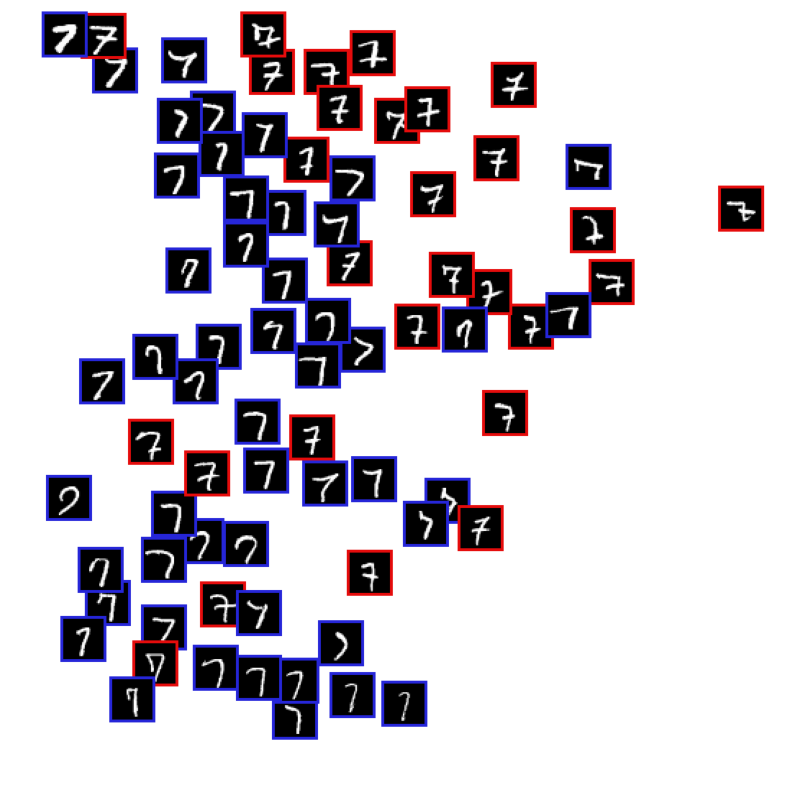

KM balanced accuracy score with hand-crafted labels :  0.5562729047504881
------------------------------------------------------------------
Epoch: 53 	Training Loss: 92.373811
         	Testing Loss: 72.634610


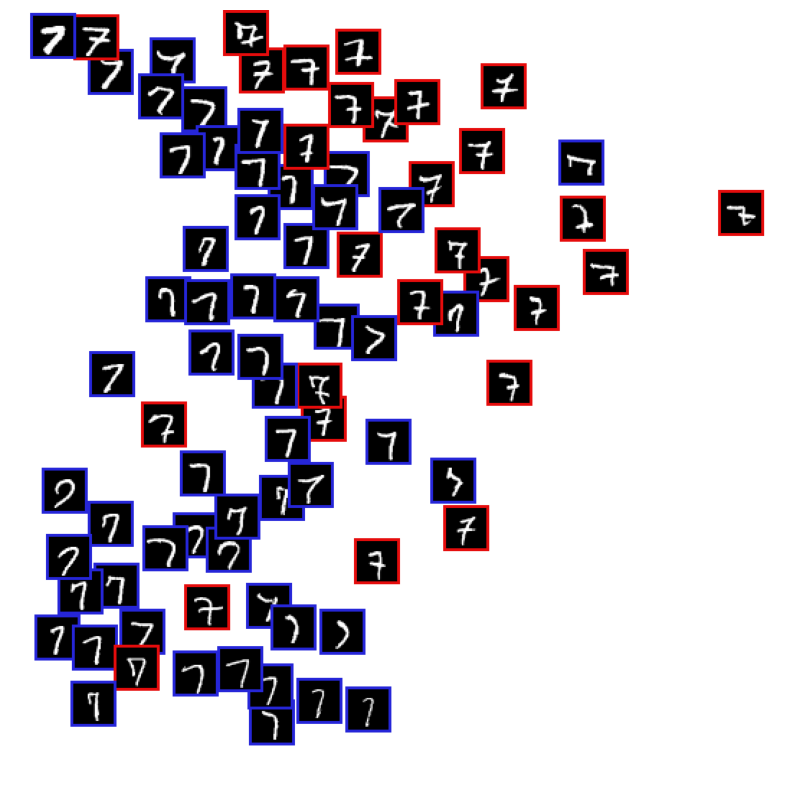

KM balanced accuracy score with hand-crafted labels :  0.5564441552214269
------------------------------------------------------------------
Epoch: 54 	Training Loss: 91.961121
         	Testing Loss: 72.014768


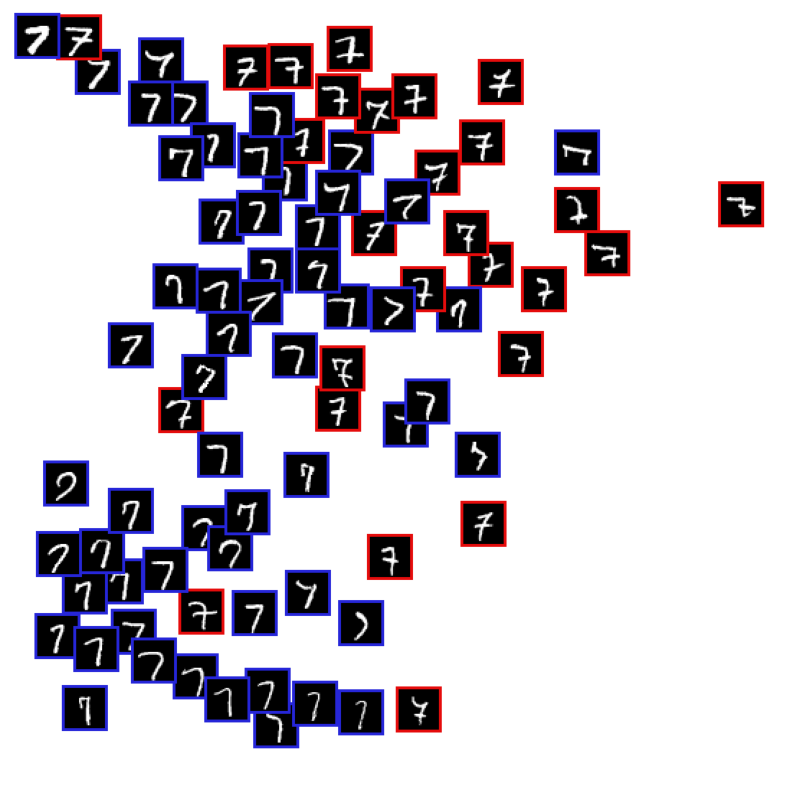

KM balanced accuracy score with hand-crafted labels :  0.5617700448676234
------------------------------------------------------------------
Epoch: 55 	Training Loss: 92.714830
         	Testing Loss: 71.170467


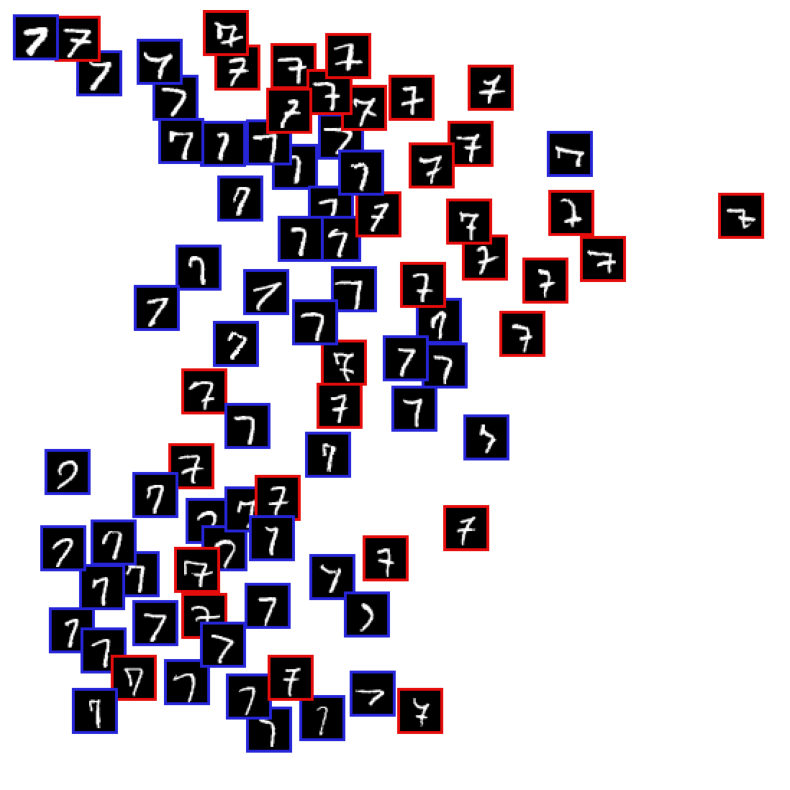

KM balanced accuracy score with hand-crafted labels :  0.5636024249066685
------------------------------------------------------------------
Epoch: 56 	Training Loss: 92.125859
         	Testing Loss: 71.143774


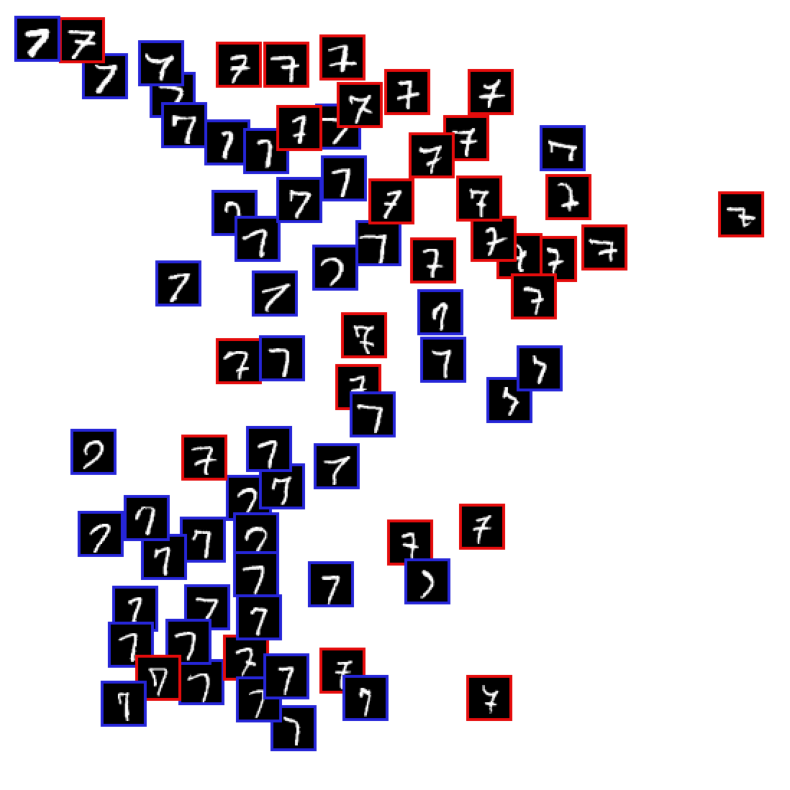

KM balanced accuracy score with hand-crafted labels :  0.5504846388327568
------------------------------------------------------------------
Epoch: 57 	Training Loss: 92.166891
         	Testing Loss: 73.823197


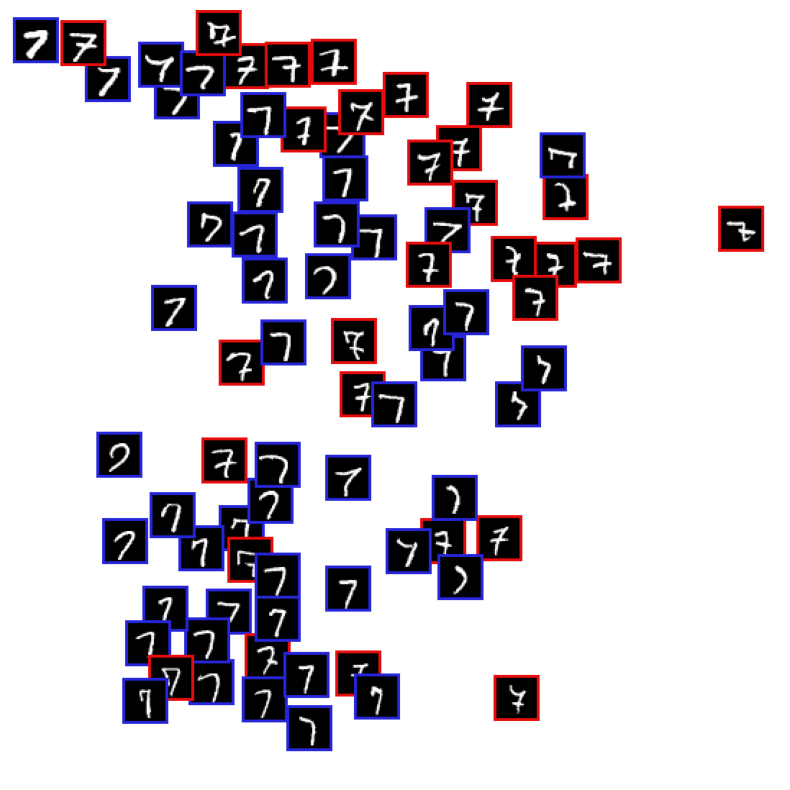

KM balanced accuracy score with hand-crafted labels :  0.5504846388327568
------------------------------------------------------------------
Epoch: 58 	Training Loss: 92.184499
         	Testing Loss: 73.158162


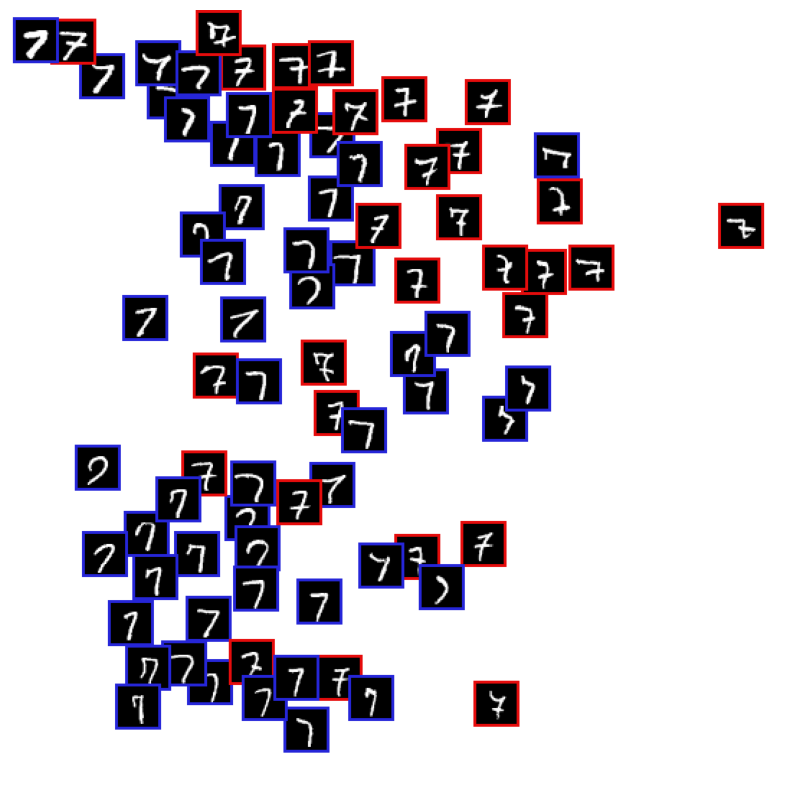

KM balanced accuracy score with hand-crafted labels :  0.5554680275370757
------------------------------------------------------------------
Epoch: 59 	Training Loss: 92.060267
         	Testing Loss: 72.333769


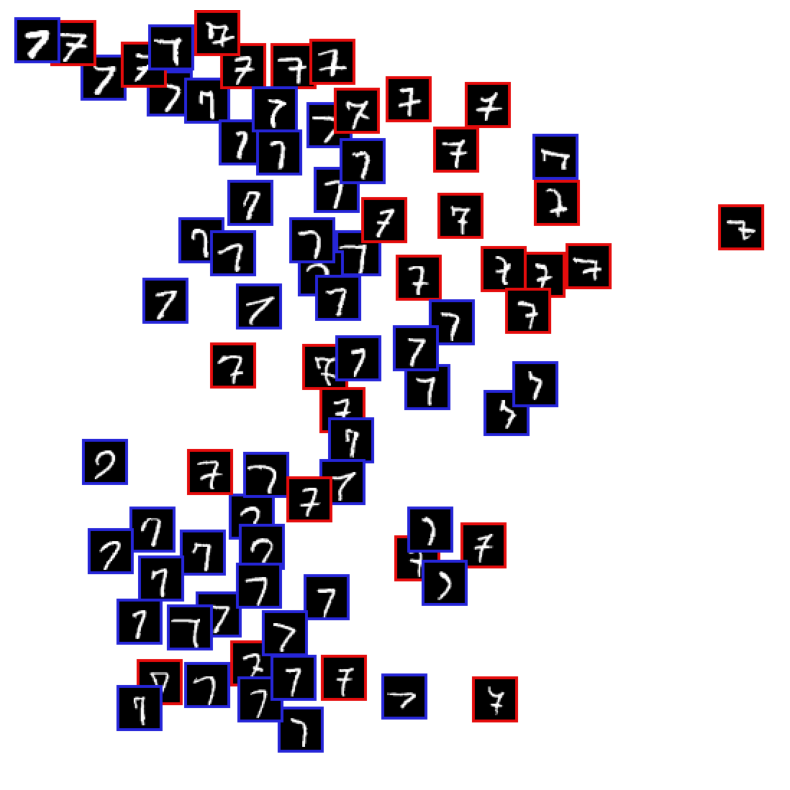

KM balanced accuracy score with hand-crafted labels :  0.552145768400863
------------------------------------------------------------------
Epoch: 60 	Training Loss: 91.642900
         	Testing Loss: 74.283970


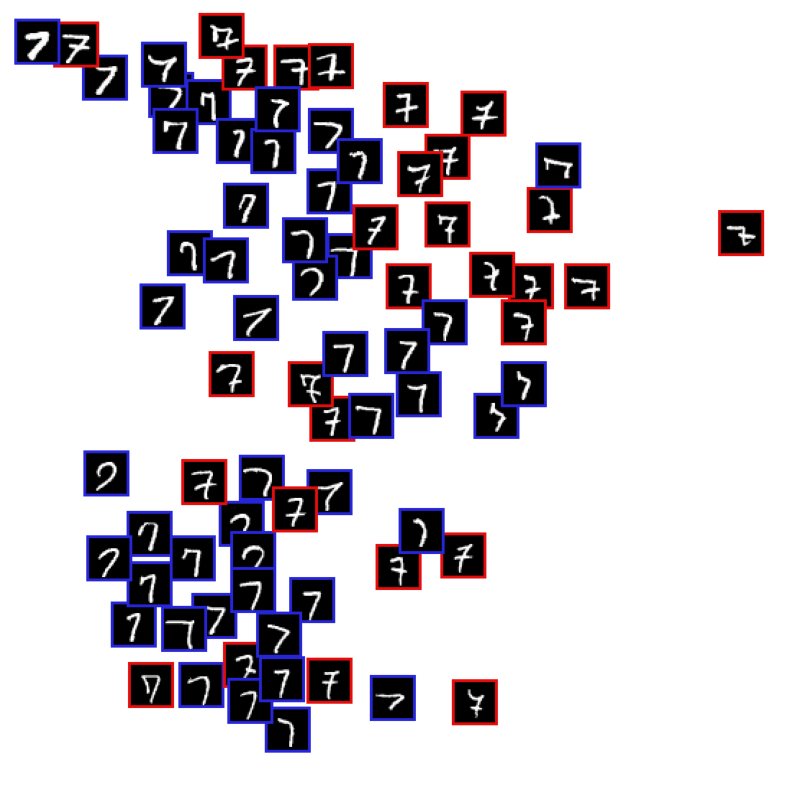

KM balanced accuracy score with hand-crafted labels :  0.5468198787546665
------------------------------------------------------------------
Epoch: 61 	Training Loss: 92.316650
         	Testing Loss: 74.680886


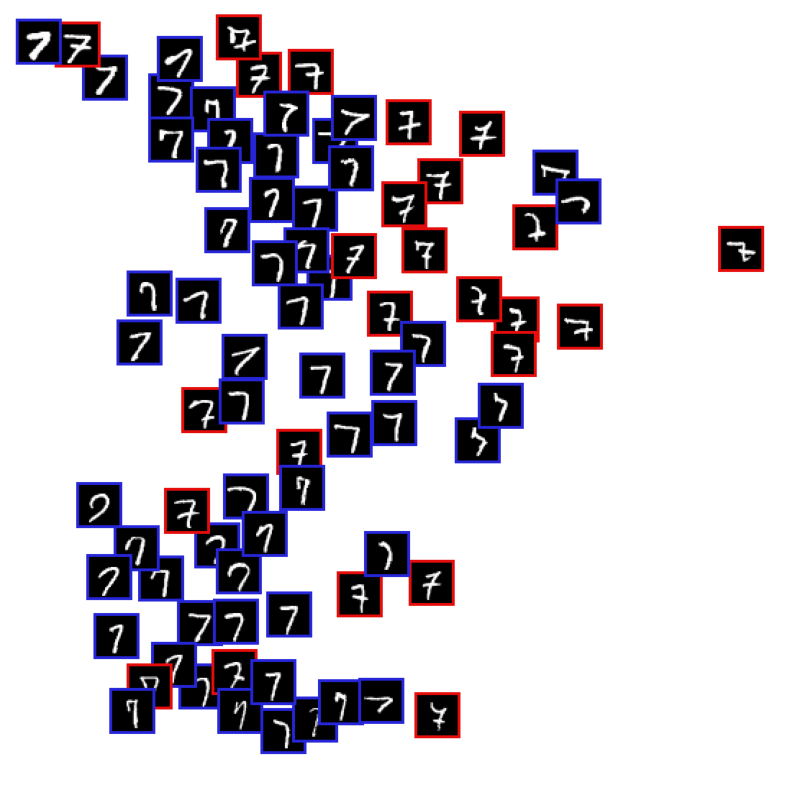

KM balanced accuracy score with hand-crafted labels :  0.5446449977737439
------------------------------------------------------------------
Epoch: 62 	Training Loss: 91.253438
         	Testing Loss: 75.220140


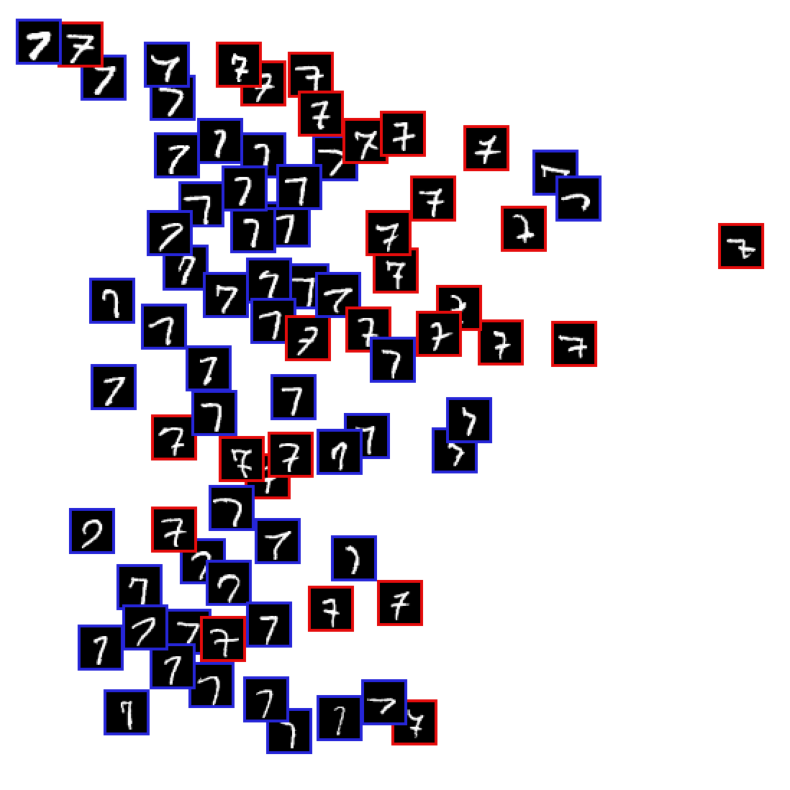

KM balanced accuracy score with hand-crafted labels :  0.5496283864780629
------------------------------------------------------------------
Epoch: 63 	Training Loss: 91.391093
         	Testing Loss: 72.464657


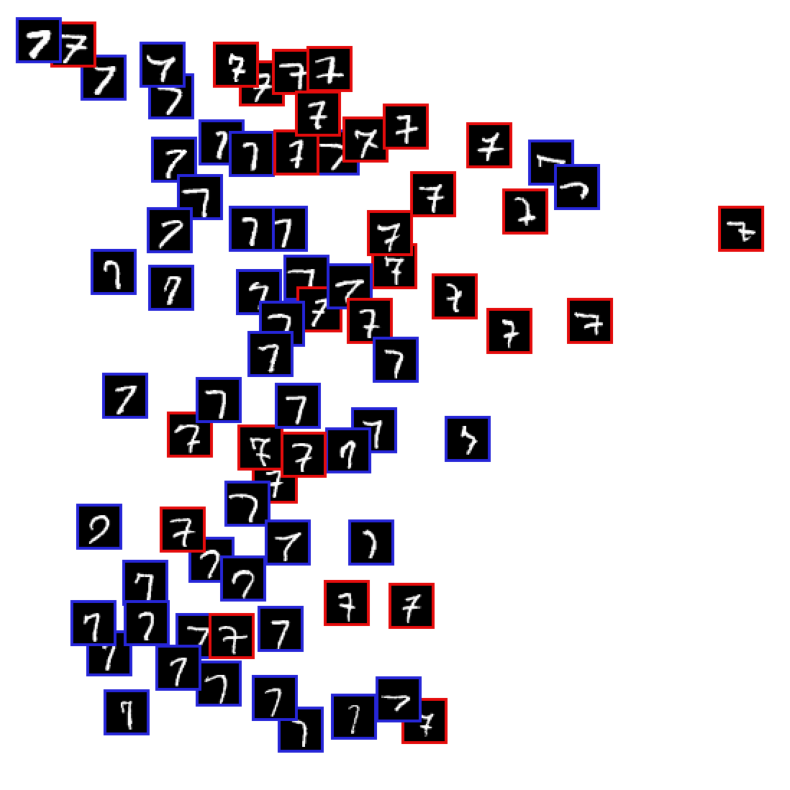

KM balanced accuracy score with hand-crafted labels :  0.5496283864780629
------------------------------------------------------------------
Epoch: 64 	Training Loss: 91.882728
         	Testing Loss: 73.069735


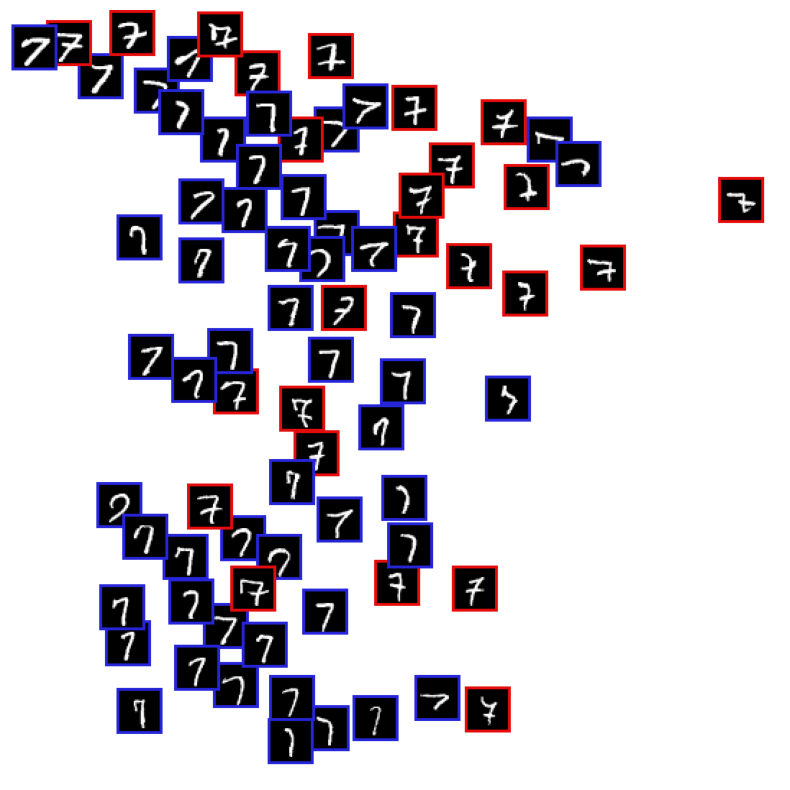

KM balanced accuracy score with hand-crafted labels :  0.5519745179299242
------------------------------------------------------------------
Epoch: 65 	Training Loss: 91.808125
         	Testing Loss: 72.564914


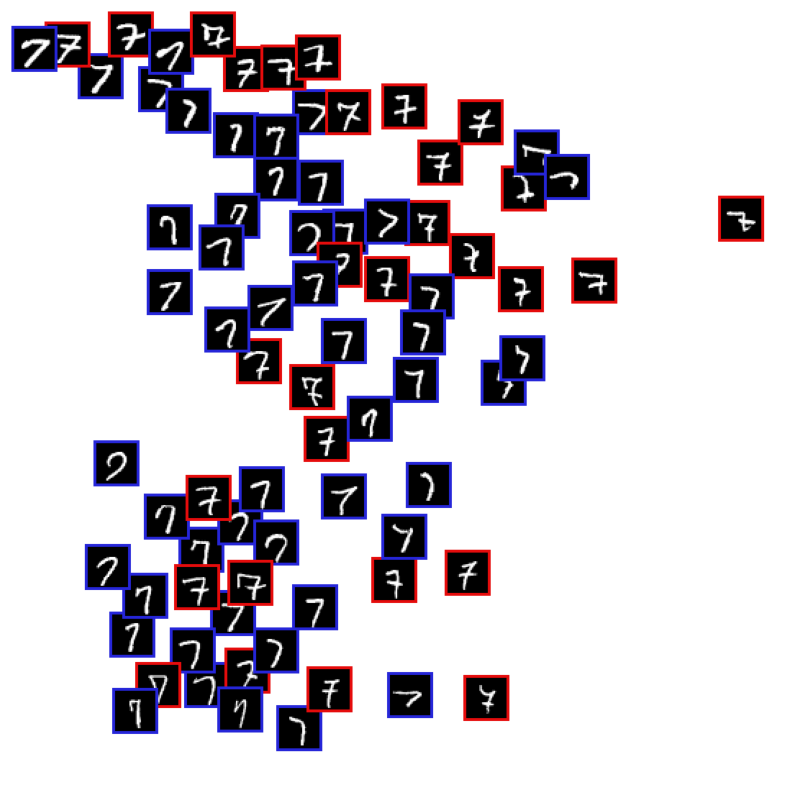

KM balanced accuracy score with hand-crafted labels :  0.5436688700893928
------------------------------------------------------------------
Epoch: 66 	Training Loss: 92.003523
         	Testing Loss: 71.101438


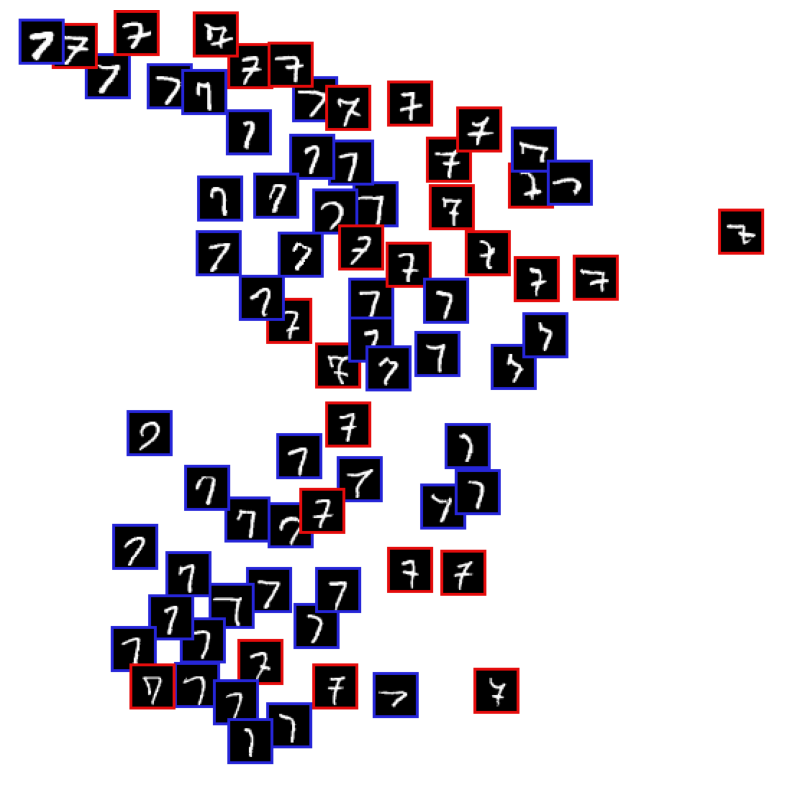

KM balanced accuracy score with hand-crafted labels :  0.5455012501284379
------------------------------------------------------------------
Epoch: 67 	Training Loss: 92.234555
         	Testing Loss: 75.359922


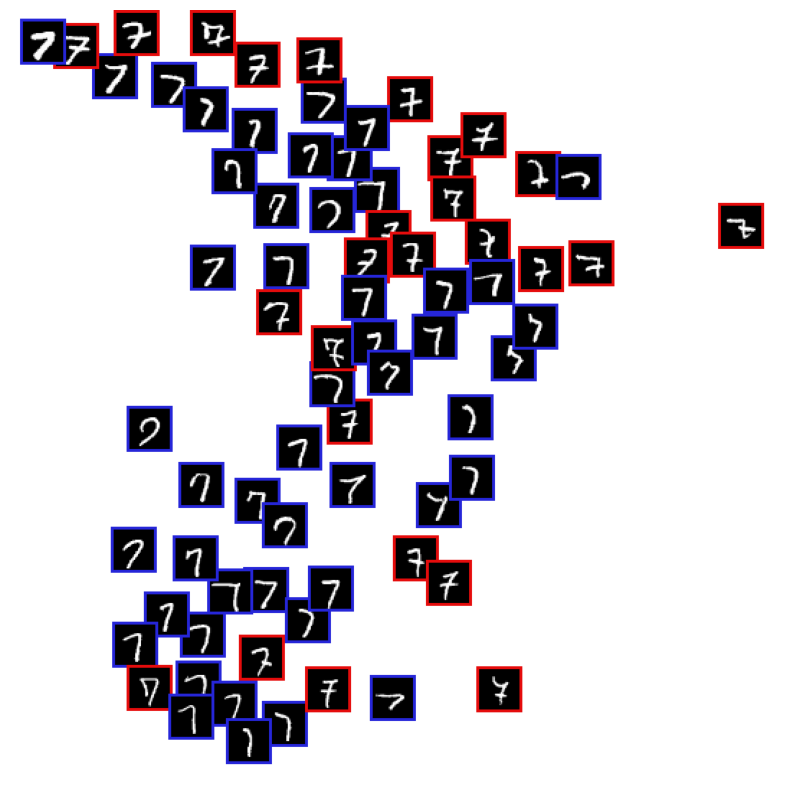

KM balanced accuracy score with hand-crafted labels :  0.5455012501284379
------------------------------------------------------------------
Epoch: 68 	Training Loss: 91.697951
         	Testing Loss: 73.264758


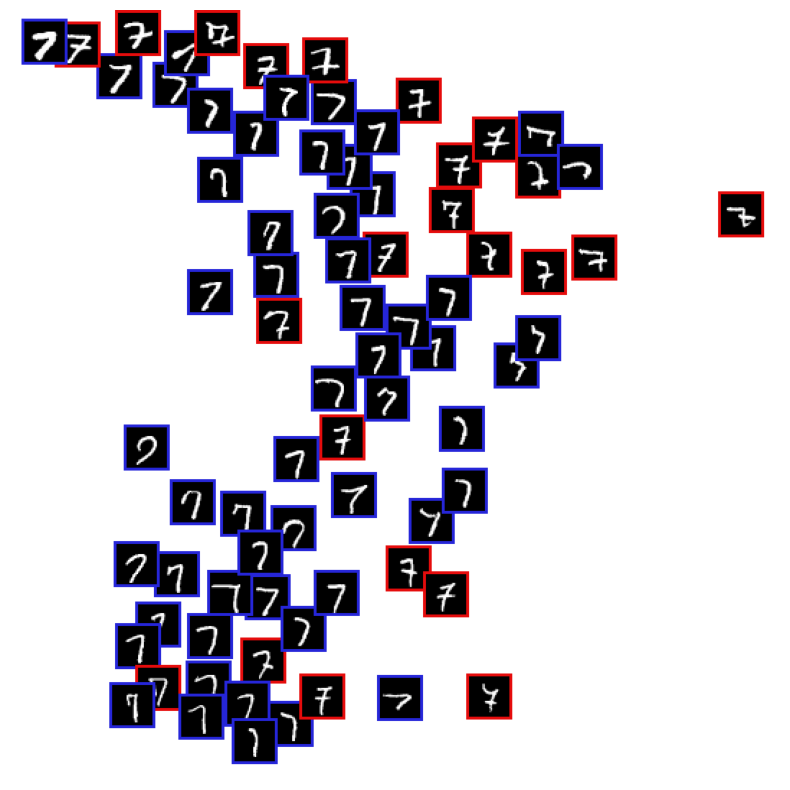

KM balanced accuracy score with hand-crafted labels :  0.5436688700893928
------------------------------------------------------------------
Epoch: 69 	Training Loss: 91.553332
         	Testing Loss: 72.078712


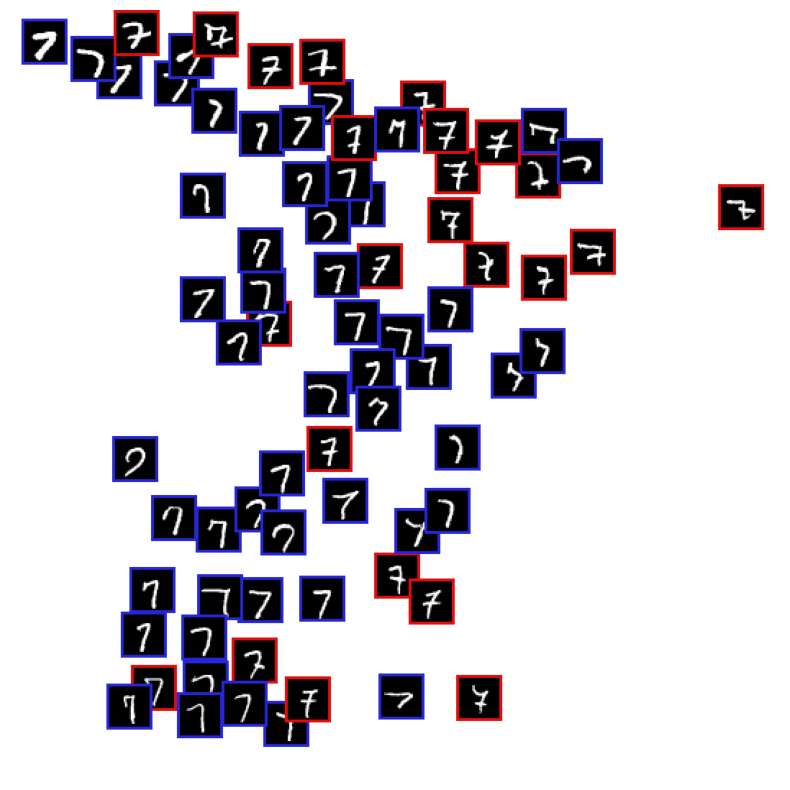

KM balanced accuracy score with hand-crafted labels :  0.5453299996574991
------------------------------------------------------------------
Epoch: 70 	Training Loss: 92.302201
         	Testing Loss: 74.231344


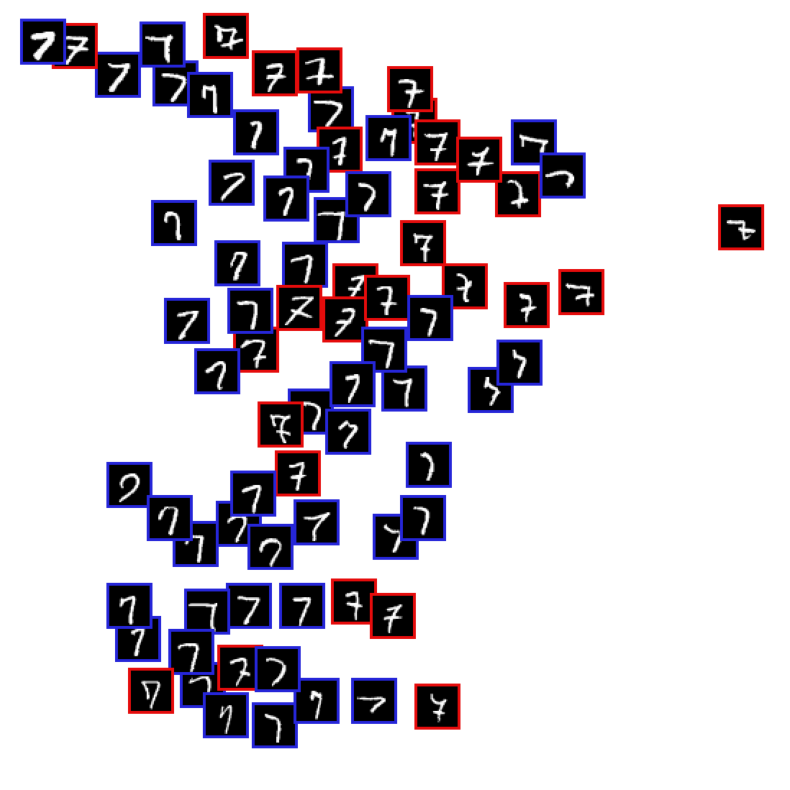

KM balanced accuracy score with hand-crafted labels :  0.5263725725245745
------------------------------------------------------------------
Epoch: 71 	Training Loss: 91.832948
         	Testing Loss: 74.084956


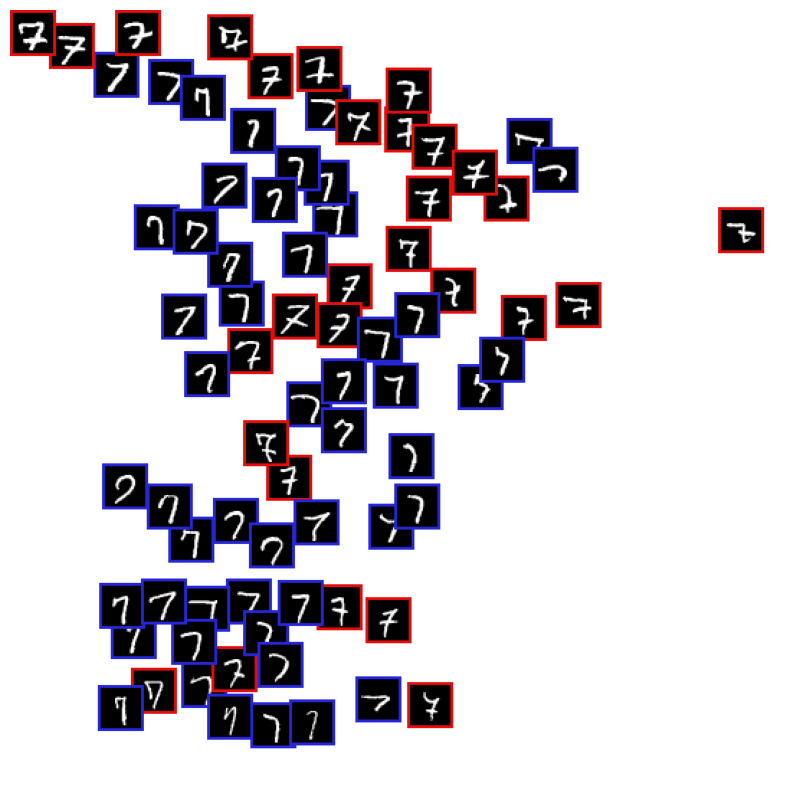

KM balanced accuracy score with hand-crafted labels :  0.5247114429564681
------------------------------------------------------------------
Epoch: 72 	Training Loss: 91.103114
         	Testing Loss: 73.851084


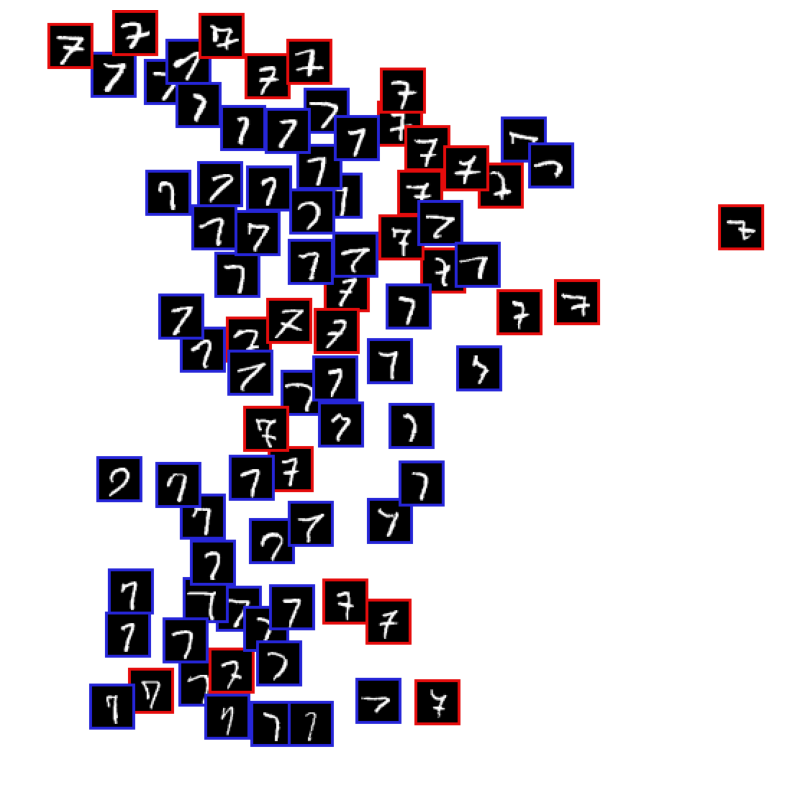

KM balanced accuracy score with hand-crafted labels :  0.5315272116998322
------------------------------------------------------------------
Epoch: 73 	Training Loss: 92.066231
         	Testing Loss: 73.283958


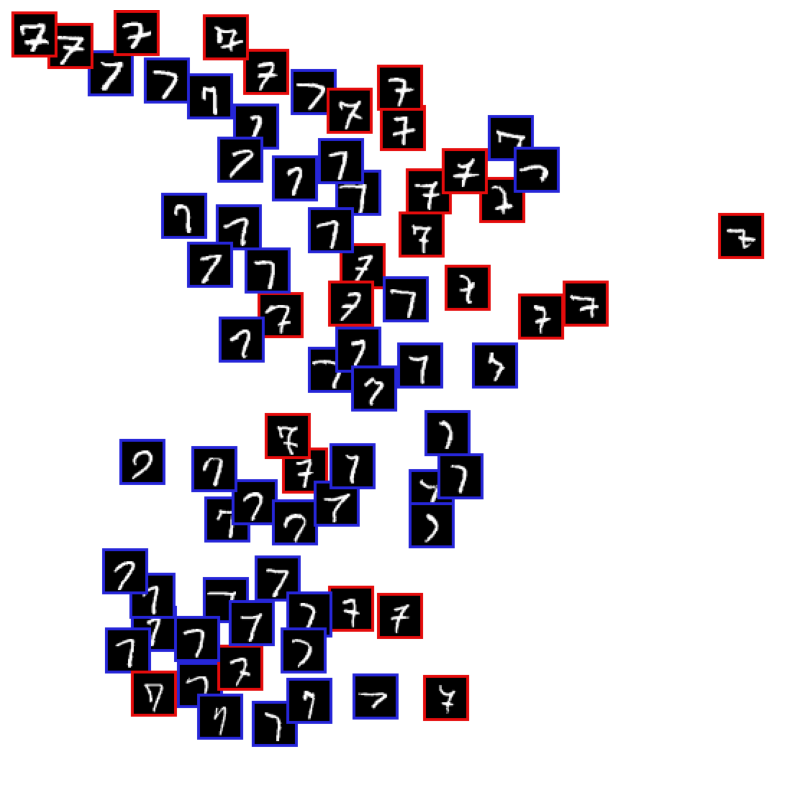

KM balanced accuracy score with hand-crafted labels :  0.5180669246840429
------------------------------------------------------------------
Epoch: 74 	Training Loss: 91.096436
         	Testing Loss: 72.314414


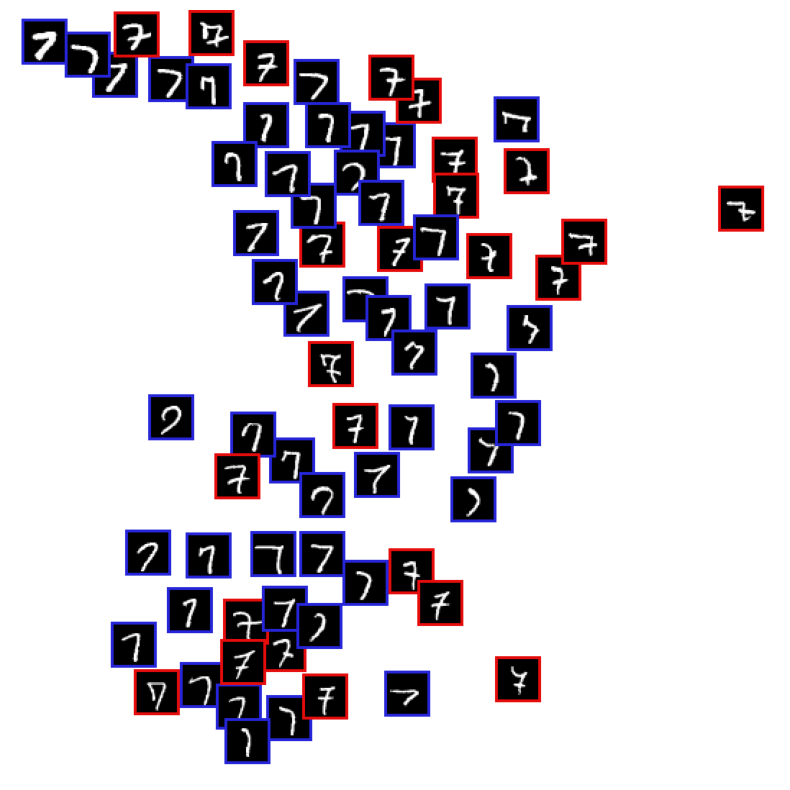

KM balanced accuracy score with hand-crafted labels :  0.5388567318560126
------------------------------------------------------------------
Epoch: 75 	Training Loss: 92.072927
         	Testing Loss: 71.137060


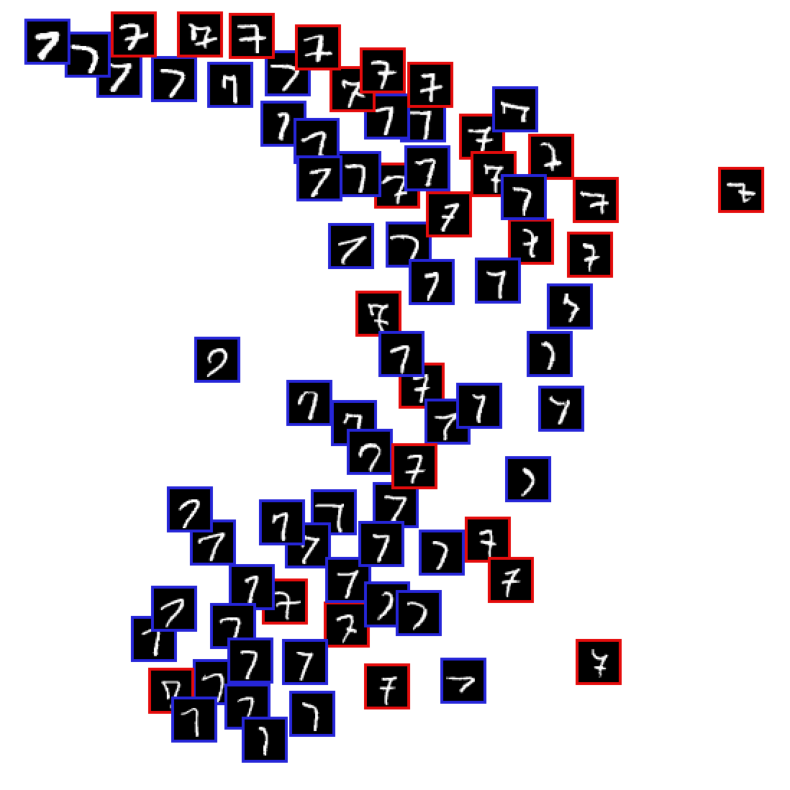

KM balanced accuracy score with hand-crafted labels :  0.5390279823269514
------------------------------------------------------------------
---------------------------
---------------------------
---------------------------
KM balanced accuracy score with hand-crafted labels :  0.56281467274035
------------------------------------------------------------------
Epoch: 0 	Training Loss: 173.592073
         	Testing Loss: 142.372513


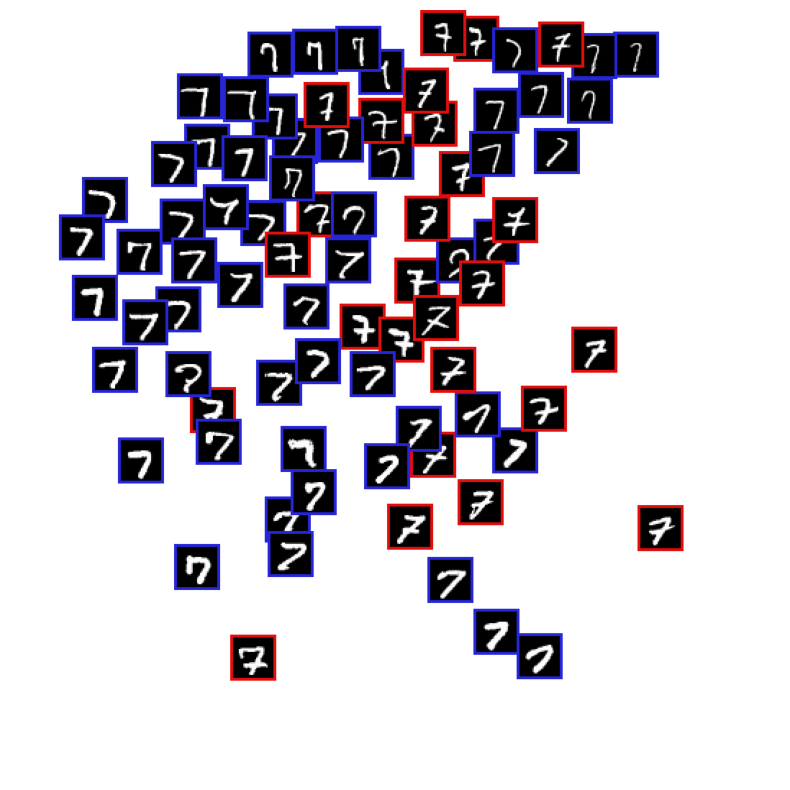

KM balanced accuracy score with hand-crafted labels :  0.5468370038017605
------------------------------------------------------------------
Epoch: 1 	Training Loss: 170.400426
         	Testing Loss: 134.827281


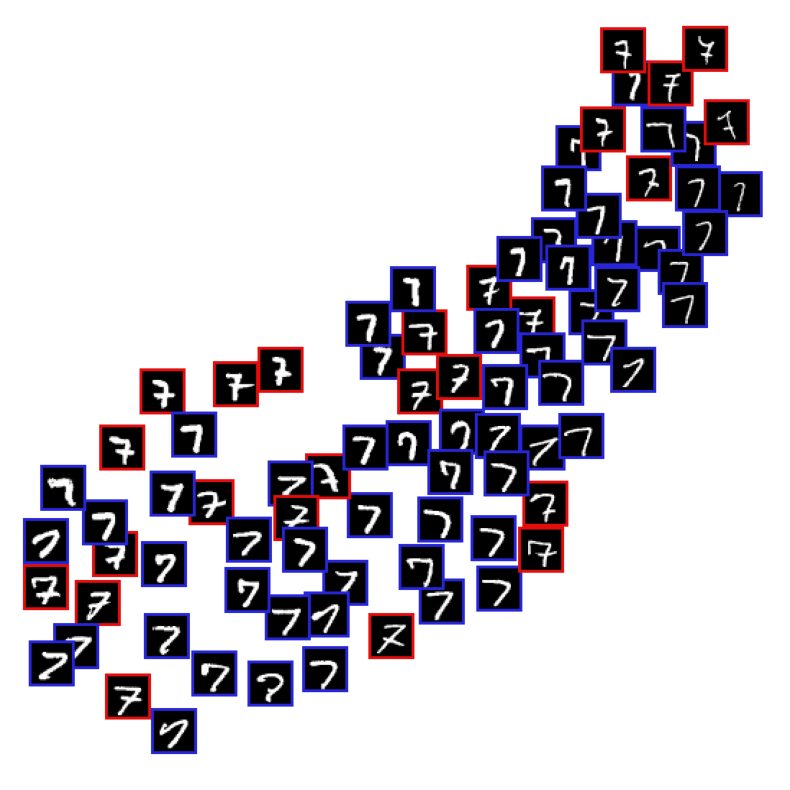

KM balanced accuracy score with hand-crafted labels :  0.551015515292667
------------------------------------------------------------------
Epoch: 2 	Training Loss: 107.564866
         	Testing Loss: 85.661151


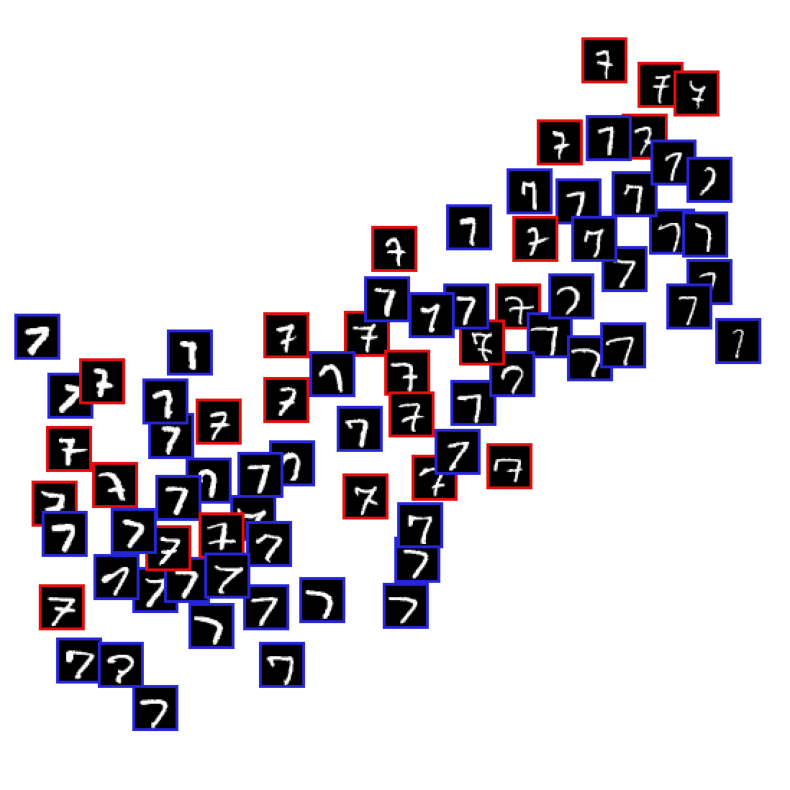

KM balanced accuracy score with hand-crafted labels :  0.5945987601465904
------------------------------------------------------------------
Epoch: 3 	Training Loss: 101.091441
         	Testing Loss: 80.993939


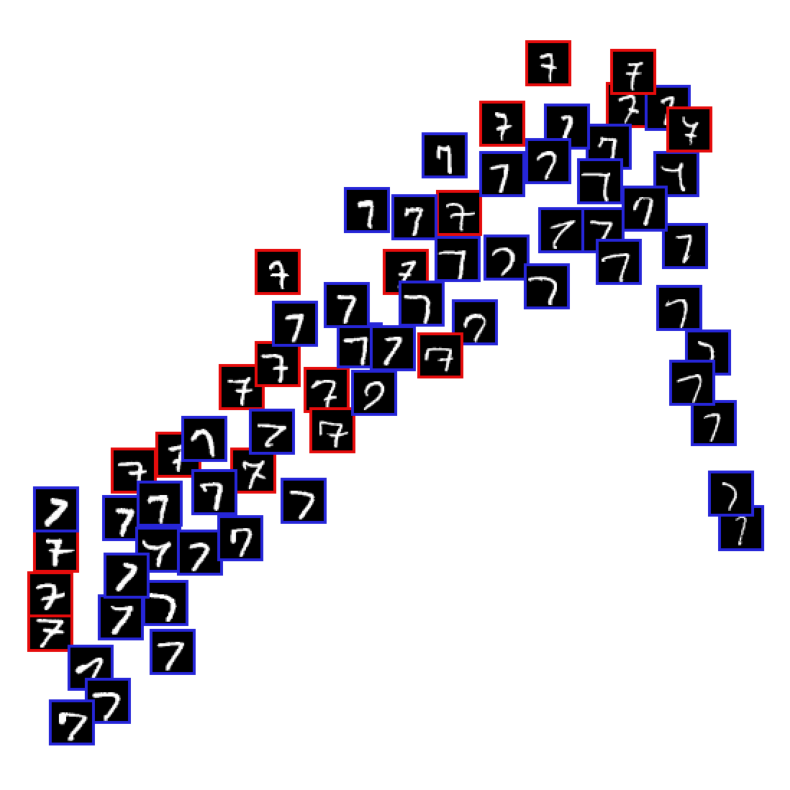

KM balanced accuracy score with hand-crafted labels :  0.6092578004589513
------------------------------------------------------------------
Epoch: 4 	Training Loss: 101.342204
         	Testing Loss: 75.614646


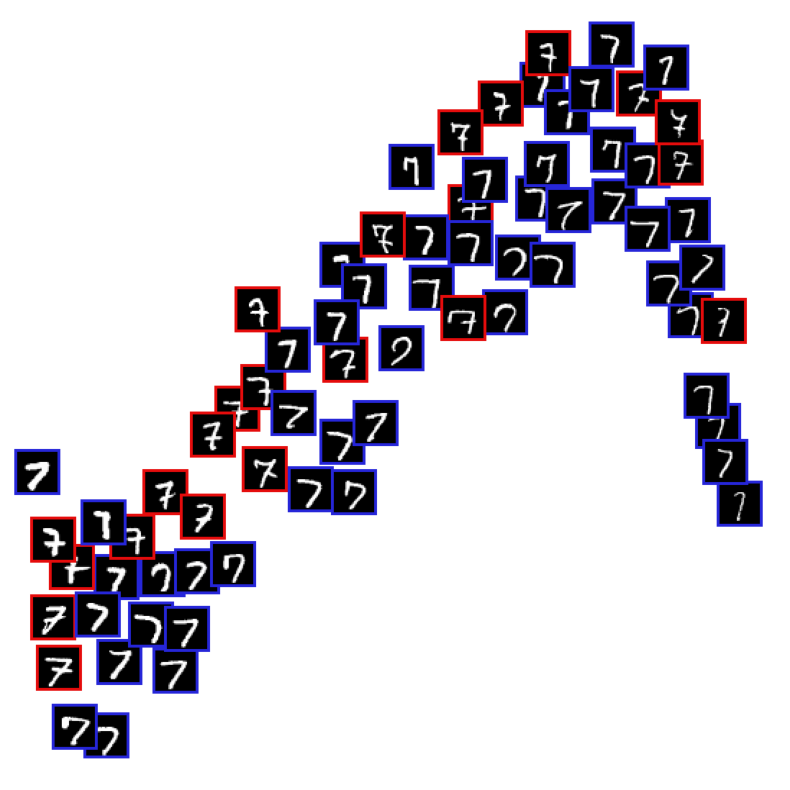

KM balanced accuracy score with hand-crafted labels :  0.6009521526184196
------------------------------------------------------------------
Epoch: 5 	Training Loss: 96.122410
         	Testing Loss: 75.177305


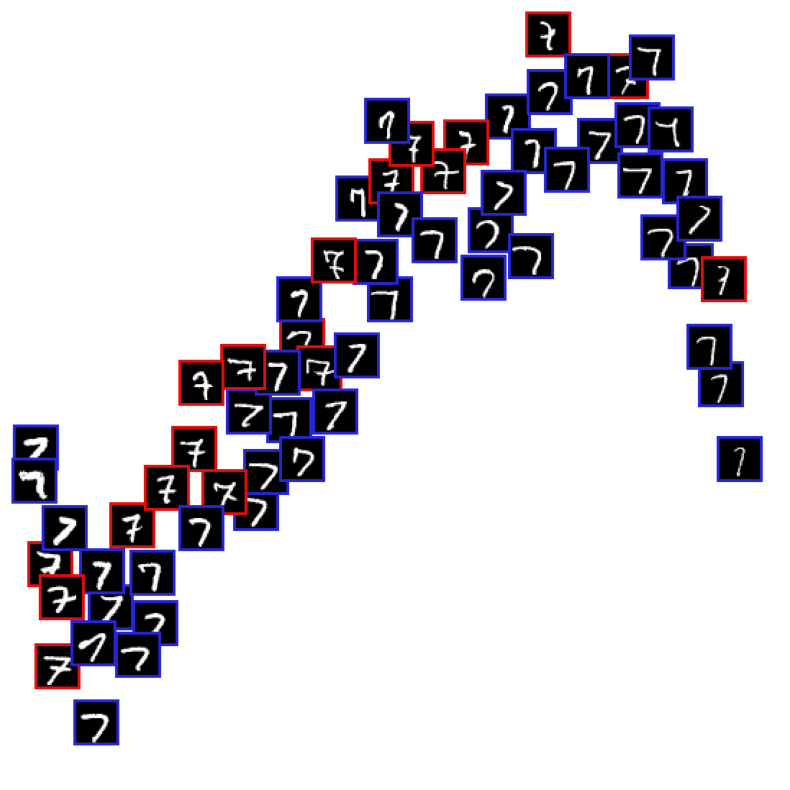

KM balanced accuracy score with hand-crafted labels :  0.599633523992191
------------------------------------------------------------------
Epoch: 6 	Training Loss: 95.936168
         	Testing Loss: 74.731288


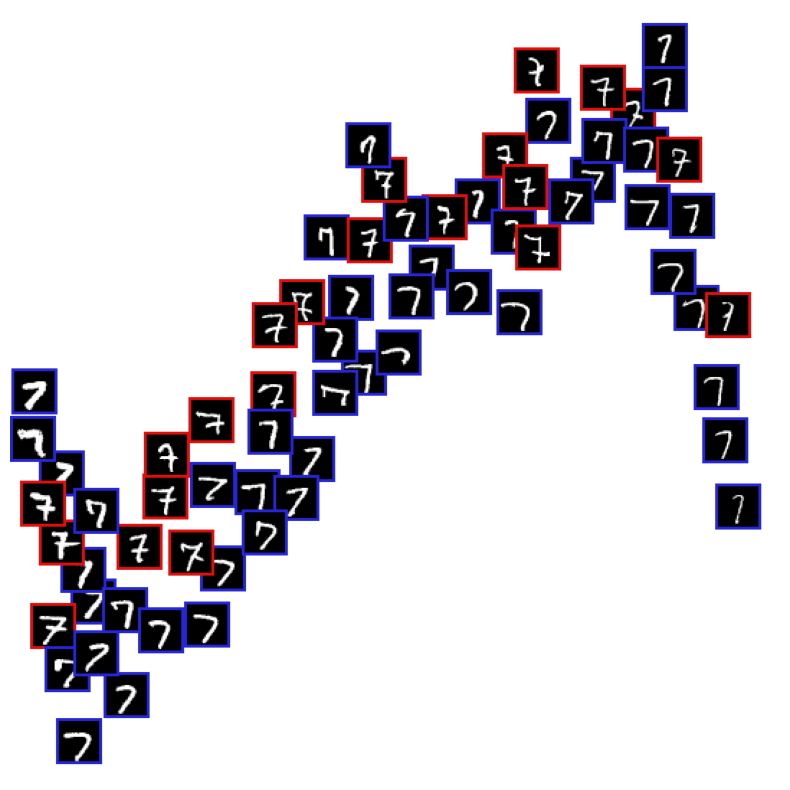

KM balanced accuracy score with hand-crafted labels :  0.5898379970544918
------------------------------------------------------------------
Epoch: 7 	Training Loss: 95.236968
         	Testing Loss: 74.395153


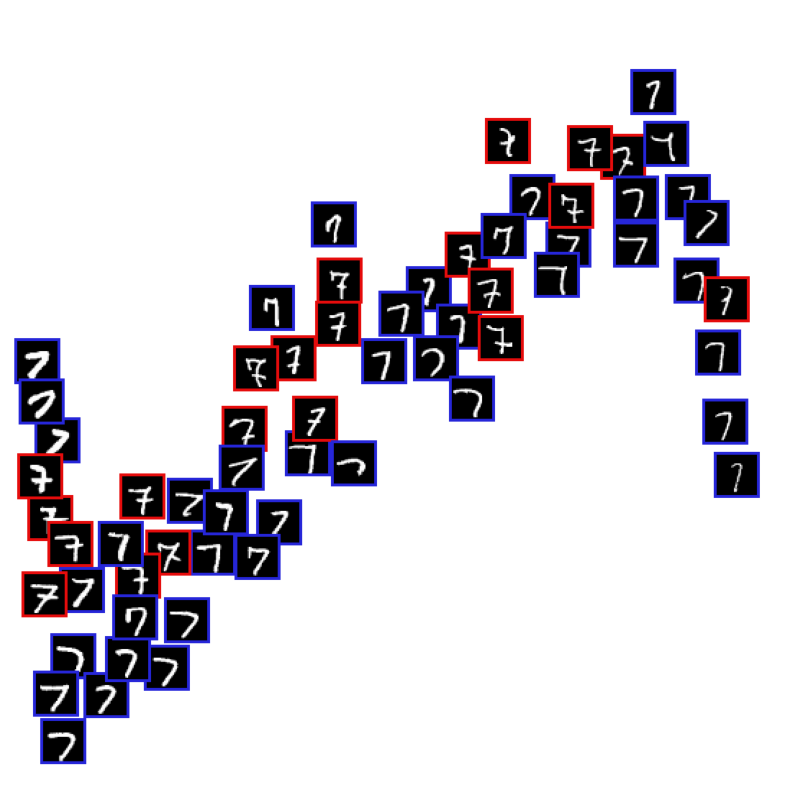

KM balanced accuracy score with hand-crafted labels :  0.5817035996848992
------------------------------------------------------------------
Epoch: 8 	Training Loss: 94.652101
         	Testing Loss: 73.932846


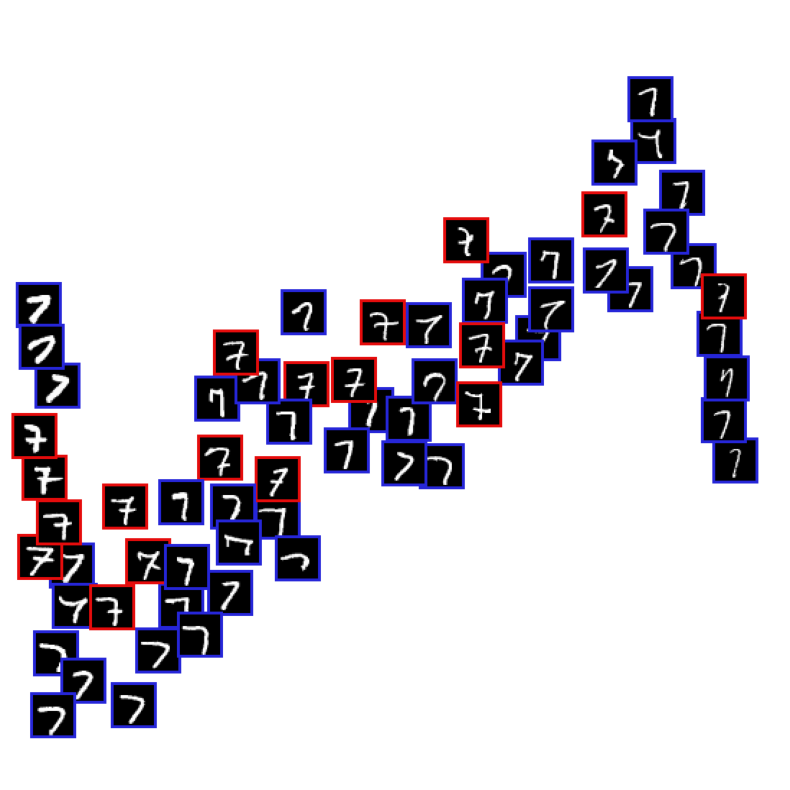

KM balanced accuracy score with hand-crafted labels :  0.5956776381135048
------------------------------------------------------------------
Epoch: 9 	Training Loss: 93.923229
         	Testing Loss: 73.924059


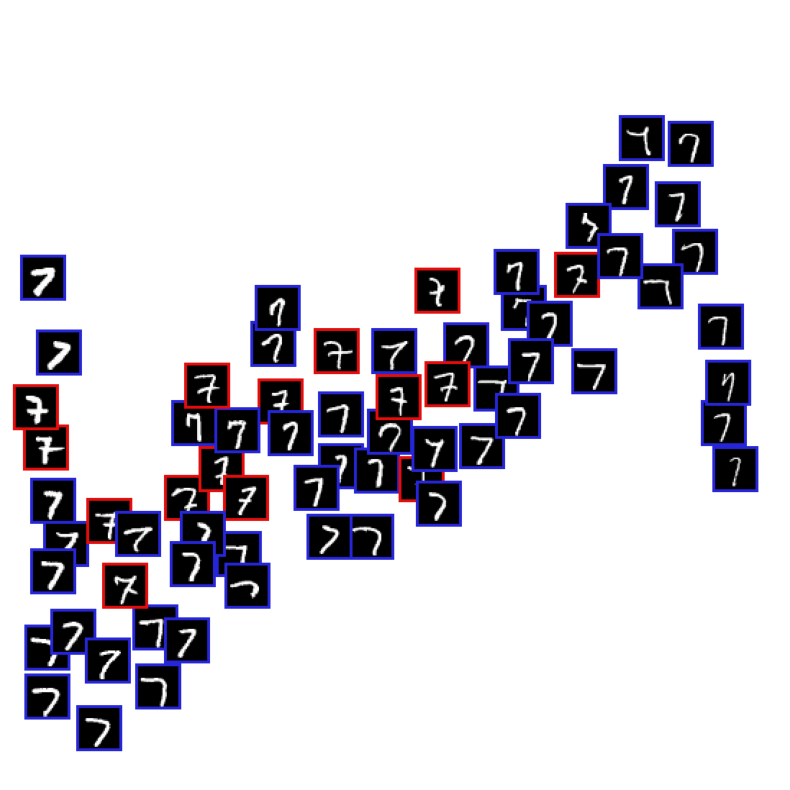

KM balanced accuracy score with hand-crafted labels :  0.5960201390553824
------------------------------------------------------------------
Epoch: 10 	Training Loss: 93.797825
         	Testing Loss: 72.962669


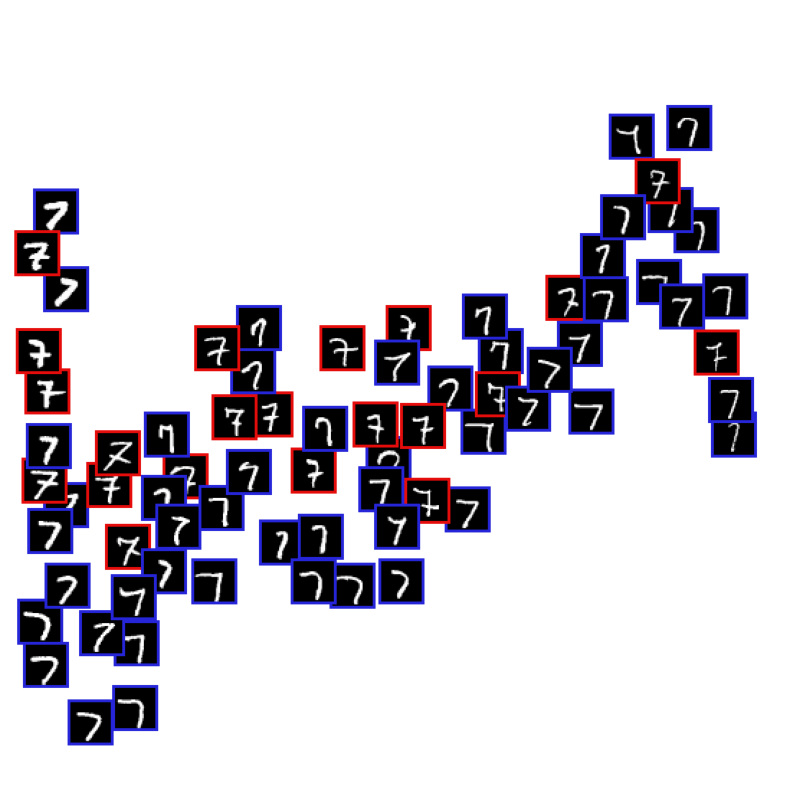

KM balanced accuracy score with hand-crafted labels :  0.5978525190944275
------------------------------------------------------------------
Epoch: 11 	Training Loss: 92.739311
         	Testing Loss: 73.132330


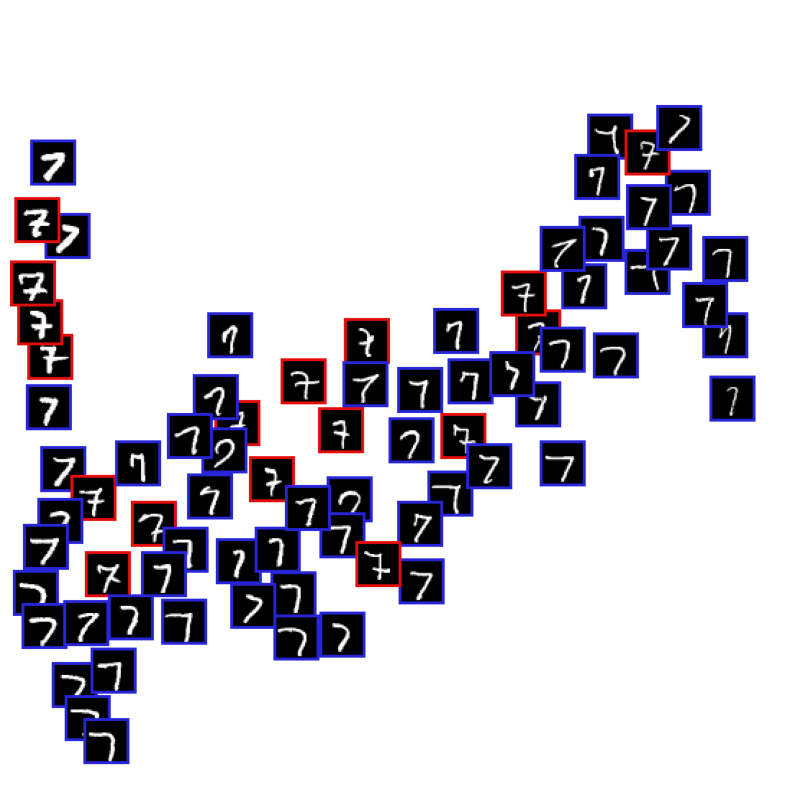

KM balanced accuracy score with hand-crafted labels :  0.6018597801143952
------------------------------------------------------------------
Epoch: 12 	Training Loss: 92.683475
         	Testing Loss: 73.614516


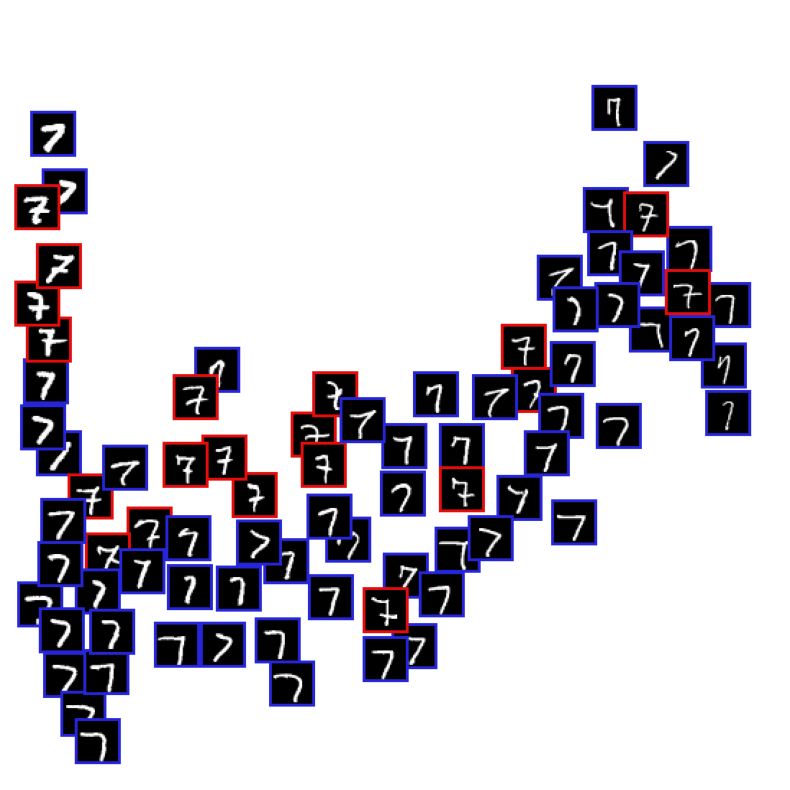

KM balanced accuracy score with hand-crafted labels :  0.5885707435695448
------------------------------------------------------------------
Epoch: 13 	Training Loss: 91.857226
         	Testing Loss: 72.834366


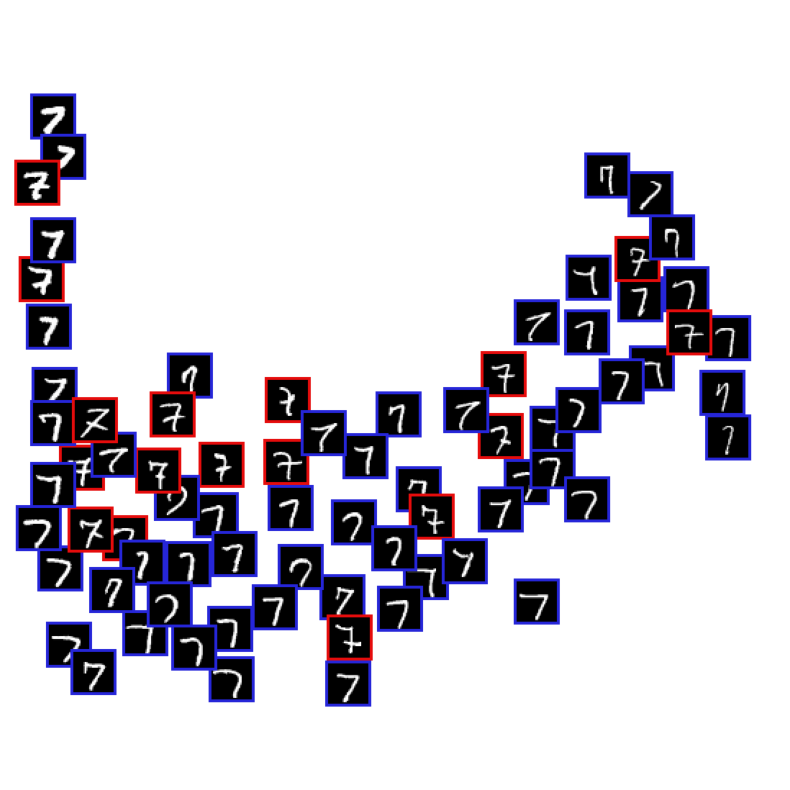

KM balanced accuracy score with hand-crafted labels :  0.5889132445114225
------------------------------------------------------------------
Epoch: 14 	Training Loss: 91.976481
         	Testing Loss: 72.570055


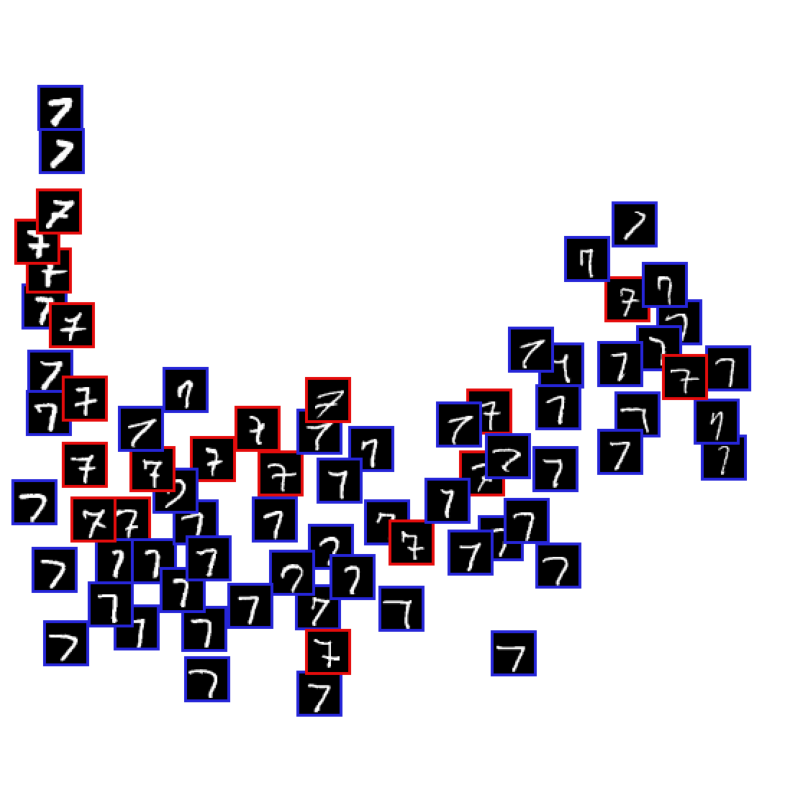

KM balanced accuracy score with hand-crafted labels :  0.5874233654142549
------------------------------------------------------------------
Epoch: 15 	Training Loss: 91.153407
         	Testing Loss: 71.900364


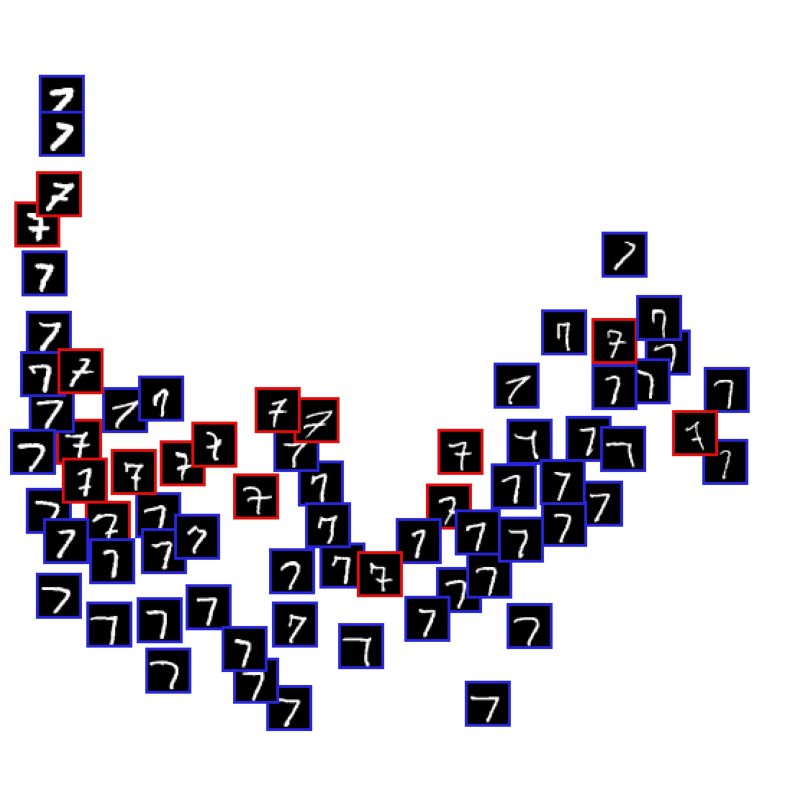

KM balanced accuracy score with hand-crafted labels :  0.582439976709936
------------------------------------------------------------------
Epoch: 16 	Training Loss: 90.742910
         	Testing Loss: 72.311366


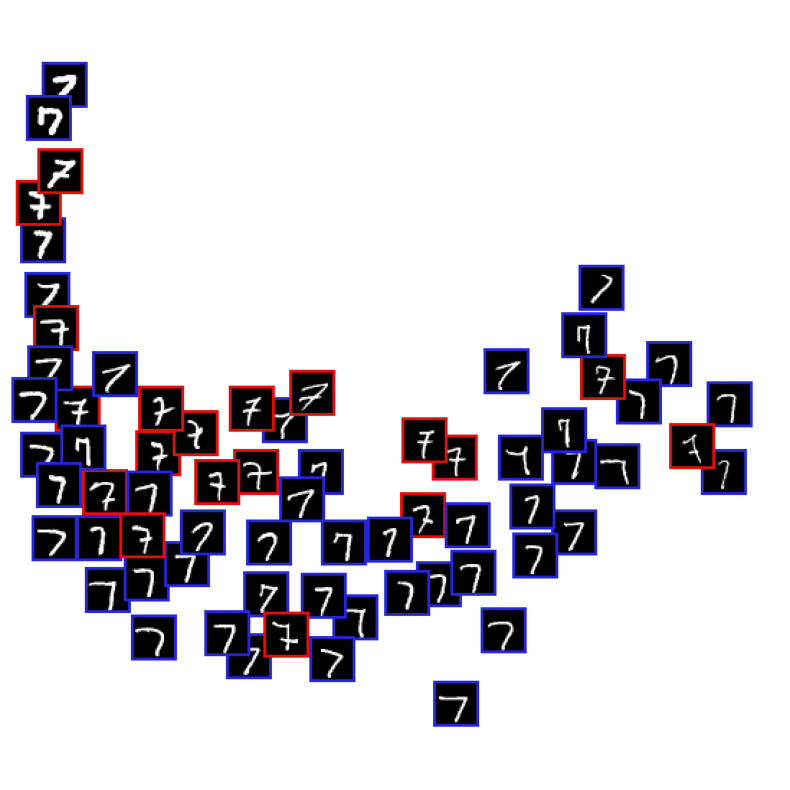

KM balanced accuracy score with hand-crafted labels :  0.5945816350994965
------------------------------------------------------------------
Epoch: 17 	Training Loss: 90.378438
         	Testing Loss: 71.674697


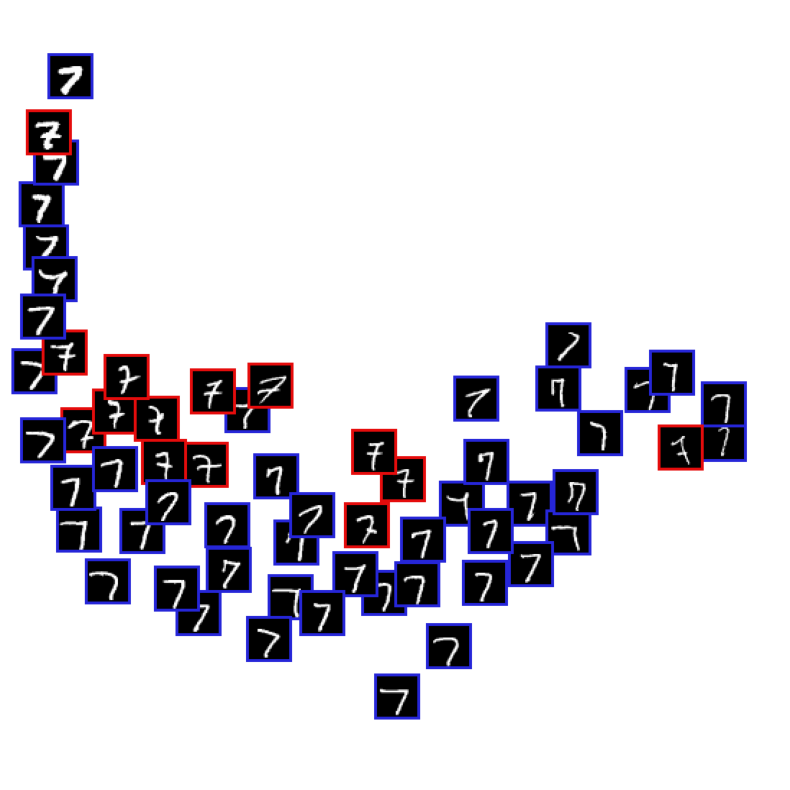

KM balanced accuracy score with hand-crafted labels :  0.5916018769051614
------------------------------------------------------------------
Epoch: 18 	Training Loss: 90.428737
         	Testing Loss: 71.758077


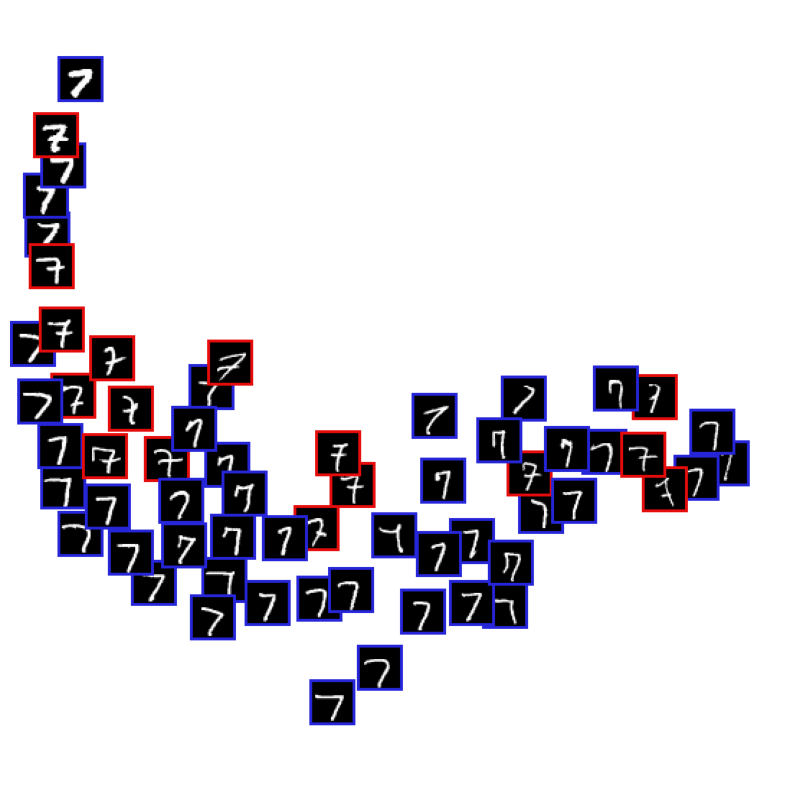

KM balanced accuracy score with hand-crafted labels :  0.5871322396136589
------------------------------------------------------------------
Epoch: 19 	Training Loss: 89.313772
         	Testing Loss: 72.082611


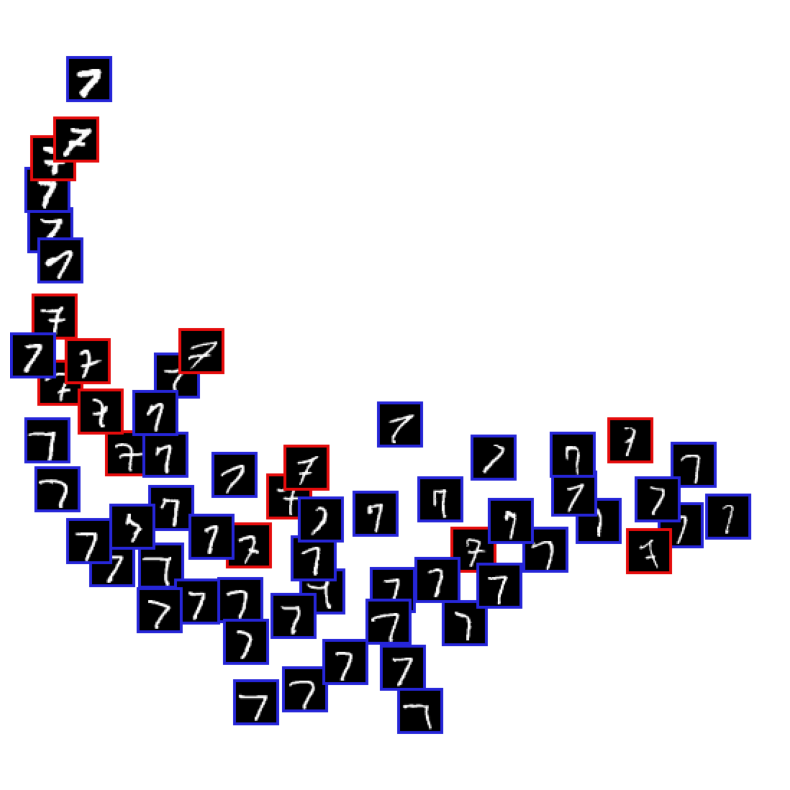

KM balanced accuracy score with hand-crafted labels :  0.5789978422440661
------------------------------------------------------------------
Epoch: 20 	Training Loss: 89.141871
         	Testing Loss: 72.383136


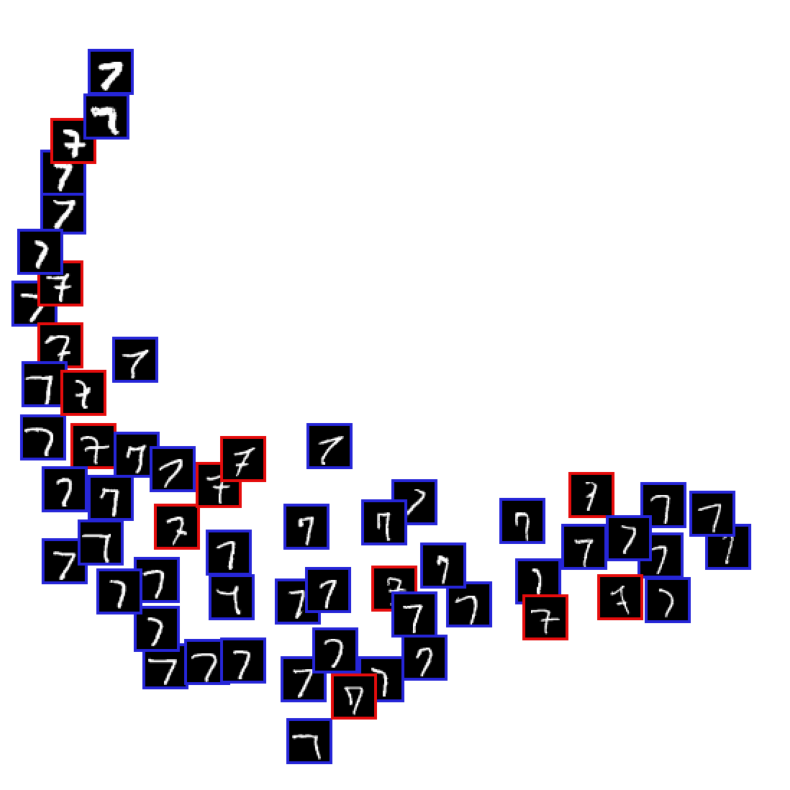

KM balanced accuracy score with hand-crafted labels :  0.5590642874267904
------------------------------------------------------------------
Epoch: 21 	Training Loss: 88.889646
         	Testing Loss: 71.370681


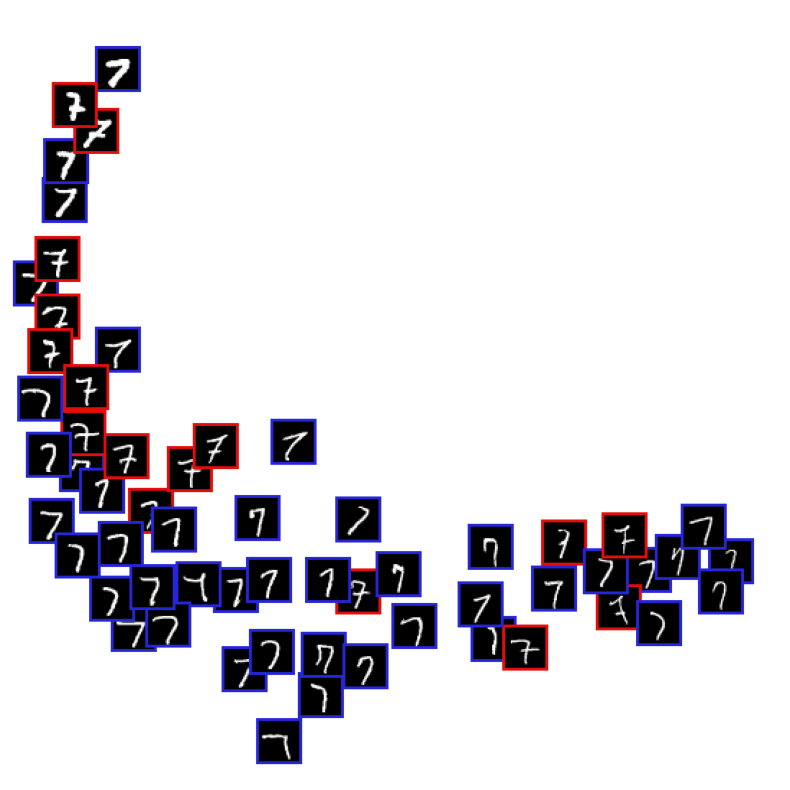

KM balanced accuracy score with hand-crafted labels :  0.5577456588005617
------------------------------------------------------------------
Epoch: 22 	Training Loss: 88.751105
         	Testing Loss: 71.628441


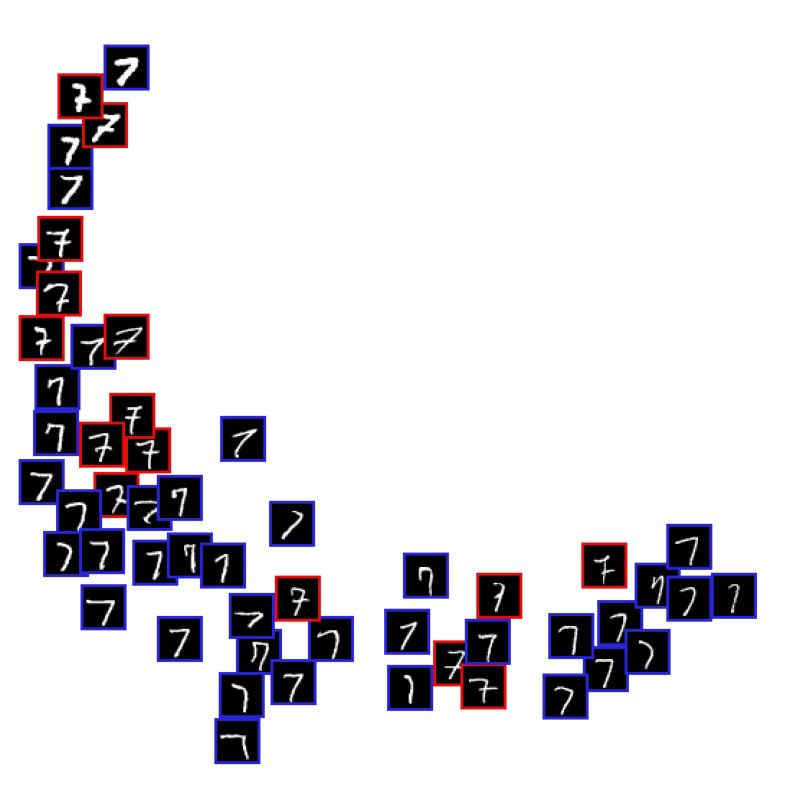

KM balanced accuracy score with hand-crafted labels :  0.5431379936294825
------------------------------------------------------------------
Epoch: 23 	Training Loss: 88.810019
         	Testing Loss: 71.185240


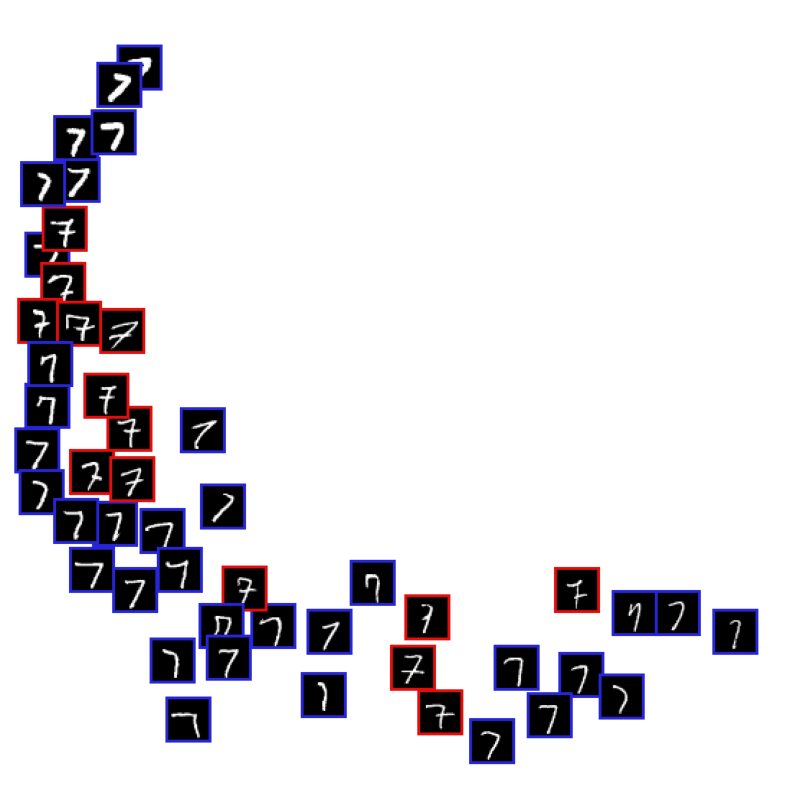

KM balanced accuracy score with hand-crafted labels :  0.5401582354351474
------------------------------------------------------------------
Epoch: 24 	Training Loss: 88.474672
         	Testing Loss: 70.772095


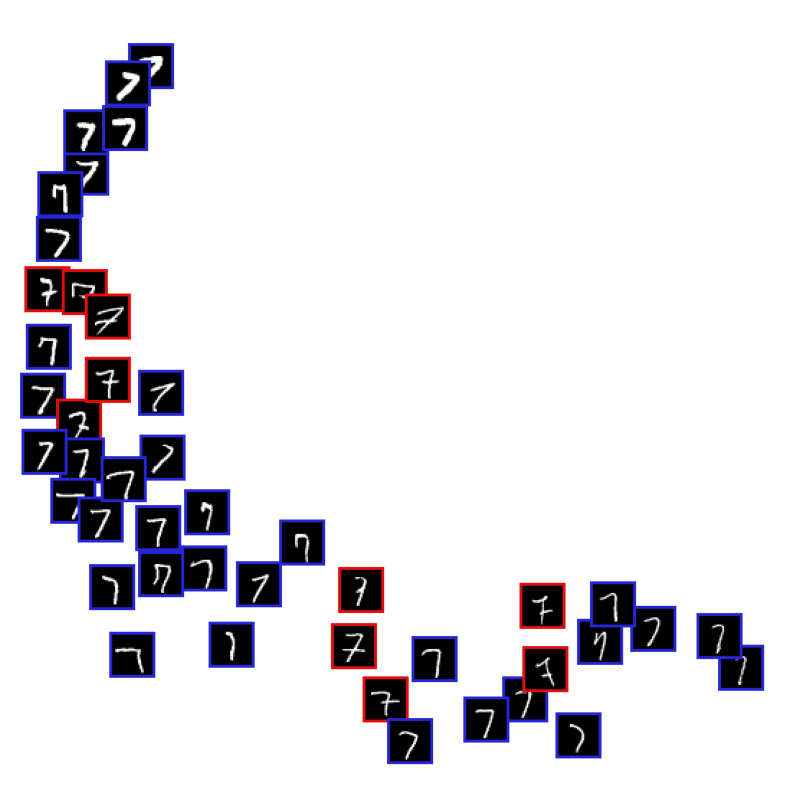

KM balanced accuracy score with hand-crafted labels :  0.5320238380655546
------------------------------------------------------------------
Epoch: 25 	Training Loss: 88.967283
         	Testing Loss: 69.936254


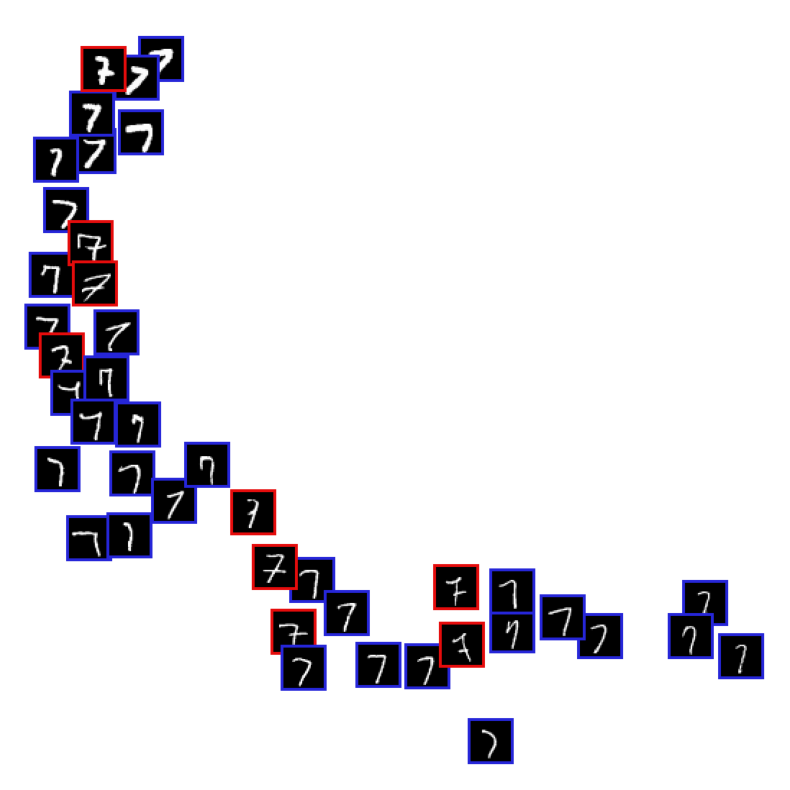

KM balanced accuracy score with hand-crafted labels :  0.5237181902250232
------------------------------------------------------------------
Epoch: 26 	Training Loss: 90.719677
         	Testing Loss: 70.659716


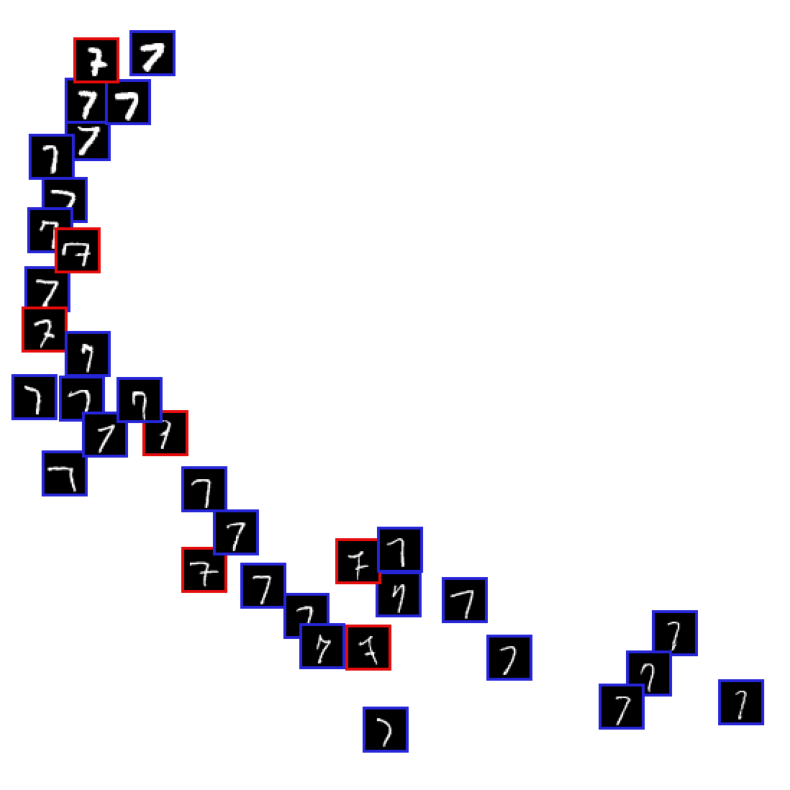

KM balanced accuracy score with hand-crafted labels :  0.513922663287324
------------------------------------------------------------------
Epoch: 27 	Training Loss: 93.789604
         	Testing Loss: 72.140995


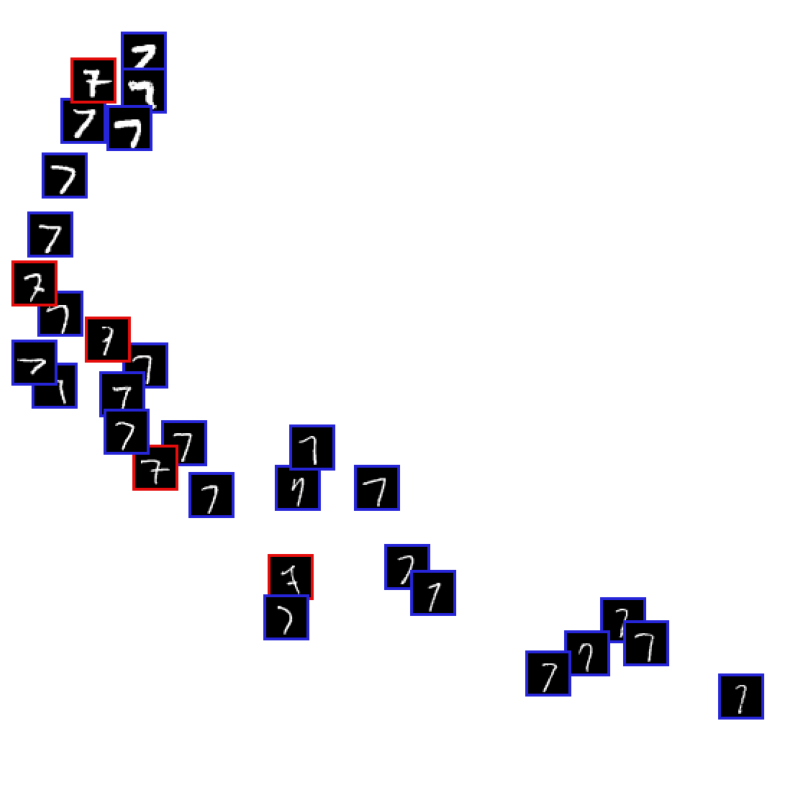

KM balanced accuracy score with hand-crafted labels :  0.5122615337192177
------------------------------------------------------------------
Epoch: 28 	Training Loss: 91.337237
         	Testing Loss: 71.673993


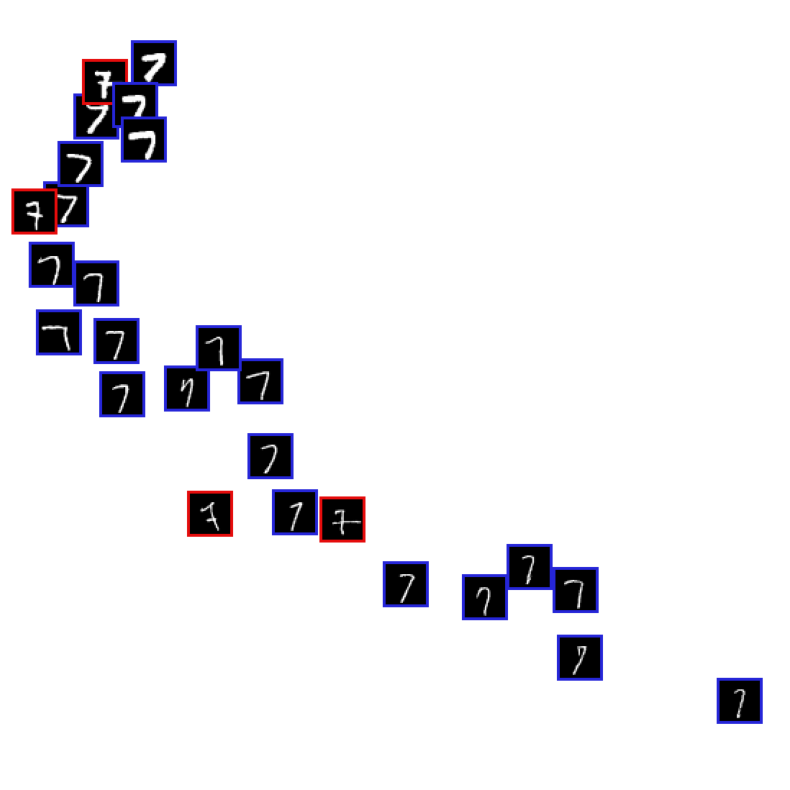

KM balanced accuracy score with hand-crafted labels :  0.5192485529335206
------------------------------------------------------------------
Epoch: 29 	Training Loss: 102.641461
         	Testing Loss: 79.104235


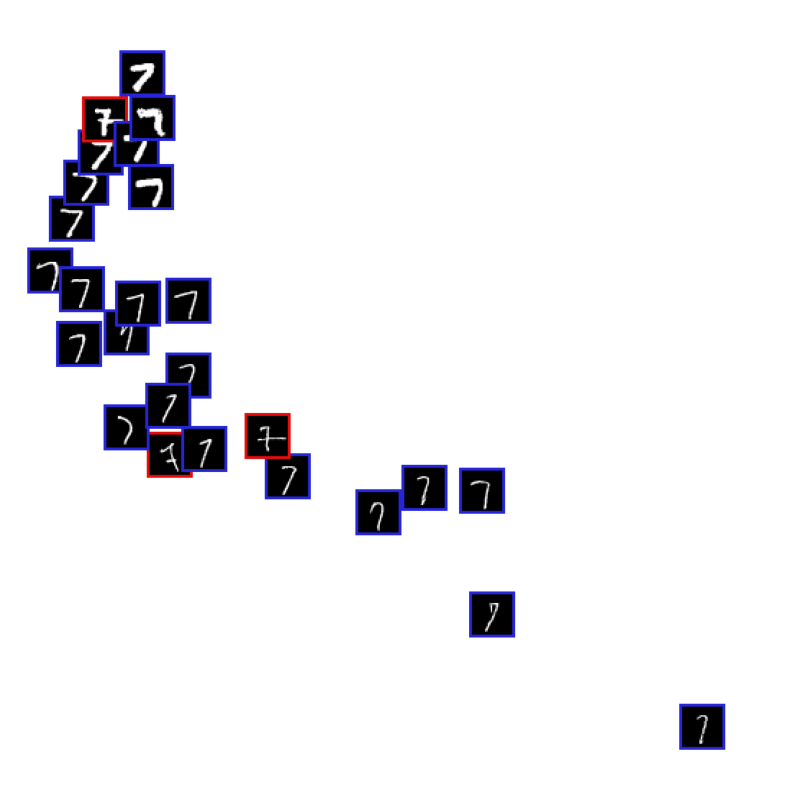

KM balanced accuracy score with hand-crafted labels :  0.5092817755248827
------------------------------------------------------------------
Epoch: 30 	Training Loss: 103.385335
         	Testing Loss: 80.643328


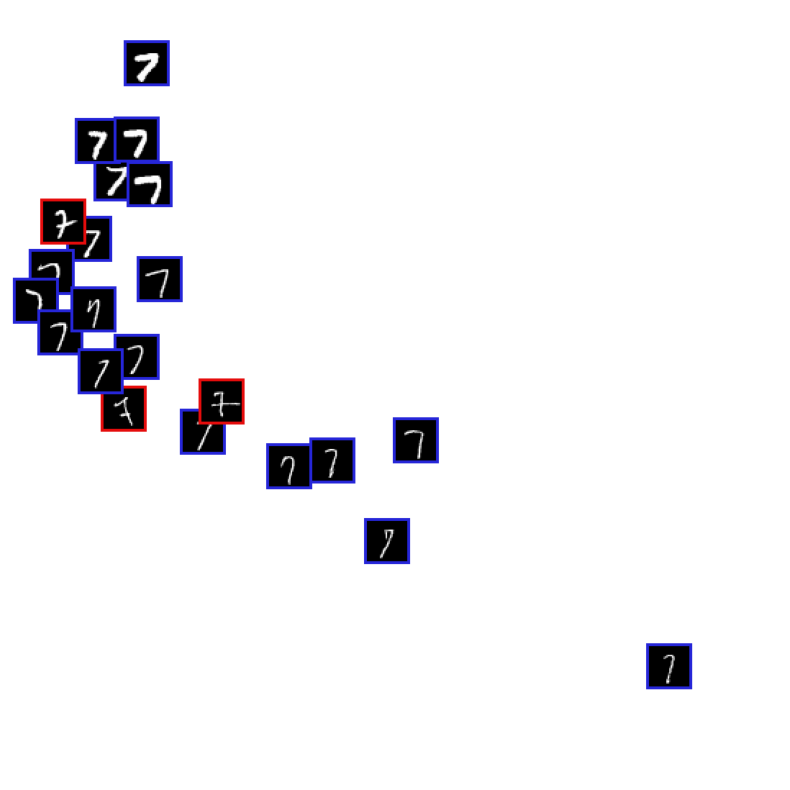

KM balanced accuracy score with hand-crafted labels :  0.5092817755248827
------------------------------------------------------------------
Epoch: 31 	Training Loss: 113.691338
         	Testing Loss: 87.768341


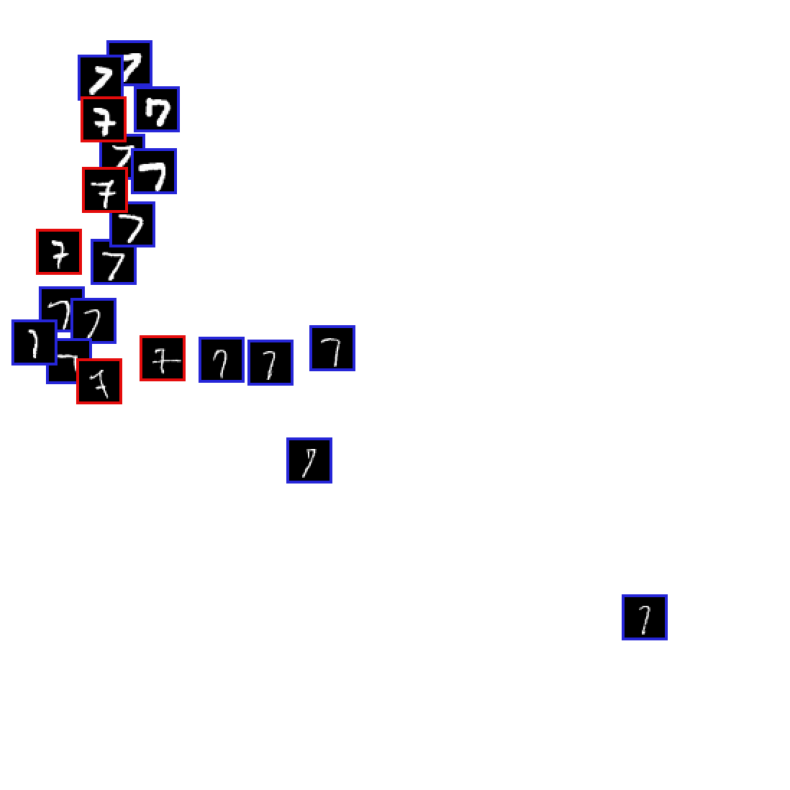

KM balanced accuracy score with hand-crafted labels :  0.5127752851320341
------------------------------------------------------------------
Epoch: 32 	Training Loss: 120.373421
         	Testing Loss: 93.134845


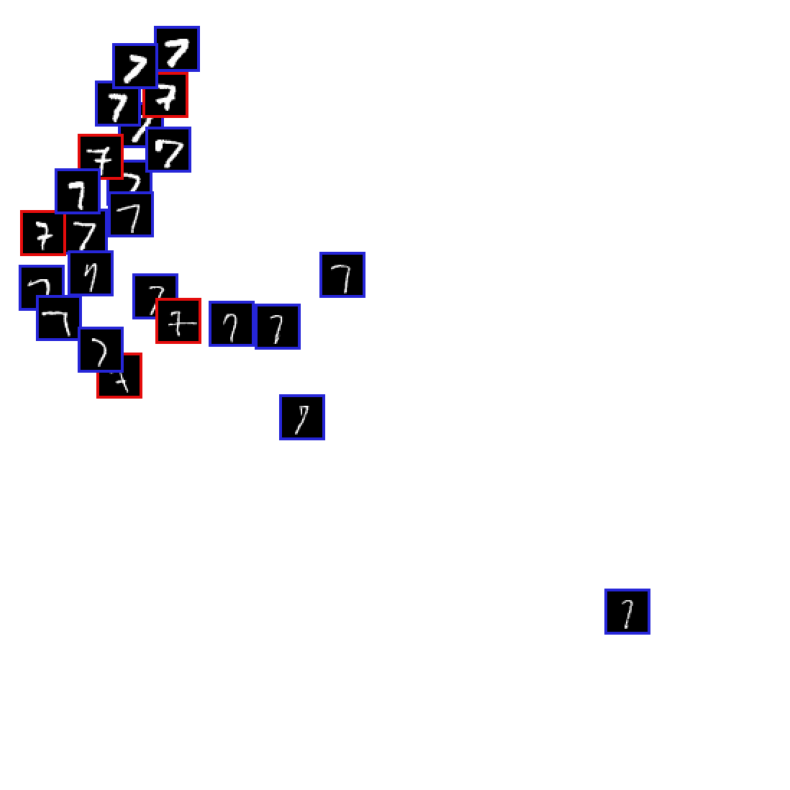

KM balanced accuracy score with hand-crafted labels :  0.5492173853478097
------------------------------------------------------------------
Epoch: 33 	Training Loss: 161.635501
         	Testing Loss: 126.258154


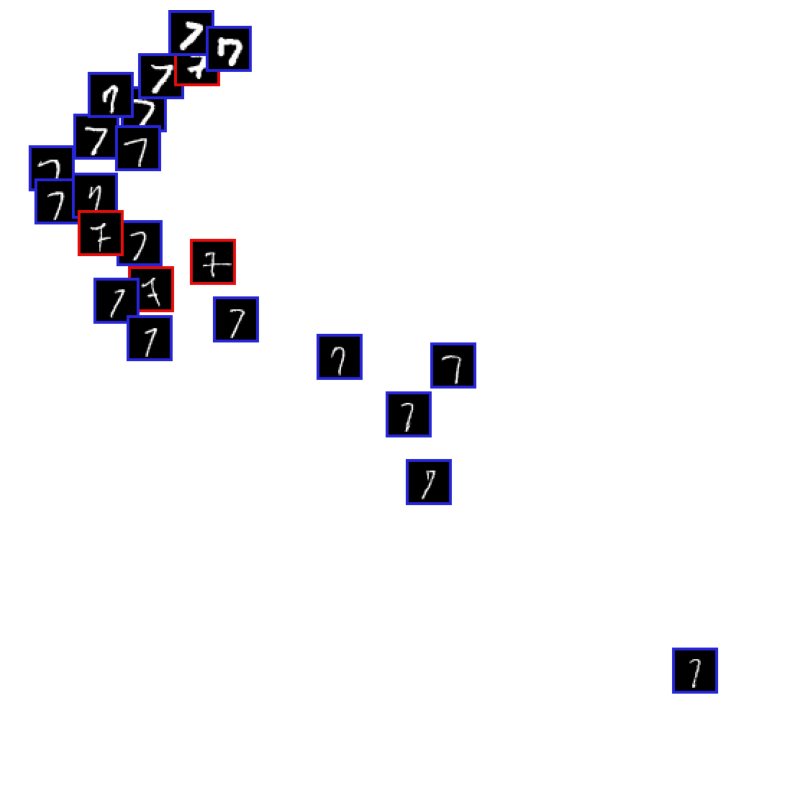

KM balanced accuracy score with hand-crafted labels :  0.5237181902250232
------------------------------------------------------------------
Epoch: 34 	Training Loss: 128.869111
         	Testing Loss: 92.321624


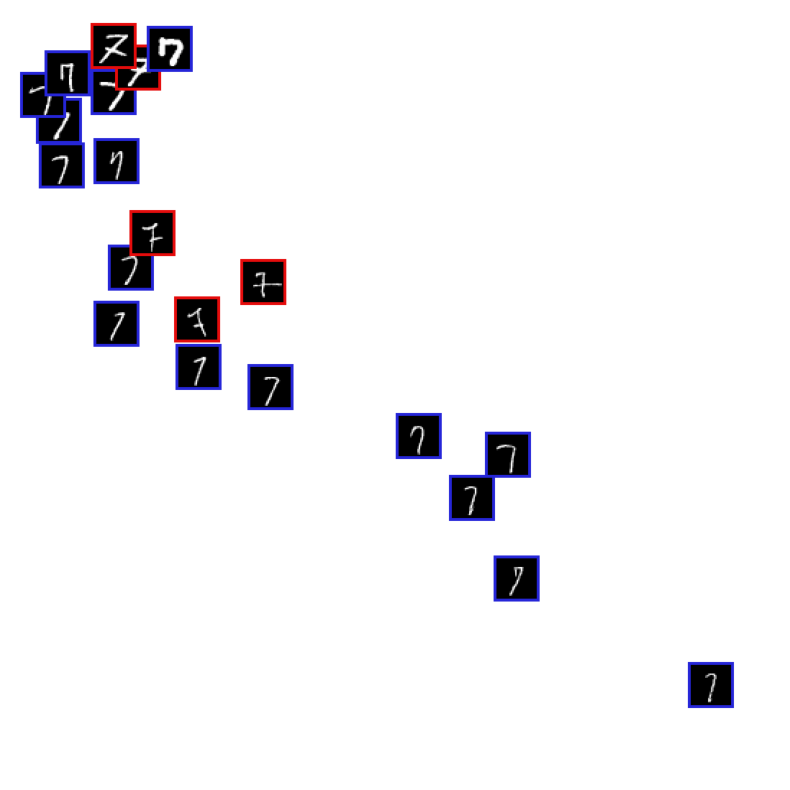

KM balanced accuracy score with hand-crafted labels :  0.5092817755248827
------------------------------------------------------------------
Epoch: 35 	Training Loss: 85.078523
         	Testing Loss: 68.947901


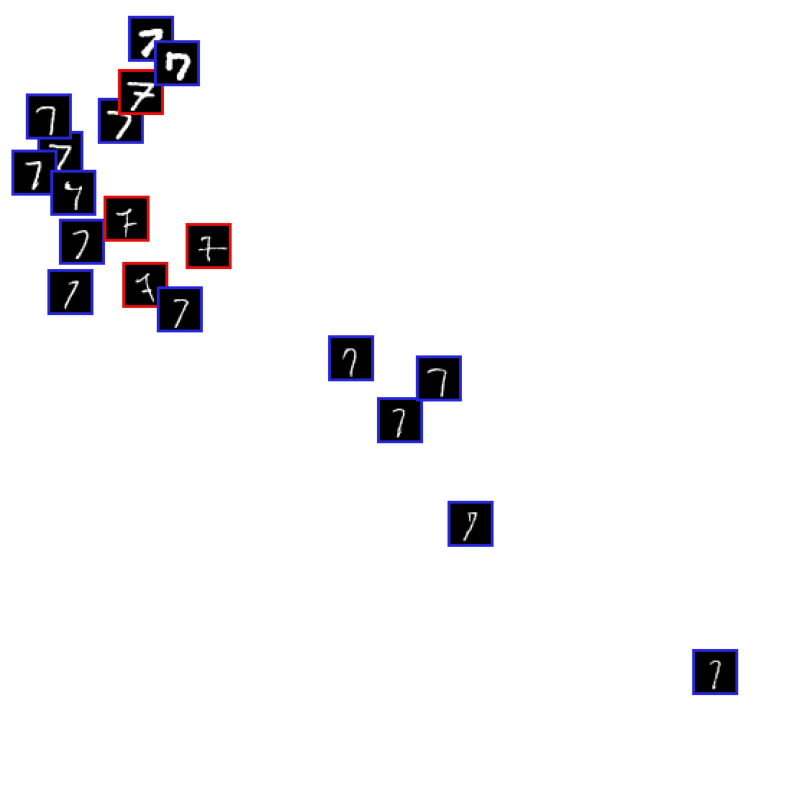

KM balanced accuracy score with hand-crafted labels :  0.5094530259958215
------------------------------------------------------------------
Epoch: 36 	Training Loss: 85.183633
         	Testing Loss: 69.302979


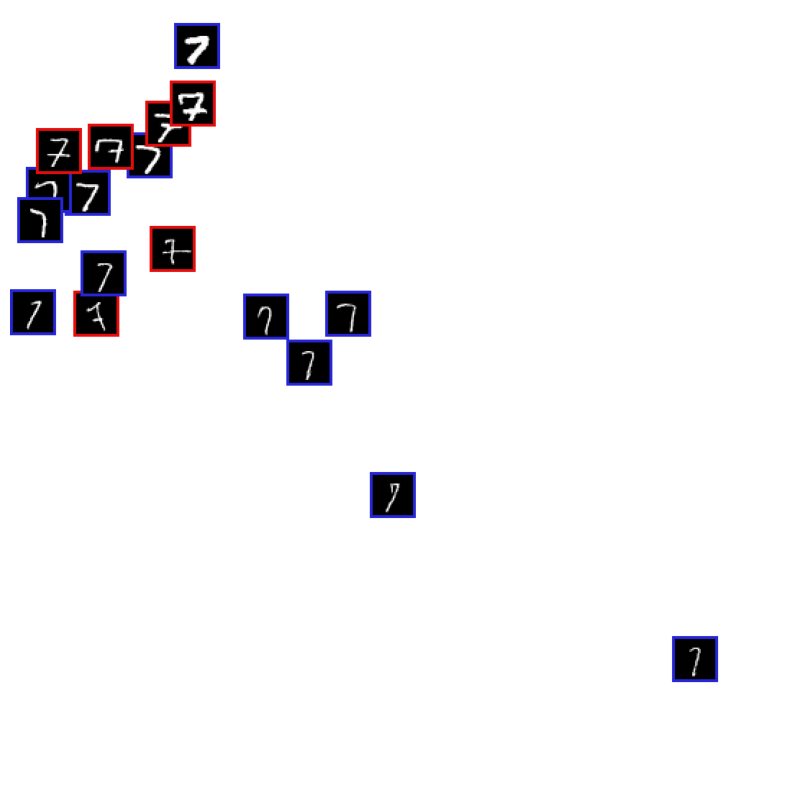

KM balanced accuracy score with hand-crafted labels :  0.5028085077233962
------------------------------------------------------------------
Epoch: 37 	Training Loss: 86.110780
         	Testing Loss: 69.954409


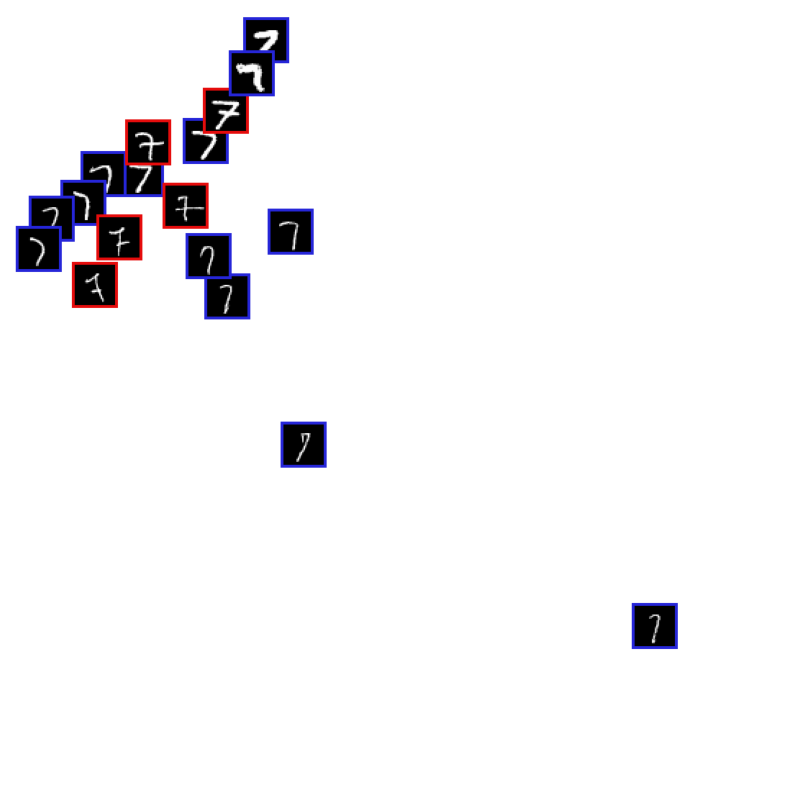

KM balanced accuracy score with hand-crafted labels :  0.5021748809809228
------------------------------------------------------------------
Epoch: 38 	Training Loss: 87.768412
         	Testing Loss: 71.308311


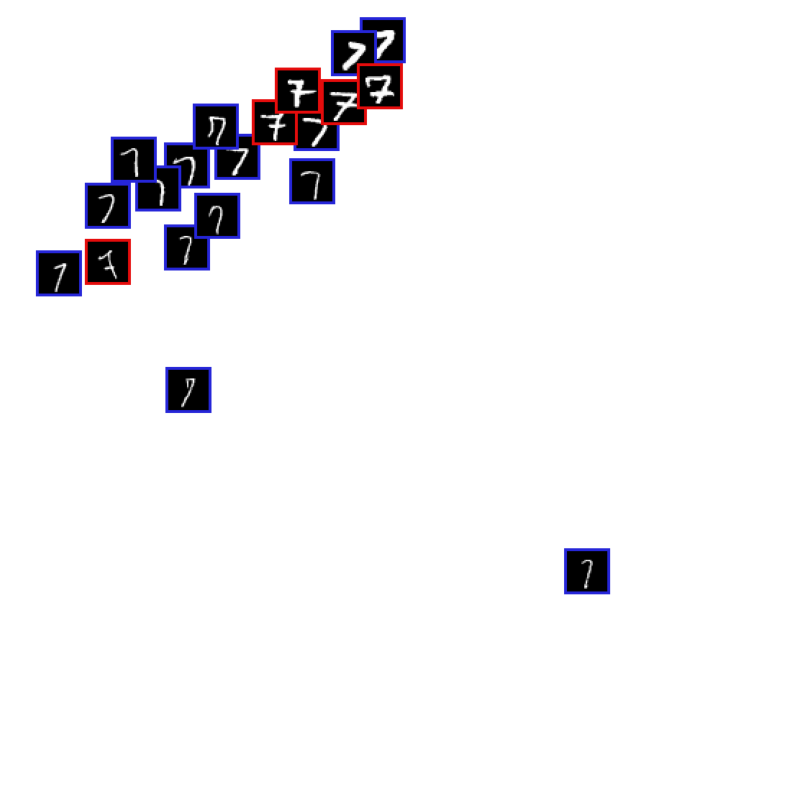

KM balanced accuracy score with hand-crafted labels :  0.5003425009418776
------------------------------------------------------------------
Epoch: 39 	Training Loss: 88.939111
         	Testing Loss: 72.412464


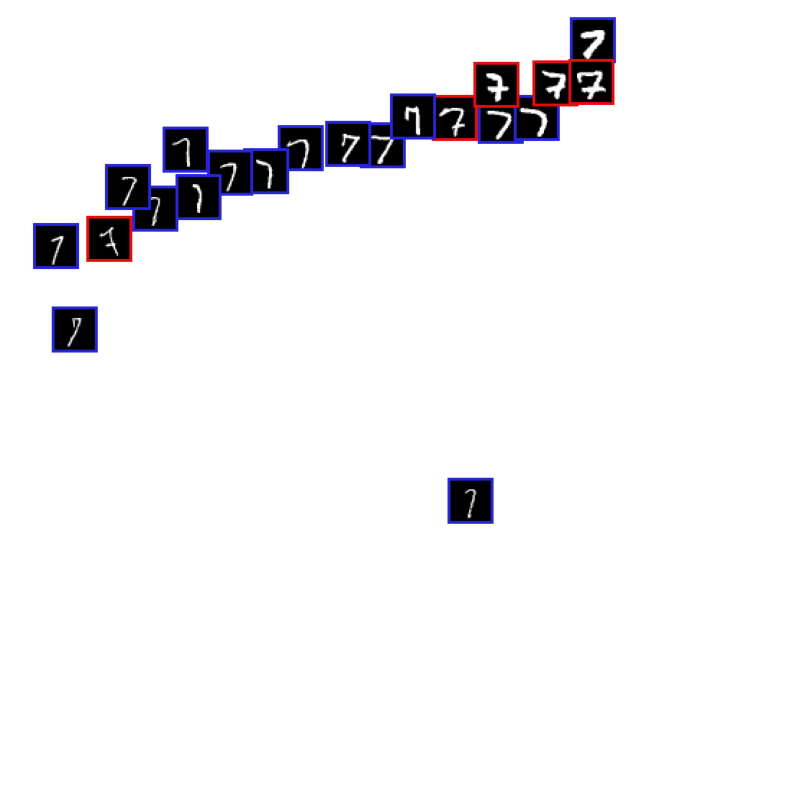

KM balanced accuracy score with hand-crafted labels :  0.5937425077918964
------------------------------------------------------------------
Epoch: 40 	Training Loss: 168.869152
         	Testing Loss: 136.758792


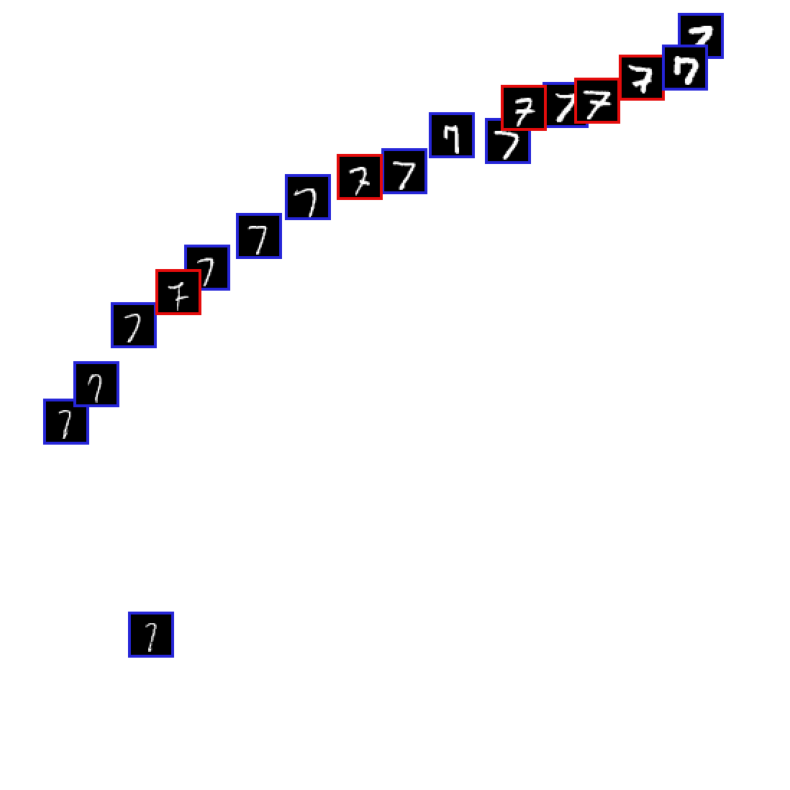

KM balanced accuracy score with hand-crafted labels :  0.603760660341816
------------------------------------------------------------------
Epoch: 41 	Training Loss: 147.163123
         	Testing Loss: 111.393068


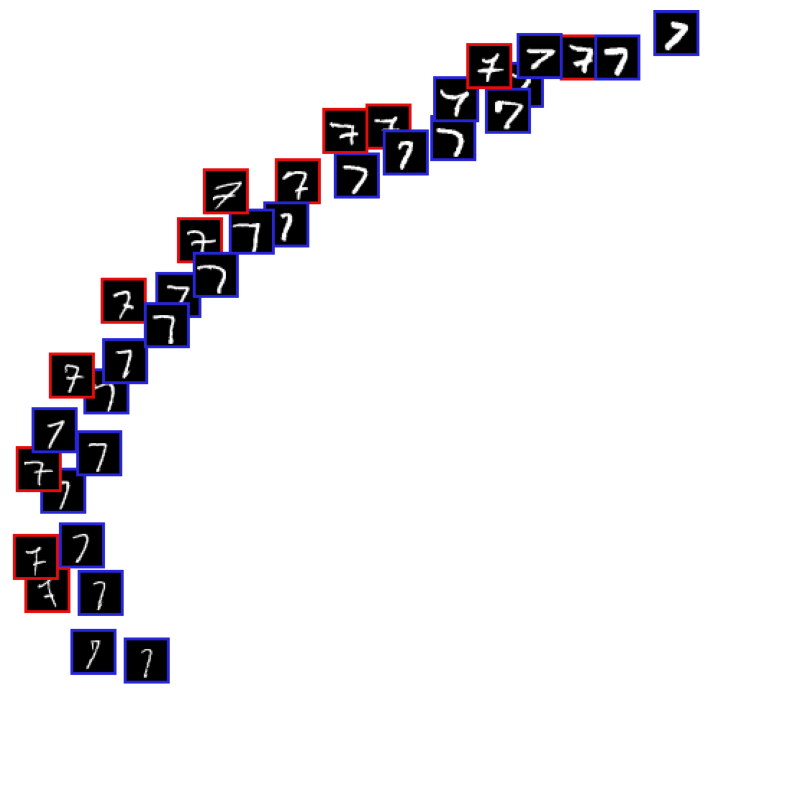

KM balanced accuracy score with hand-crafted labels :  0.6274103503784636
------------------------------------------------------------------
Epoch: 42 	Training Loss: 108.239340
         	Testing Loss: 80.702487


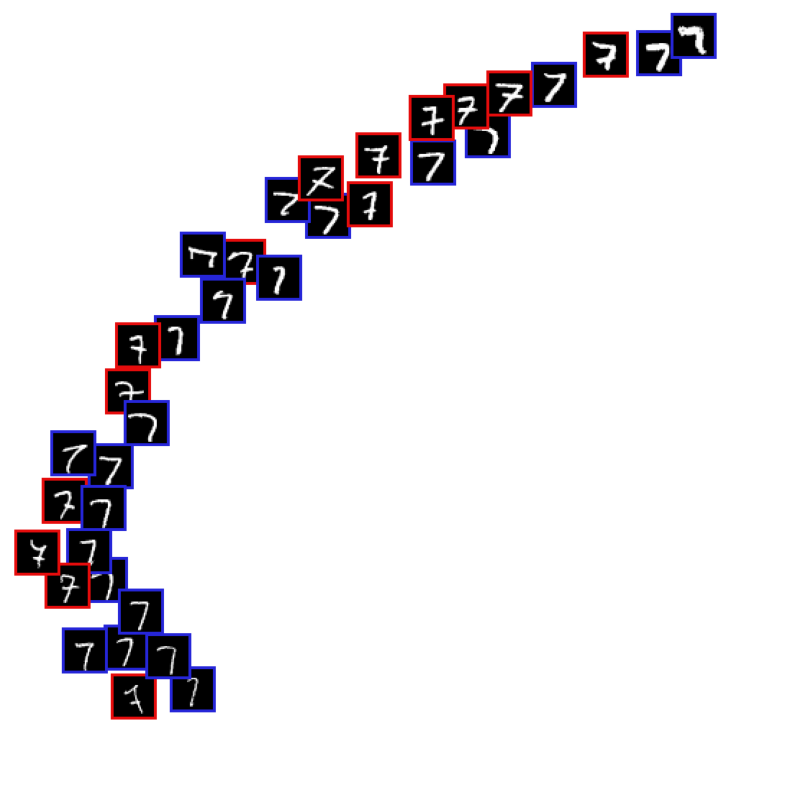

KM balanced accuracy score with hand-crafted labels :  0.6019796554440524
------------------------------------------------------------------
Epoch: 43 	Training Loss: 97.004422
         	Testing Loss: 74.615314


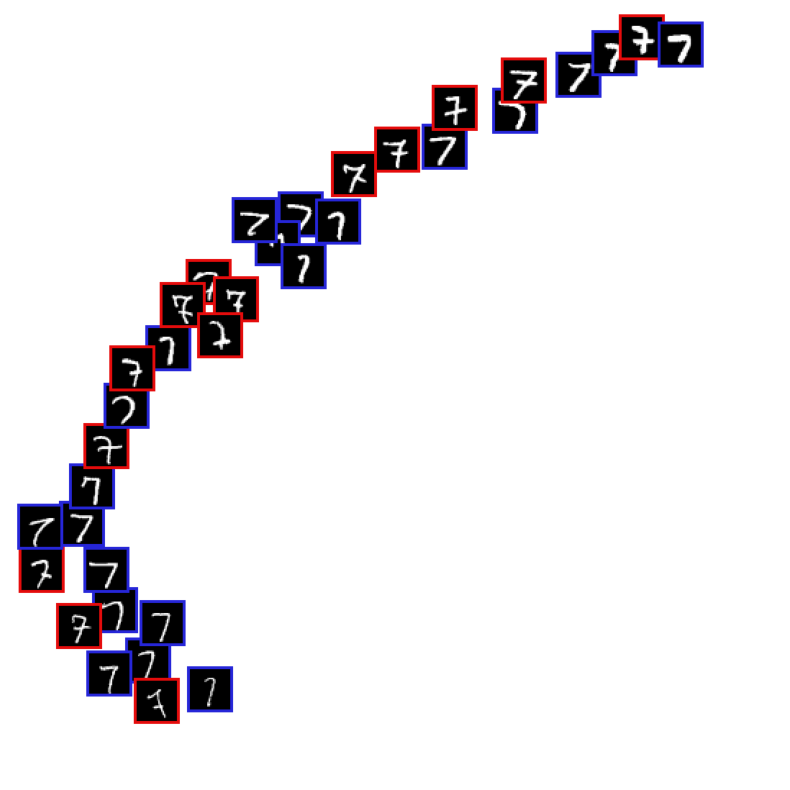

KM balanced accuracy score with hand-crafted labels :  0.5968250162687947
------------------------------------------------------------------
Epoch: 44 	Training Loss: 94.897985
         	Testing Loss: 73.408501


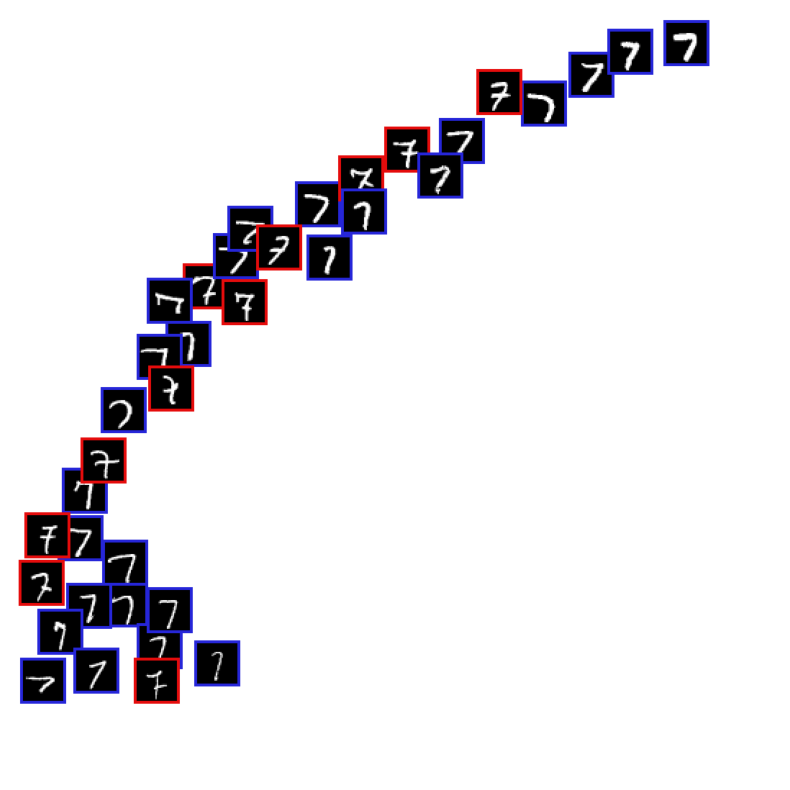

KM balanced accuracy score with hand-crafted labels :  0.5866869883892181
------------------------------------------------------------------
Epoch: 45 	Training Loss: 93.882006
         	Testing Loss: 72.817226


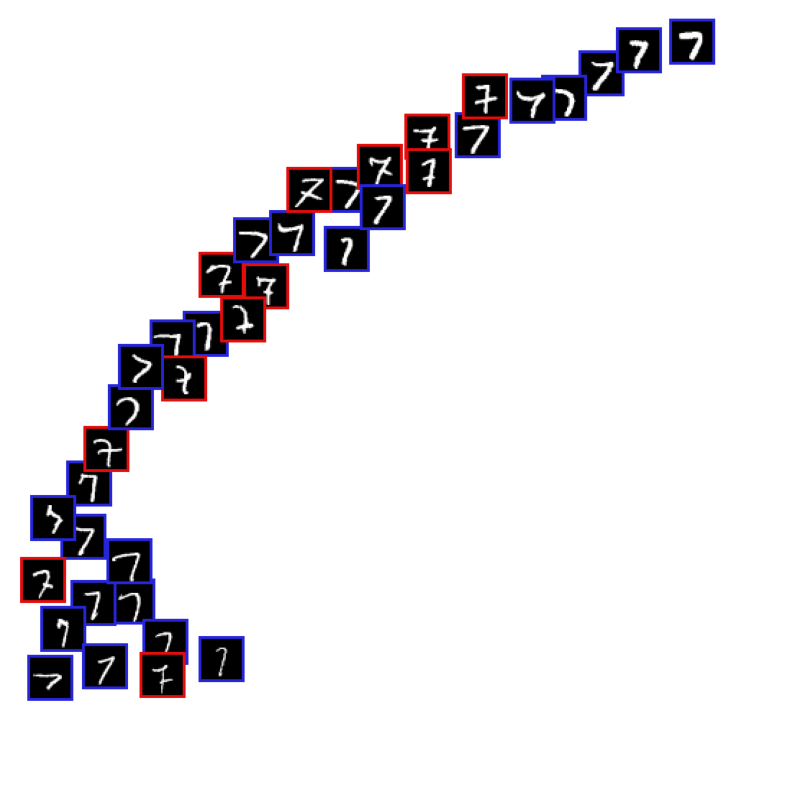

KM balanced accuracy score with hand-crafted labels :  0.581874850155838
------------------------------------------------------------------
Epoch: 46 	Training Loss: 94.069720
         	Testing Loss: 72.832263


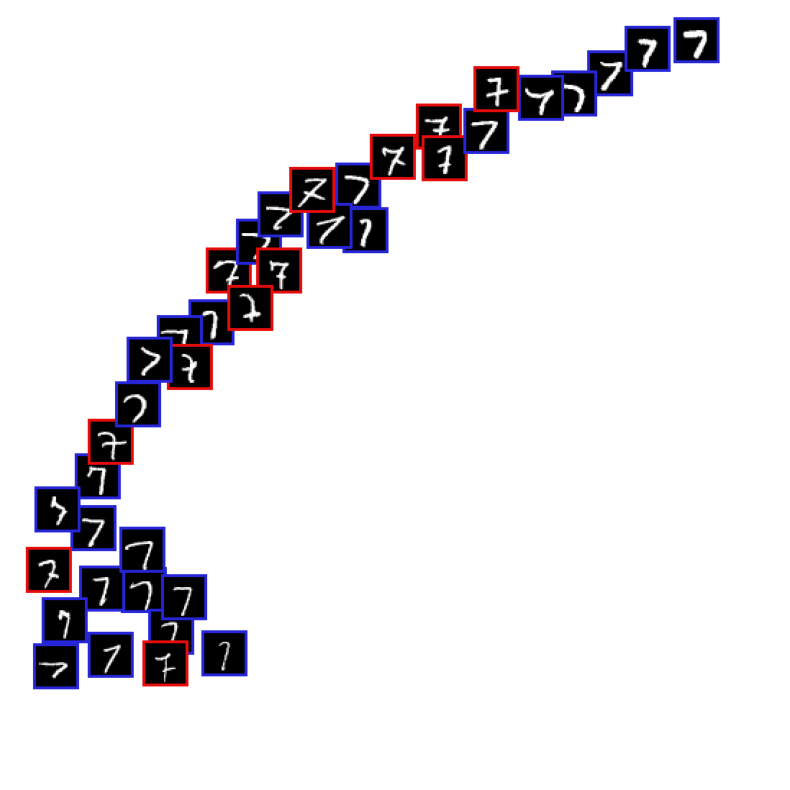

KM balanced accuracy score with hand-crafted labels :  0.5853683597629893
------------------------------------------------------------------
Epoch: 47 	Training Loss: 93.252405
         	Testing Loss: 72.789895


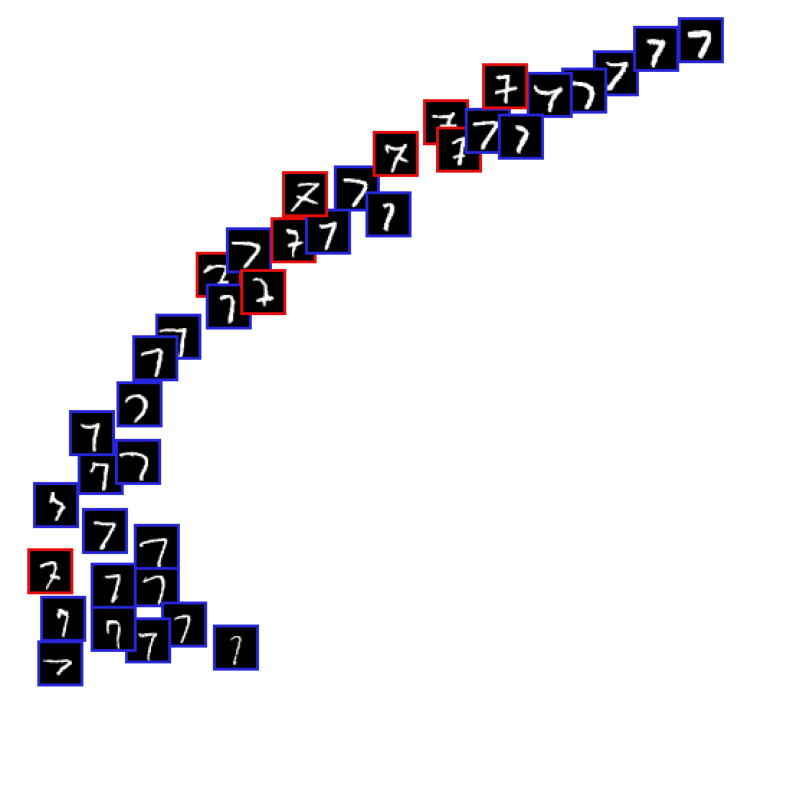

KM balanced accuracy score with hand-crafted labels :  0.5853683597629893
------------------------------------------------------------------
Epoch: 48 	Training Loss: 92.735725
         	Testing Loss: 72.579734


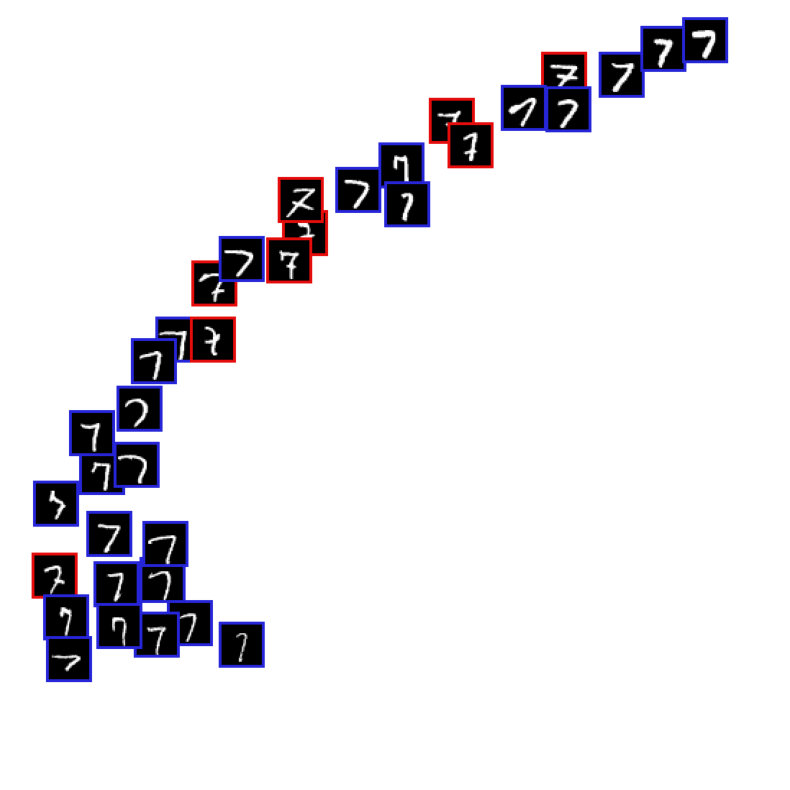

KM balanced accuracy score with hand-crafted labels :  0.583707230194883
------------------------------------------------------------------
Epoch: 49 	Training Loss: 92.399251
         	Testing Loss: 73.073356


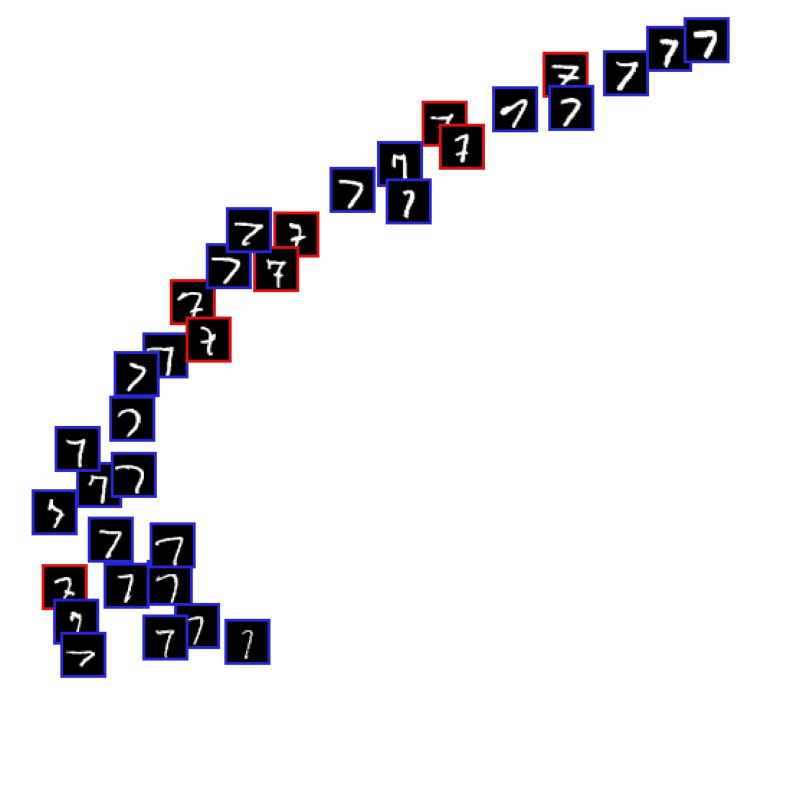

KM balanced accuracy score with hand-crafted labels :  0.5886906188992019
------------------------------------------------------------------
Epoch: 50 	Training Loss: 92.695670
         	Testing Loss: 73.402747


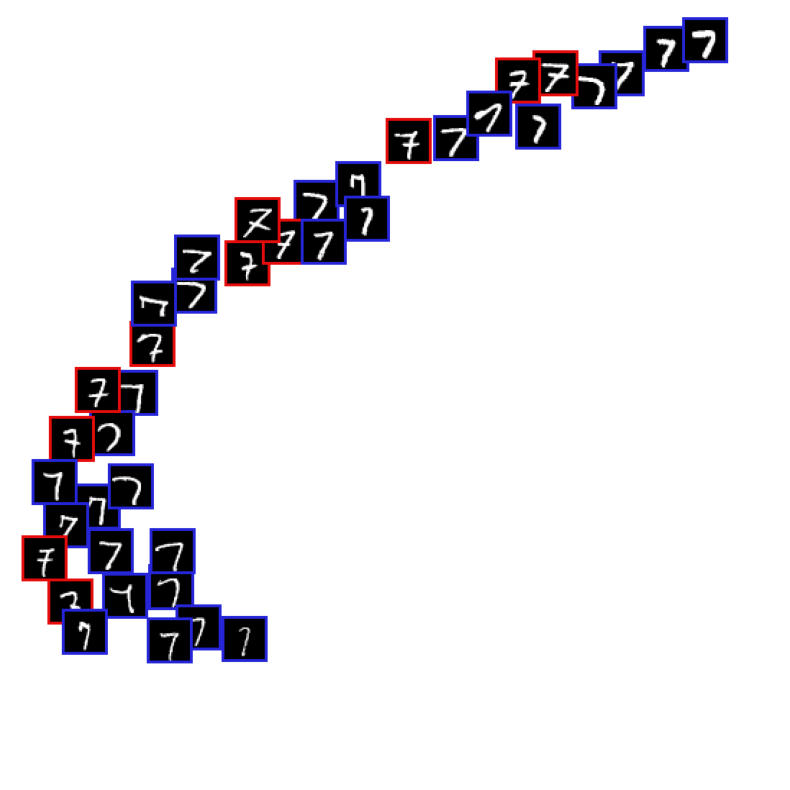

KM balanced accuracy score with hand-crafted labels :  0.5983148953659623
------------------------------------------------------------------
Epoch: 51 	Training Loss: 91.757579
         	Testing Loss: 72.757098


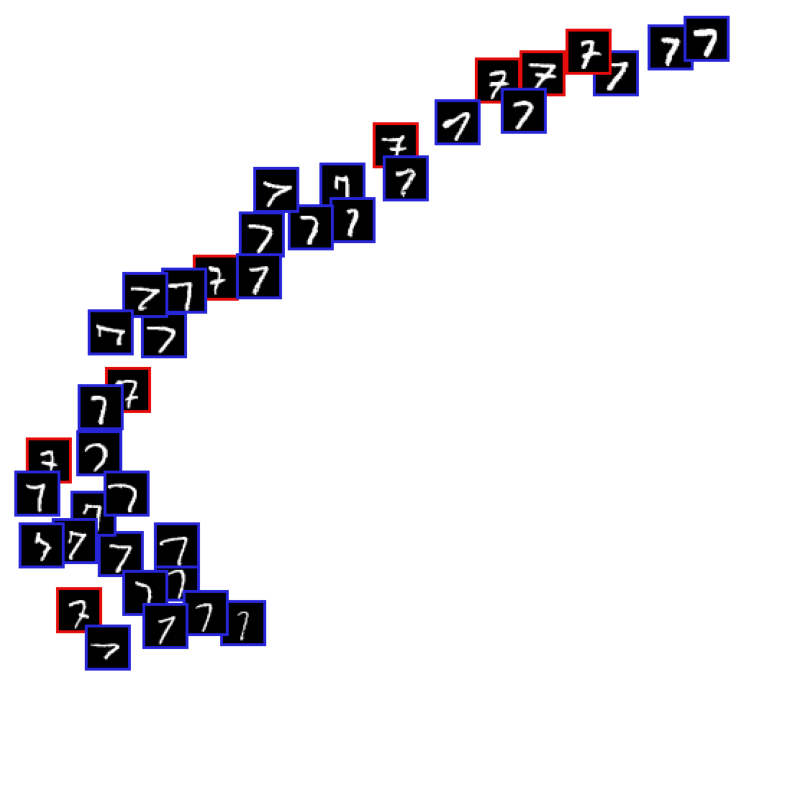

KM balanced accuracy score with hand-crafted labels :  0.592817755248827
------------------------------------------------------------------
Epoch: 52 	Training Loss: 91.893490
         	Testing Loss: 74.846447


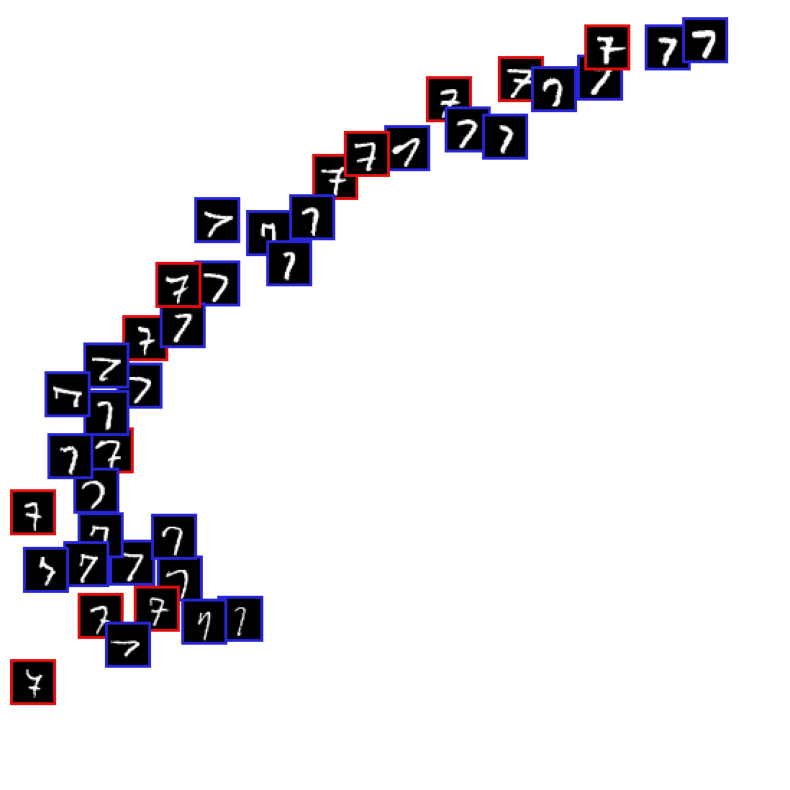

KM balanced accuracy score with hand-crafted labels :  0.5906428742679042
------------------------------------------------------------------
Epoch: 53 	Training Loss: 91.902365
         	Testing Loss: 71.429521


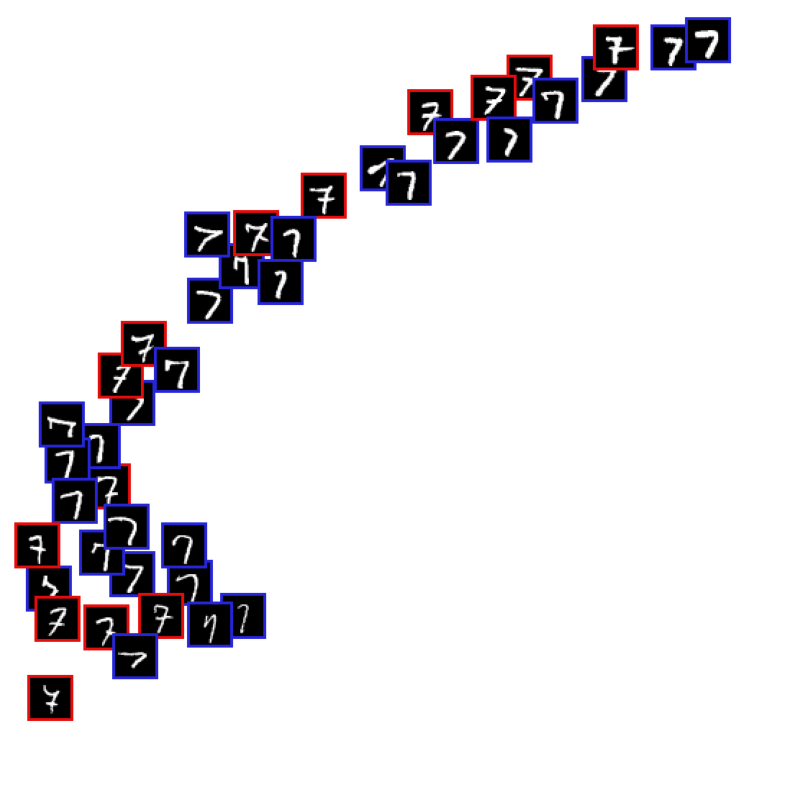

KM balanced accuracy score with hand-crafted labels :  0.58016234544645
------------------------------------------------------------------
Epoch: 54 	Training Loss: 91.642827
         	Testing Loss: 73.682516


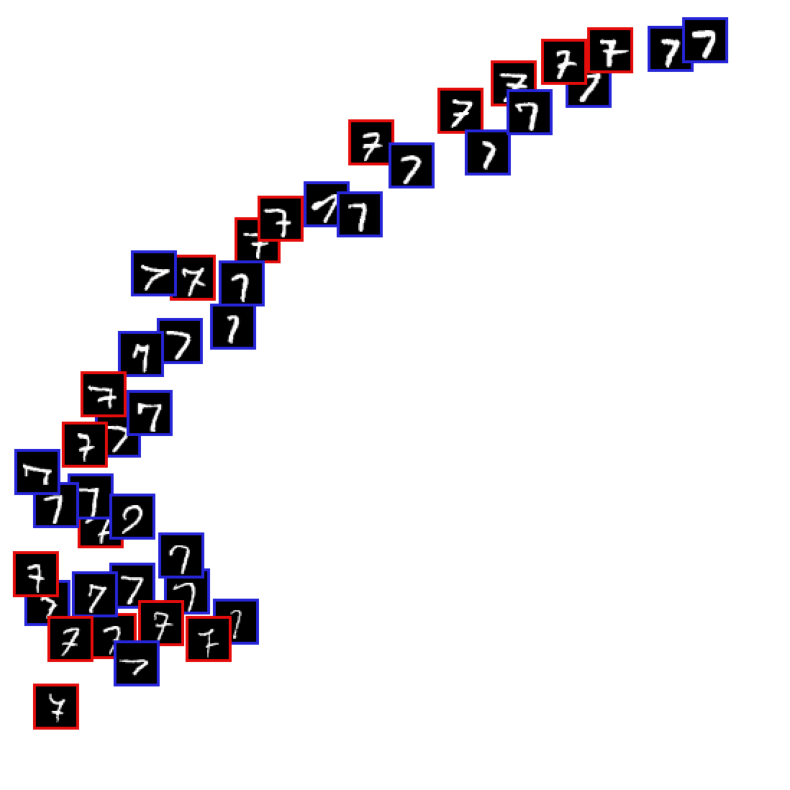

KM balanced accuracy score with hand-crafted labels :  0.5781587149364661
------------------------------------------------------------------
Epoch: 55 	Training Loss: 91.856770
         	Testing Loss: 73.693054


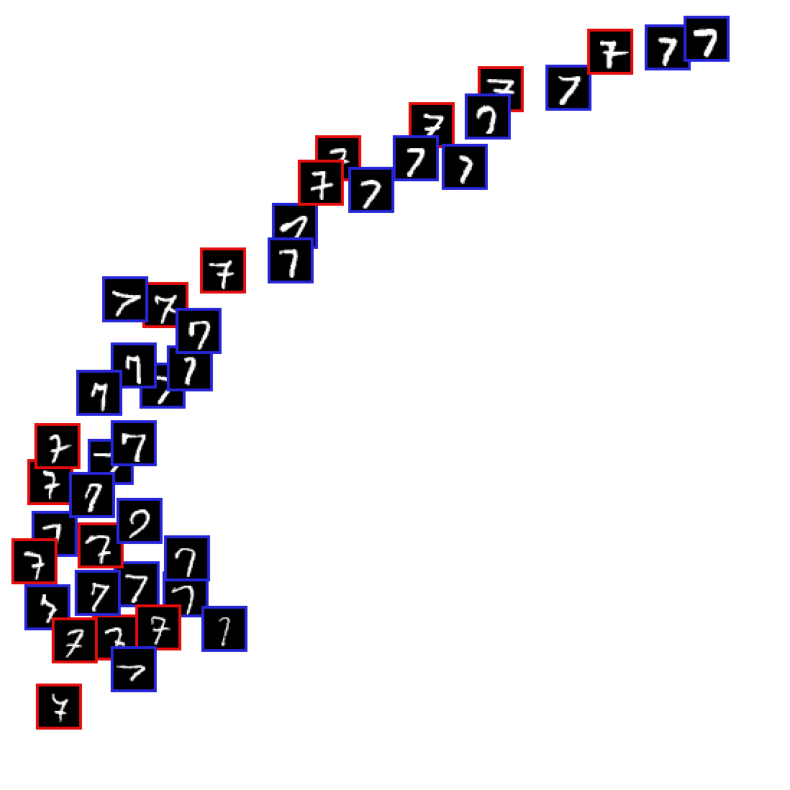

KM balanced accuracy score with hand-crafted labels :  0.5744939548583758
------------------------------------------------------------------
Epoch: 56 	Training Loss: 92.141242
         	Testing Loss: 75.354251


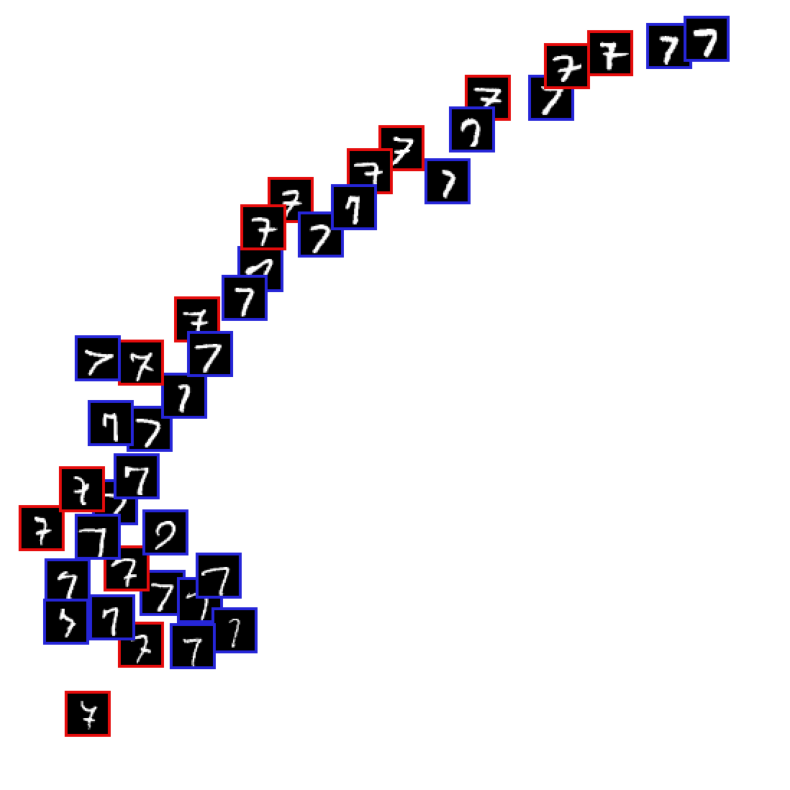

KM balanced accuracy score with hand-crafted labels :  0.5824571017570299
------------------------------------------------------------------
Epoch: 57 	Training Loss: 92.585777
         	Testing Loss: 70.139341


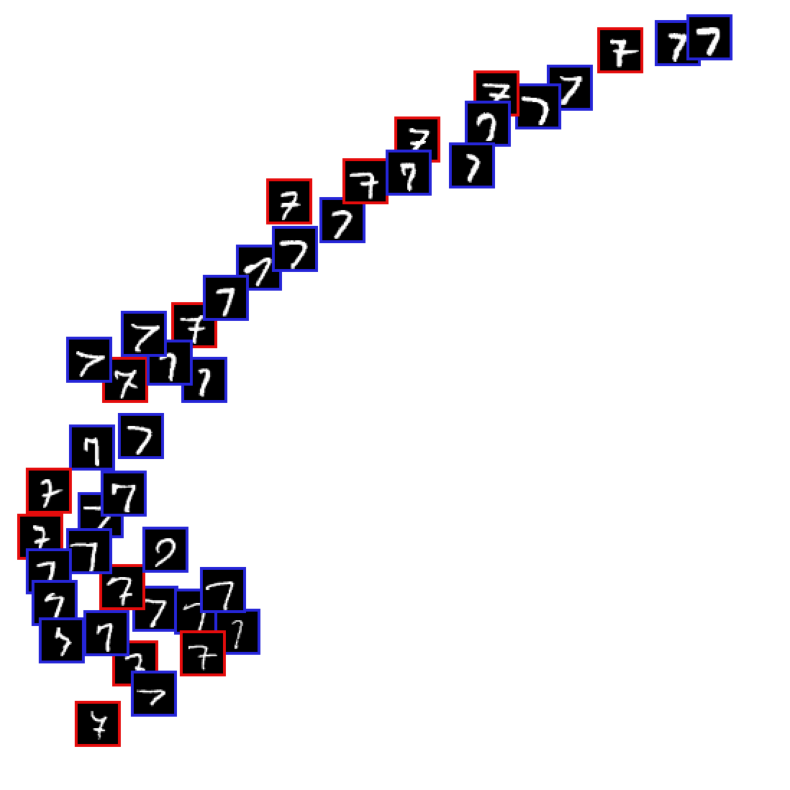

KM balanced accuracy score with hand-crafted labels :  0.5791348426208172
------------------------------------------------------------------
Epoch: 58 	Training Loss: 93.492758
         	Testing Loss: 70.368866


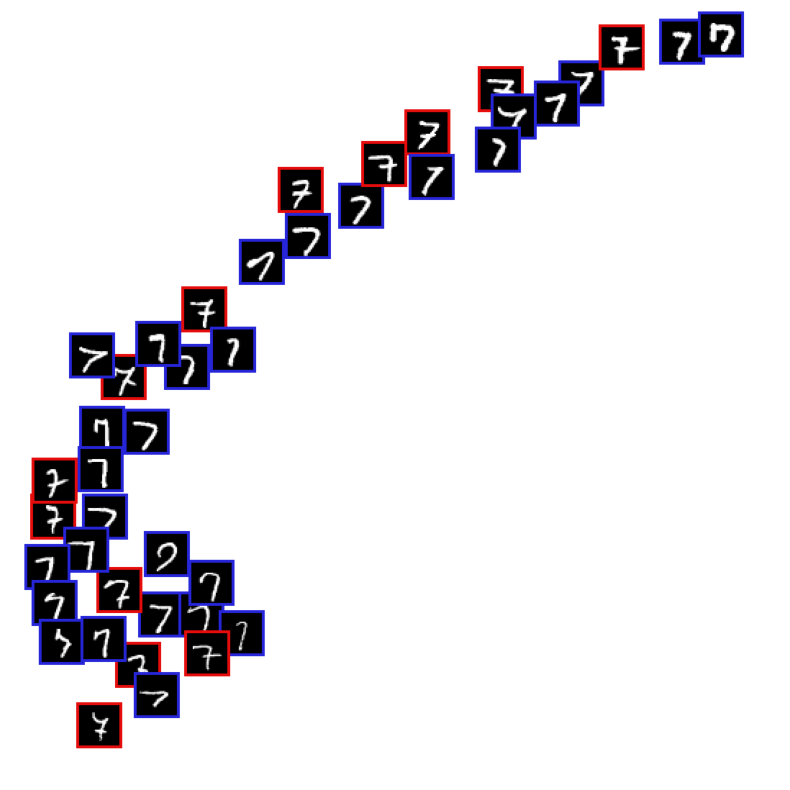

KM balanced accuracy score with hand-crafted labels :  0.5708291947802857
------------------------------------------------------------------
Epoch: 59 	Training Loss: 92.586883
         	Testing Loss: 70.172653


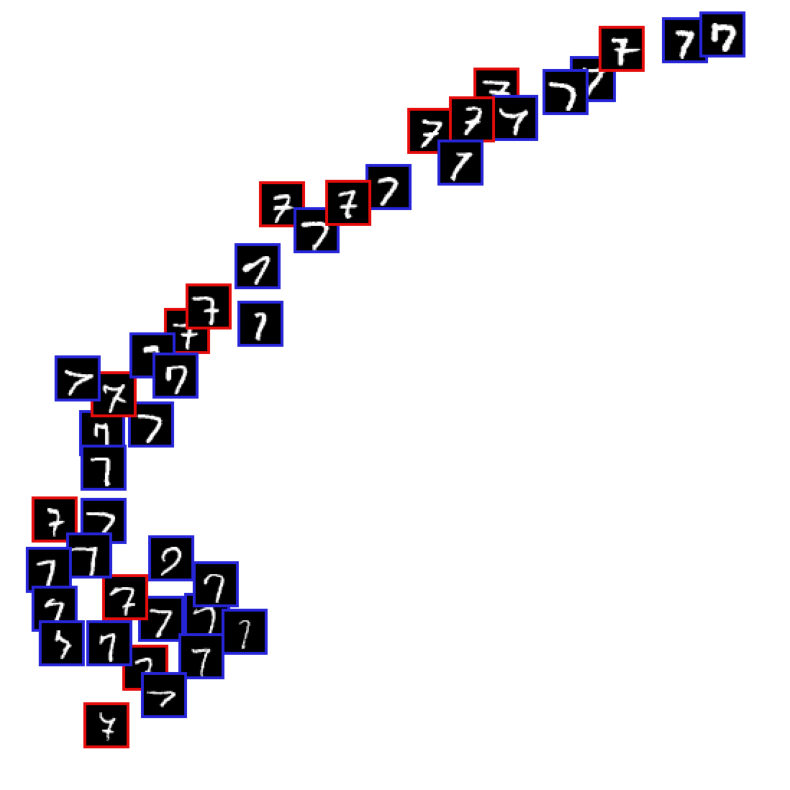

KM balanced accuracy score with hand-crafted labels :  0.5623522964688152
------------------------------------------------------------------
Epoch: 60 	Training Loss: 92.349973
         	Testing Loss: 70.850691


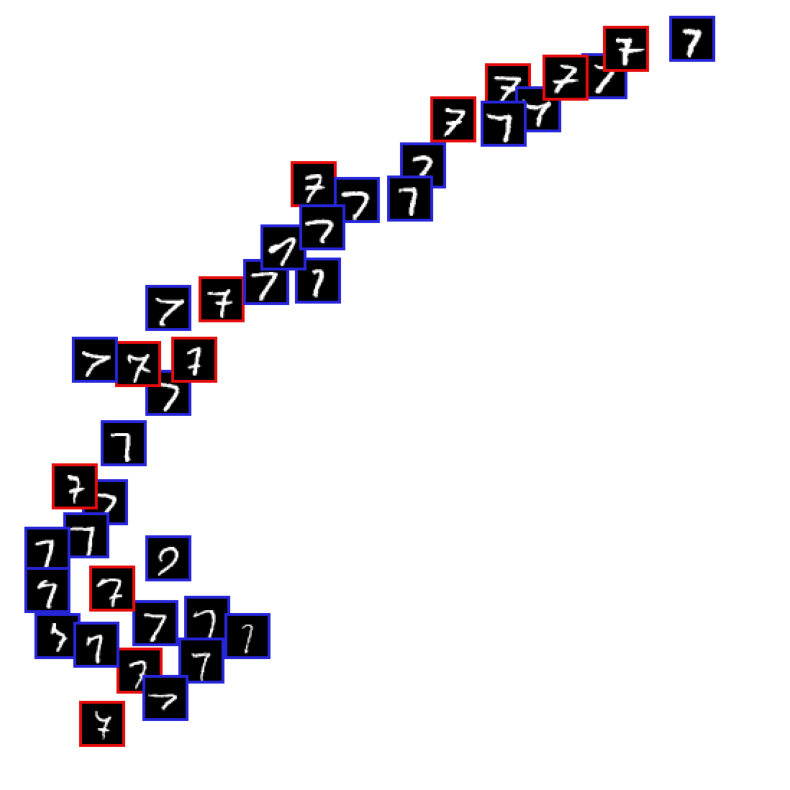

KM balanced accuracy score with hand-crafted labels :  0.5728328252902696
------------------------------------------------------------------
Epoch: 61 	Training Loss: 92.394659
         	Testing Loss: 71.584368


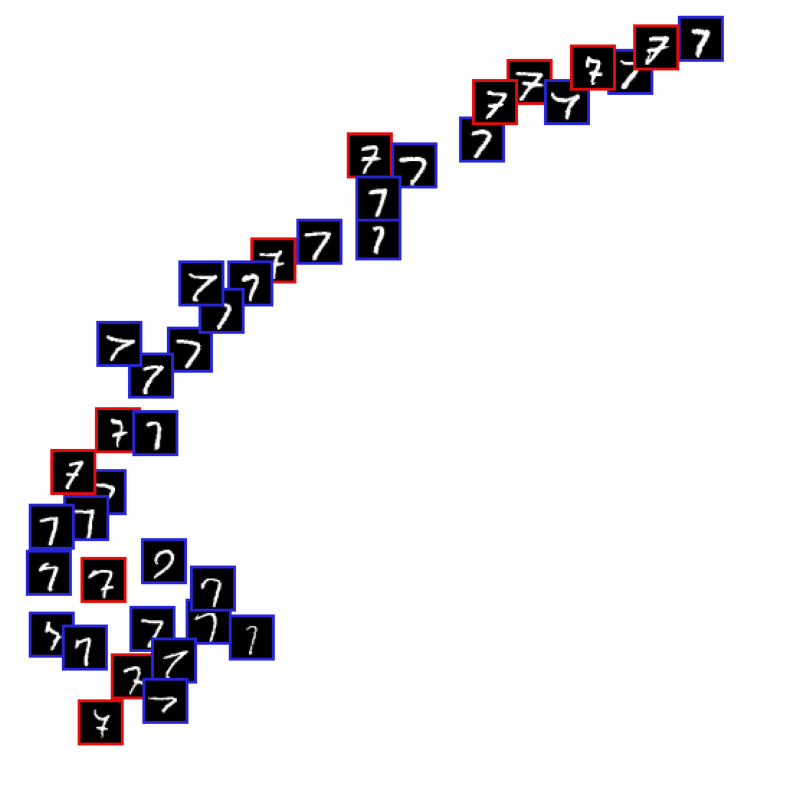

KM balanced accuracy score with hand-crafted labels :  0.5764975853683598
------------------------------------------------------------------
Epoch: 62 	Training Loss: 93.343771
         	Testing Loss: 71.669894


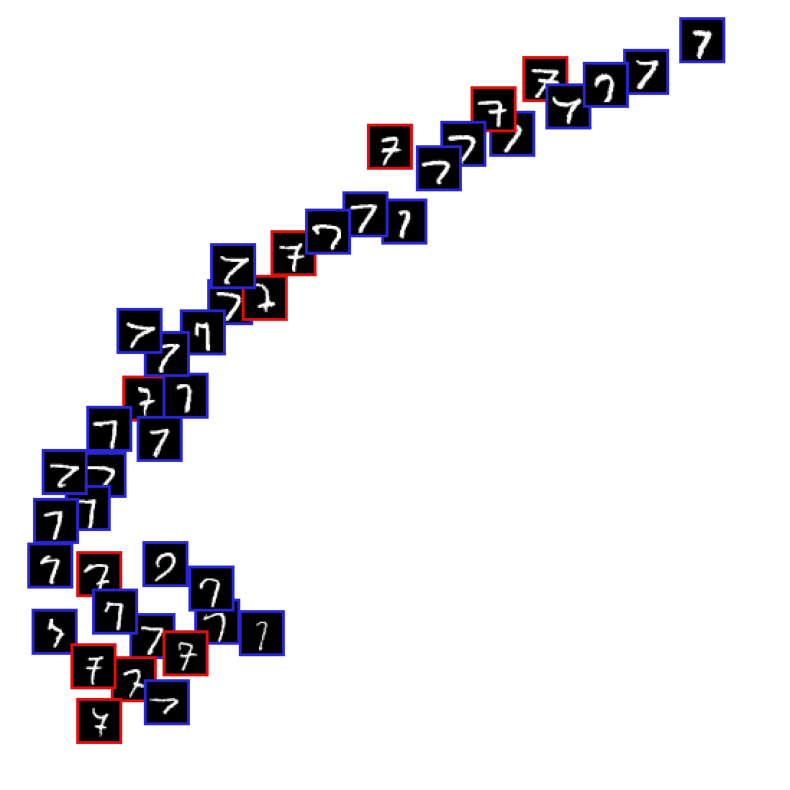

KM balanced accuracy score with hand-crafted labels :  0.5834846045826626
------------------------------------------------------------------
Epoch: 63 	Training Loss: 92.355510
         	Testing Loss: 72.140273


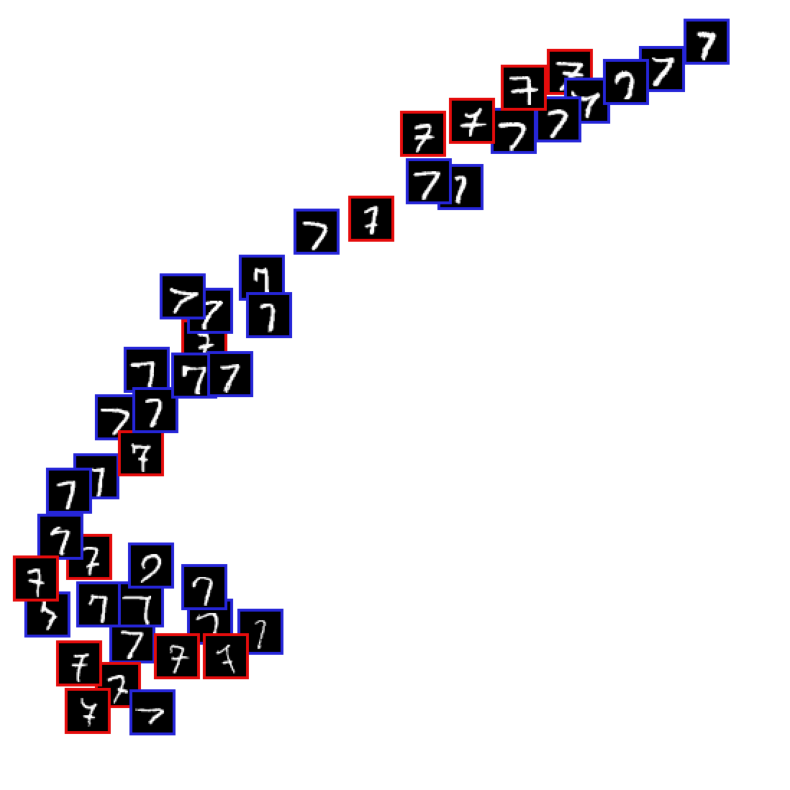

KM balanced accuracy score with hand-crafted labels :  0.5701955680378121
------------------------------------------------------------------
Epoch: 64 	Training Loss: 92.598926
         	Testing Loss: 72.685856


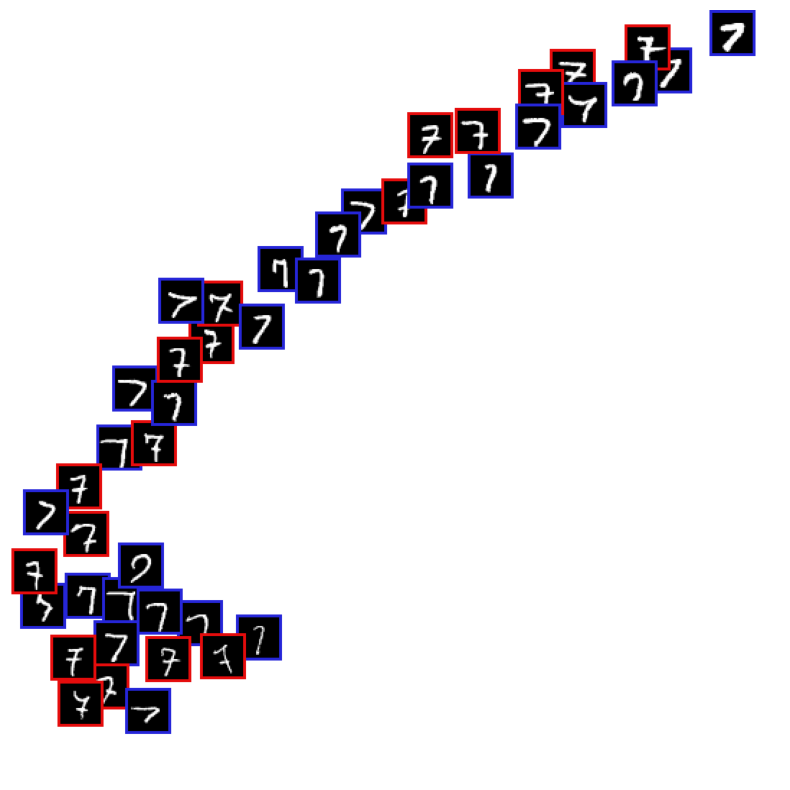

KM balanced accuracy score with hand-crafted labels :  0.565383429804432
------------------------------------------------------------------
Epoch: 65 	Training Loss: 92.789911
         	Testing Loss: 71.334842


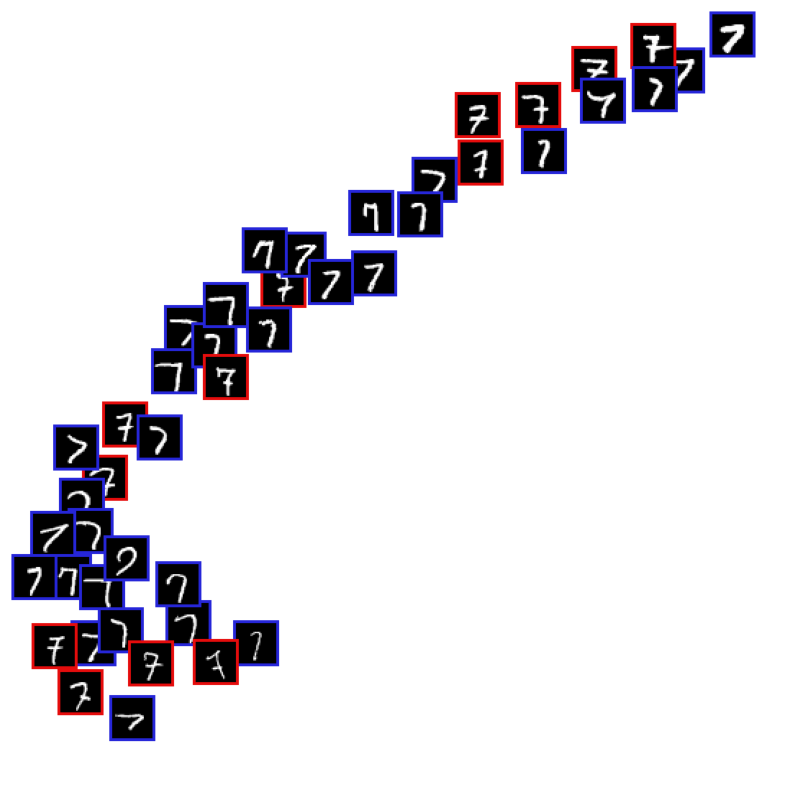

KM balanced accuracy score with hand-crafted labels :  0.5762064595677638
------------------------------------------------------------------
Epoch: 66 	Training Loss: 92.703193
         	Testing Loss: 73.564264


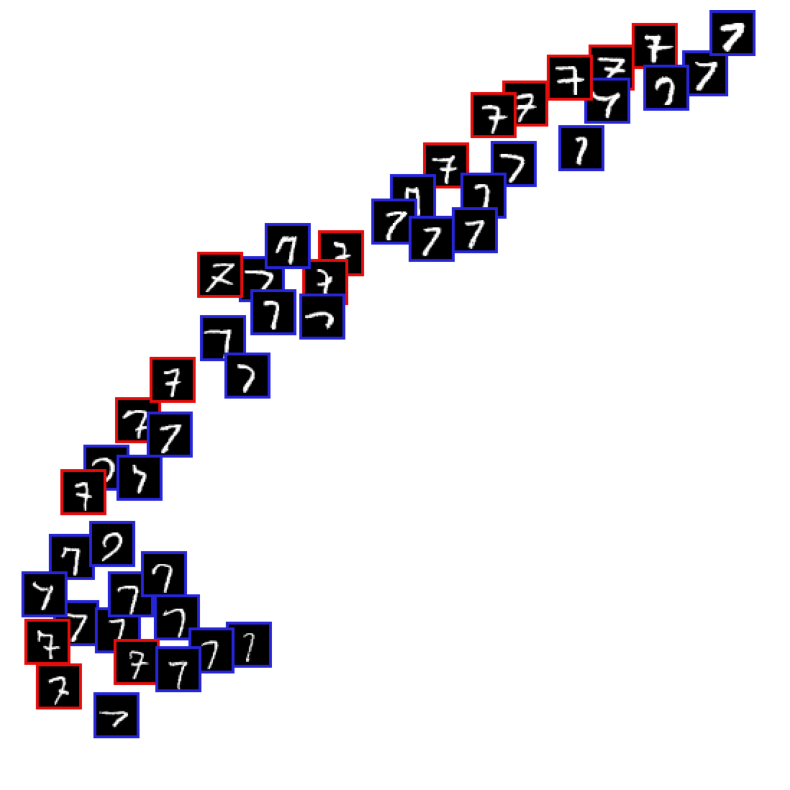

KM balanced accuracy score with hand-crafted labels :  0.5885193684282632
------------------------------------------------------------------
Epoch: 67 	Training Loss: 92.634592
         	Testing Loss: 73.351507


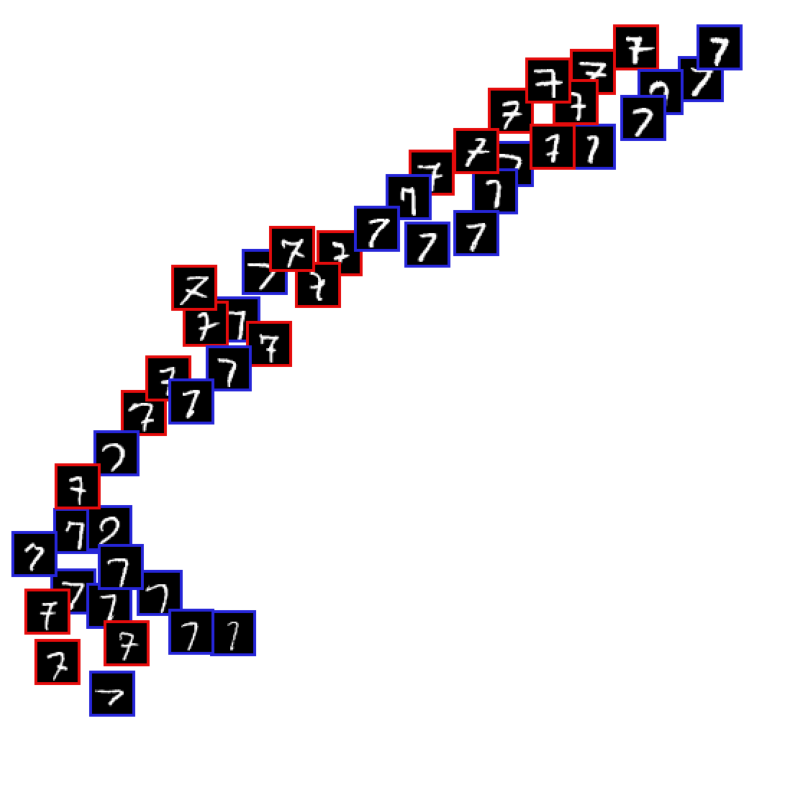

KM balanced accuracy score with hand-crafted labels :  0.5765489605096414
------------------------------------------------------------------
Epoch: 68 	Training Loss: 92.057294
         	Testing Loss: 71.602116


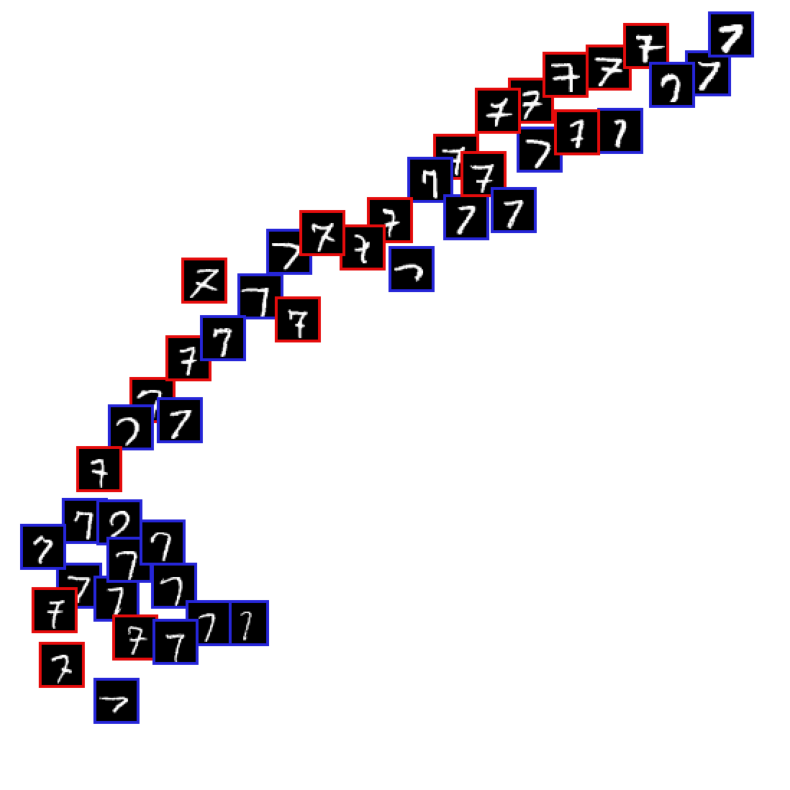

KM balanced accuracy score with hand-crafted labels :  0.5717368222762613
------------------------------------------------------------------
Epoch: 69 	Training Loss: 92.857667
         	Testing Loss: 72.110262


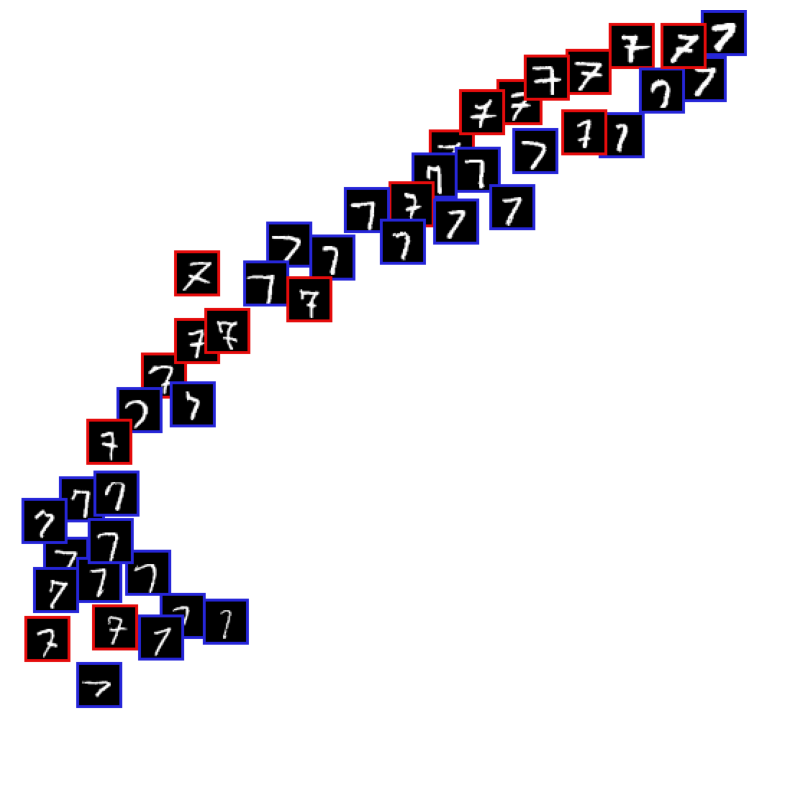

KM balanced accuracy score with hand-crafted labels :  0.576891461451519
------------------------------------------------------------------
Epoch: 70 	Training Loss: 92.031767
         	Testing Loss: 72.411725


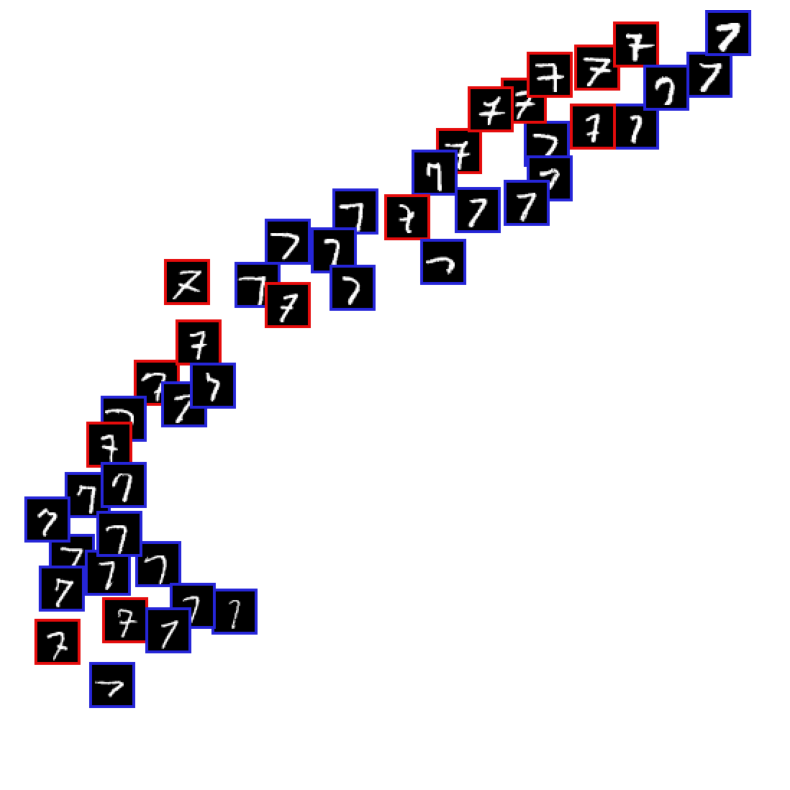

KM balanced accuracy score with hand-crafted labels :  0.5785525910196253
------------------------------------------------------------------
Epoch: 71 	Training Loss: 92.368789
         	Testing Loss: 72.761775


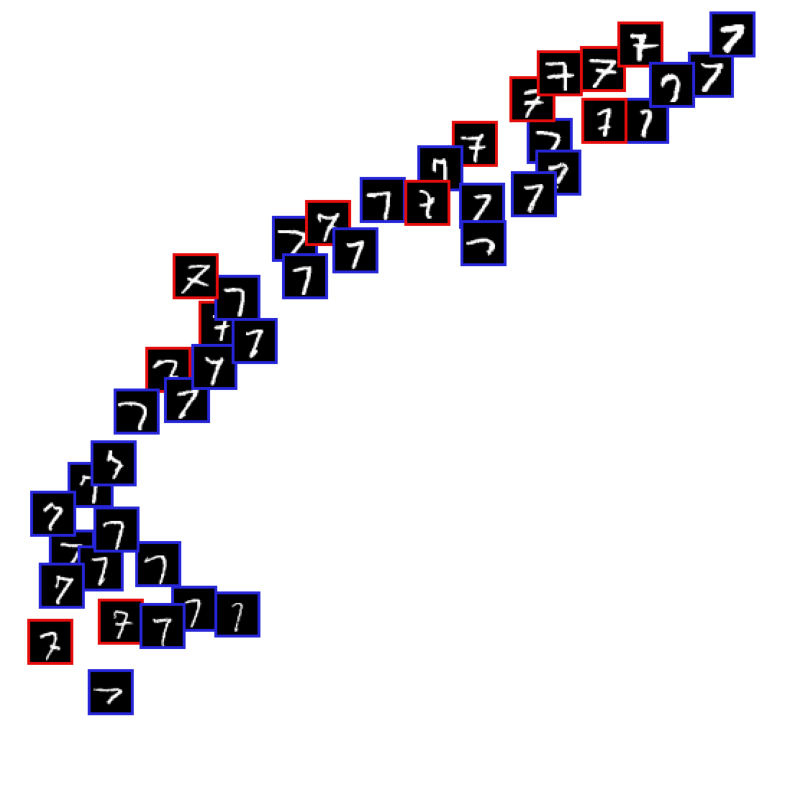

KM balanced accuracy score with hand-crafted labels :  0.5735692023153063
------------------------------------------------------------------
Epoch: 72 	Training Loss: 92.847441
         	Testing Loss: 73.616650


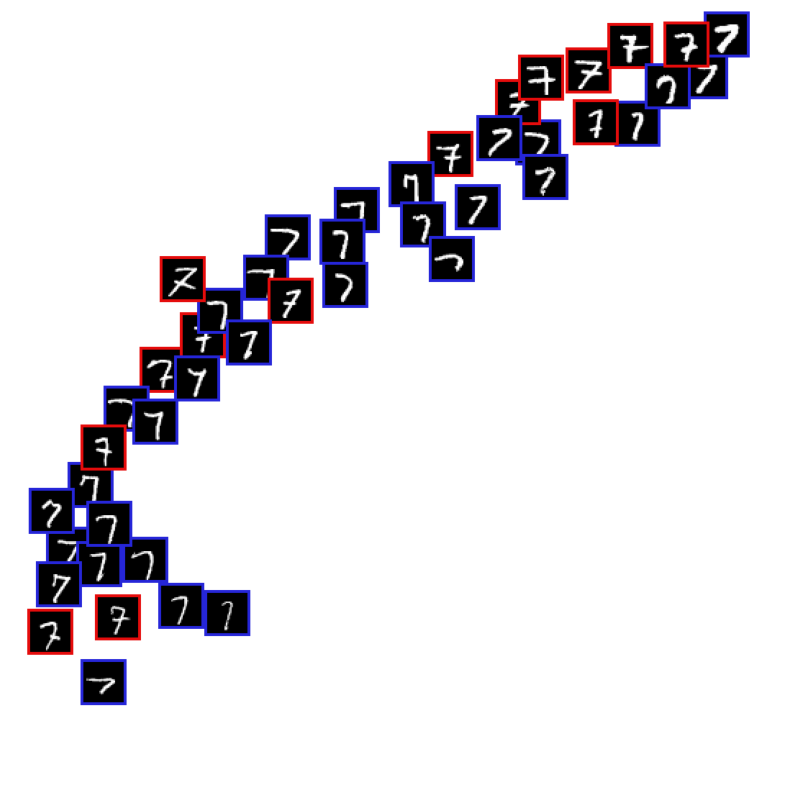

KM balanced accuracy score with hand-crafted labels :  0.576891461451519
------------------------------------------------------------------
Epoch: 73 	Training Loss: 92.152206
         	Testing Loss: 73.027618


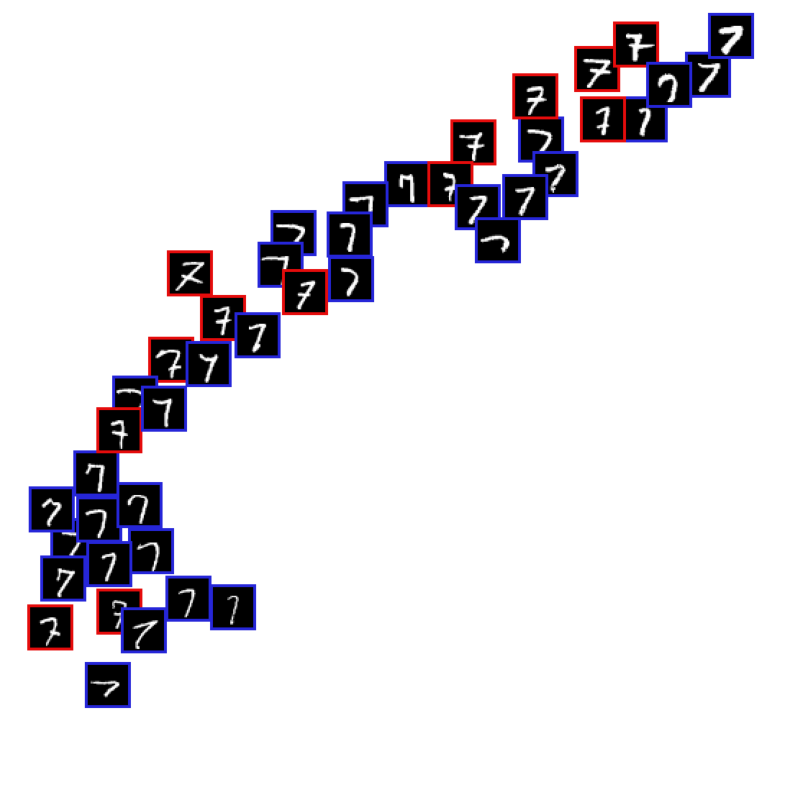

KM balanced accuracy score with hand-crafted labels :  0.576891461451519
------------------------------------------------------------------
Epoch: 74 	Training Loss: 92.659991
         	Testing Loss: 71.745180


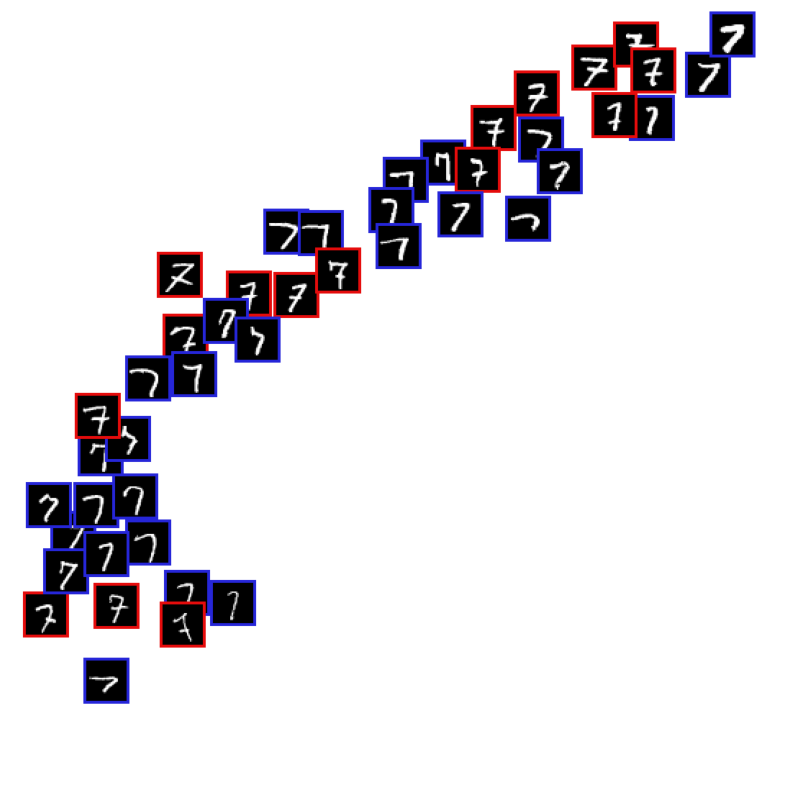

KM balanced accuracy score with hand-crafted labels :  0.5752303318834127
------------------------------------------------------------------
Epoch: 75 	Training Loss: 92.749350
         	Testing Loss: 71.795645


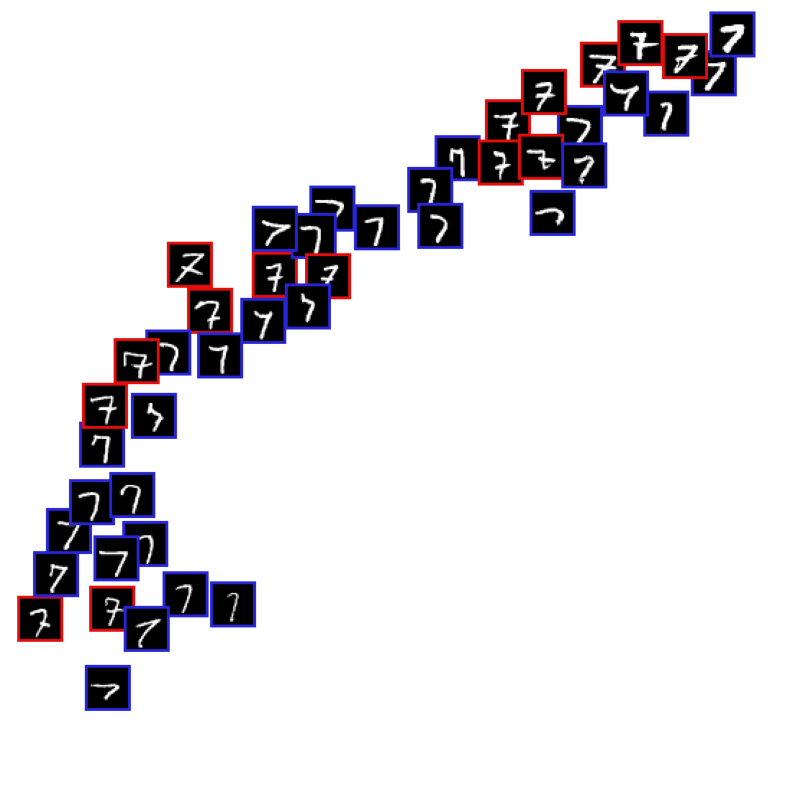

KM balanced accuracy score with hand-crafted labels :  0.5705894441209713
------------------------------------------------------------------
---------------------------
---------------------------
---------------------------


In [ ]:
# model parameters
hidden_mlp = 128
output_dim = 128
n_clusters=2
nc=1
batch_size = 256

# number of epochs to train the model
n_epochs = 75

for run in range(1, 3) :
  # build model
  clustering_model = SimpleConvNet(nc, hidden_mlp, output_dim, n_clusters).float().cuda()
  clustering_model.eval()

  # dataset
  train_data = MyDataset(X_train, y_train, test=True)
  test_data = MyDataset(X_test, y_test, test=True)
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
  test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)
  # transform features
  with torch.no_grad() :
    X_train_latent = torch.zeros((0, output_dim), device="cuda")
    for data in train_loader:
        images, _, _ = data
        _, encoded_vectors = clustering_model.forward(images)
        X_train_latent = torch.cat((X_train_latent, encoded_vectors), dim=0)
    X_test_latent = torch.zeros((0, output_dim), device="cuda")
    for data in test_loader:
        images, _, _ = data
        _, encoded_vectors = clustering_model.forward(images)
        X_test_latent = torch.cat((X_test_latent, encoded_vectors), dim=0)
  # KMeans training
  KMeans_method = SphericalKMeans(n_clusters=n_clusters).fit(X_train_latent)
  y_train_clustering_pseudo_labels = KMeans_method.predict(X_train_latent)
  y_test_clustering_pseudo_labels = KMeans_method.predict(X_test_latent)
  # Get barycenters and update model last layer
  barycenters = [ X_train_latent[y_train_clustering_pseudo_labels==label].mean(0) for label in [0, 1] ]
  clustering_model.prototypes.weight = torch.nn.Parameter(torch.nn.functional.normalize(torch.stack(barycenters).cuda(), dim=1, p=2))

  print("KM balanced accuracy score with hand-crafted labels : ",
          max(balanced_accuracy_score(y_ground_truth, y_test_clustering_pseudo_labels.detach().cpu().numpy()[:len(y_ground_truth)]),
          balanced_accuracy_score(1-y_ground_truth, y_test_clustering_pseudo_labels.detach().cpu().numpy()[:len(y_ground_truth)]))
          )
  print('------------------------------------------------------------------')

  # dataloaders
  train_data = MyDataset(X_train, y_train, y_train_clustering_pseudo_labels.detach().cpu().numpy())
  test_data = MyDataset(X_test, y_test, y_test_clustering_pseudo_labels.detach().cpu().numpy())
  # prepare data loaders
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
  test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

  # specify loss function
  list_of_parameters = []
  list_of_parameters.extend(clustering_model.backbone.parameters())
  list_of_parameters.extend(clustering_model.projection_head.parameters())
  optimizer = torch.optim.Adam(list_of_parameters, lr=0.00001)

  train_losses = []
  test_losses = []
  test_accuracies = []
  train_accuracies = []


  # launch training
  for epoch in range(0, n_epochs+1):
      # monitor training loss
      train_loss = 0.0
      test_loss = 0.0

      ###################
      # train the model #
      ###################
      clustering_model.train()
      for it, data in enumerate(train_loader):
          # _ stands in for labels, here no need to flatten images
          _, images, labels, cluster_pseudo_labels = data
          # forward pass: compute predicted outputs by passing inputs to the model
          y_pred, _ = clustering_model.forward(images)
          # calculate the loss
          train_loss_i = nn.CrossEntropyLoss()(y_pred, cluster_pseudo_labels.long())
          # backward pass: compute gradient of the loss with respect to model parameters
          train_loss_i.backward()
          # perform a single optimization step (parameter update)
          optimizer.step()
          # update running training loss
          train_loss += train_loss_i.item()*images.size(0)
          # clear the gradients of all optimized variables
          optimizer.zero_grad()

      ######################
      # evaluate the model #
      ######################
      clustering_model.eval()
      with torch.no_grad():
        for i, data in enumerate(test_loader):
            # _ stands in for labels, here no need to flatten images
            _, images, labels, cluster_pseudo_labels = data
            # forward pass: compute predicted outputs by passing inputs to the model
            y_pred, _ = clustering_model.forward(images)
            # calculate the loss
            test_loss_i = nn.CrossEntropyLoss()(y_pred, cluster_pseudo_labels.long())
            # update running testing loss
            test_loss += test_loss_i.item()*images.size(0)

      # print avg training statistics
      train_loss = train_loss/len(train_loader)
      test_loss = test_loss/len(test_loader)
      #
      train_losses.append(train_loss)
      test_losses.append(test_loss)
      print('Epoch: {} \tTraining Loss: {:.6f}'.format(
          epoch,
          train_loss
          ))
      print('         \tTesting Loss: {:.6f}'.format(
          test_loss
          ))

      # dataset
      train_data = MyDataset(X_train, y_train, test=True)
      test_data = MyDataset(X_test, y_test, test=True)
      train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
      test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)
      # transform features
      with torch.no_grad() :
        X_train_latent = torch.zeros((0, output_dim), device="cuda")
        for data in train_loader:
            images, _, _ = data
            _, encoded_vectors = clustering_model.forward(images)
            X_train_latent = torch.cat((X_train_latent, encoded_vectors), dim=0)
        X_test_latent = torch.zeros((0, output_dim), device="cuda")
        for data in test_loader:
            images, _, _ = data
            _, encoded_vectors = clustering_model.forward(images)
            X_test_latent = torch.cat((X_test_latent, encoded_vectors), dim=0)
      # KMeans training
      KMeans_method = SphericalKMeans(n_clusters=n_clusters).fit(X_train_latent)
      y_train_clustering_pseudo_labels = KMeans_method.predict(X_train_latent)
      y_test_clustering_pseudo_labels = KMeans_method.predict(X_test_latent)
      # Get barycenters and update model last layer
      barycenters = [ X_train_latent[y_train_clustering_pseudo_labels==label].mean(0) for label in [0, 1] ]
      clustering_model.prototypes.weight = torch.nn.Parameter(torch.nn.functional.normalize(torch.stack(barycenters).cuda(), dim=1, p=2))

      # PCA
      pca = PCA().fit(X_train_latent.cpu().numpy())
      X_test_latent_pca = pca.transform(X_test_latent.cpu().numpy())
      create_visualization(X_test_latent.cpu().numpy(), X_test, 7*np.ones_like(y_test_clustering_pseudo_labels.detach().cpu().numpy()),
                           y_ground_truth, y_test_clustering_pseudo_labels.detach().cpu().numpy())

      print("KM balanced accuracy score with hand-crafted labels : ",
              max(balanced_accuracy_score(y_ground_truth, y_test_clustering_pseudo_labels.detach().cpu().numpy()[:len(y_ground_truth)]),
              balanced_accuracy_score(1-y_ground_truth, y_test_clustering_pseudo_labels.detach().cpu().numpy()[:len(y_ground_truth)]))
              )
      print('------------------------------------------------------------------')


      # dataloaders
      train_data = MyDataset(X_train, y_train, y_train_clustering_pseudo_labels.detach().cpu().numpy())
      test_data = MyDataset(X_test, y_test, y_test_clustering_pseudo_labels.detach().cpu().numpy())
      # prepare data loaders
      train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
      test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

  print('---------------------------')
  print('---------------------------')
  print('---------------------------')

In [ ]:
plt.plot(train_losses)
plt.plot(test_losses)

In [ ]:
results = [0.5893, 0.5752, 0.5390]